**Data Architecture project** \
    Giovanni Bishara
    Probjot Singh
    

# Preliminary Analysis & Combo Experiments

## Import aggregated csv

In [101]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json

In [104]:
# Import the aggregated metrics
df = pd.read_csv('../experiments_pipeline/aggregated_metrics.csv')

df.head()

1430


,experiment_name,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
0,experiment #1,SVM,0.740321,0.743926,0.745027,0.740321,0.371963,0.372513,1.000000,NaN,NaN,0.850787,0.426581,0.426943
1,experiment #1,Decision Tree,0.787535,0.788408,0.808945,0.865359,0.723522,0.749238,0.844388,0.726241,0.749991,0.854745,0.724852,0.748685
2,experiment #2,SVM,0.979226,0.975209,0.984755,0.978643,0.971815,0.985081,0.993622,0.961223,0.976450,0.986076,0.967081,0.979755
3,experiment #2,Decision Tree,0.978281,0.974336,0.982607,0.984713,0.964085,0.976725,0.985969,0.967372,0.979471,0.985341,0.966386,0.977234
4,experiment #3,SVM,0.740321,0.743926,0.745027,0.740321,0.371963,0.372513,1.000000,NaN,NaN,0.850787,0.426581,0.426943


In [3]:
# Add a new column experiment_id in the first position and drop experiment_name
df.insert(loc=0, column='experiment_id', value=df['experiment_name'].str.extract(r'#(\d+)').astype(int))
df.drop(columns=['experiment_name'], inplace=True)

# Make sure each metric is between 0 and 1 (for the 95% confidence intervals)
for col in df.columns[2:]:
    df[col] = df[col].clip(0, 1)

df.head()

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
0,1,SVM,0.740321,0.743926,0.745027,0.740321,0.371963,0.372513,1.000000,NaN,NaN,0.850787,0.426581,0.426943
1,1,Decision Tree,0.787535,0.788408,0.808945,0.865359,0.723522,0.749238,0.844388,0.726241,0.749991,0.854745,0.724852,0.748685
2,2,SVM,0.979226,0.975209,0.984755,0.978643,0.971815,0.985081,0.993622,0.961223,0.976450,0.986076,0.967081,0.979755
3,2,Decision Tree,0.978281,0.974336,0.982607,0.984713,0.964085,0.976725,0.985969,0.967372,0.979471,0.985341,0.966386,0.977234
4,3,SVM,0.740321,0.743926,0.745027,0.740321,0.371963,0.372513,1.000000,NaN,NaN,0.850787,0.426581,0.426943


## Import ML pipeline csv and concat

In [4]:
# Import the ML pipeline metrics
df_ml = pd.read_csv('../ml_pipeline/performance/metrics.csv')
# Add the experiment_id as 0 ("fake experiment" used in df)
df_ml.insert(0, 'experiment_id', 0)

df_ml.head()

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
0,0,SVM,0.985836,0.983597,0.986564,0.988564,0.977246,0.983993,0.992347,0.977659,0.982869,0.990452,0.978455,0.982324
1,0,Decision Tree,0.978281,0.975099,0.982601,0.981037,0.967651,0.975621,0.989796,0.965958,0.979891,0.985397,0.967159,0.977260


In [5]:
# Keep the original DataFrame in another variable
df_original = df.copy()

# Concatenate the two DataFrames, to have one containing both metrics from experiment 0 and "real" experiments
df = pd.concat([df_ml, df], ignore_index=True)

df.head()

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
0,0,SVM,0.985836,0.983597,0.986564,0.988564,0.977246,0.983993,0.992347,0.977659,0.982869,0.990452,0.978455,0.982324
1,0,Decision Tree,0.978281,0.975099,0.982601,0.981037,0.967651,0.975621,0.989796,0.965958,0.979891,0.985397,0.967159,0.977260
2,1,SVM,0.740321,0.743926,0.745027,0.740321,0.371963,0.372513,1.000000,NaN,NaN,0.850787,0.426581,0.426943
3,1,Decision Tree,0.787535,0.788408,0.808945,0.865359,0.723522,0.749238,0.844388,0.726241,0.749991,0.854745,0.724852,0.748685
4,2,SVM,0.979226,0.975209,0.984755,0.978643,0.971815,0.985081,0.993622,0.961223,0.976450,0.986076,0.967081,0.979755


## Sub-DataFrames by model name

In [6]:
# Create different DataFrames, one for each model

model_names = df_original['model_name'].unique()

sub_df_dict = {
    model_name: df_original[df_original['model_name'] == model_name]
    for model_name in model_names
}

In [7]:
# Create a DataFrame with the three types of SVM instance
all_svm_df = pd.concat([sub_df_dict['SVM'], sub_df_dict['SVM (mean)'], sub_df_dict['SVM (EM)']], ignore_index=True)

# Sort it by experiment ID and model name
all_svm_df = all_svm_df.sort_values(by=['experiment_id', 'model_name'])

In [8]:
# DataFrame for Decision Tree
all_dtc_df = sub_df_dict['Decision Tree']

## Describe

In [9]:
df_original.describe()

,experiment_id,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
count,1430.000000,1430.000000,1430.000000,1430.000000,1430.000000,1430.000000,1430.000000,1430.000000,1223.000000,1223.000000,1430.000000,1430.000000,1430.000000
mean,310.483217,0.853985,0.865481,0.876800,0.870141,0.799212,0.815236,0.896411,0.860010,0.878000,0.875787,0.797210,0.812065
std,197.228614,0.220300,0.149467,0.146666,0.226924,0.234950,0.235368,0.255186,0.166904,0.161452,0.239406,0.221722,0.221693
min,1.000000,0.016997,0.088087,0.105386,0.000000,0.086288,0.103404,0.000000,0.089667,0.107212,0.000000,0.087454,0.104587
25%,125.250000,0.740321,0.743926,0.754237,0.769535,0.656621,0.685065,0.980867,0.784468,0.811418,0.850787,0.600971,0.630814
50%,304.000000,0.975449,0.966151,0.976133,0.978643,0.955846,0.971432,0.991071,0.961082,0.976298,0.983397,0.955446,0.968452
75%,482.750000,0.980170,0.977038,0.985640,0.983565,0.972764,0.985363,0.994898,0.967822,0.980132,0.986616,0.969510,0.980896
max,659.000000,0.985836,0.994074,0.997992,1.000000,0.992302,0.998299,1.000000,0.991699,0.997135,0.990440,0.992203,0.997355


In [10]:
# SVM DataFrame
sub_df_dict['SVM'].describe()

,experiment_id,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
count,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,342.000000,342.000000,547.000000,547.000000,547.000000
mean,381.021938,0.799511,0.833819,0.841496,0.784334,0.692303,0.704457,0.892647,0.862482,0.879881,0.830496,0.696829,0.707601
std,160.083047,0.241978,0.132511,0.133955,0.282365,0.279695,0.283610,0.300819,0.152529,0.149625,0.285025,0.251429,0.255823
min,1.000000,0.016997,0.501505,0.509234,0.000000,0.212752,0.254617,0.000000,0.490113,0.499903,0.000000,0.337015,0.337412
25%,245.500000,0.740321,0.743926,0.745027,0.740321,0.371963,0.372513,0.993622,0.737199,0.761408,0.850787,0.426581,0.426943
50%,382.000000,0.810198,0.799174,0.811088,0.858506,0.777206,0.804001,0.993622,0.961052,0.976541,0.886376,0.687591,0.716292
75%,518.500000,0.979226,0.975655,0.985109,0.979221,0.972340,0.985215,1.000000,0.963280,0.977997,0.986076,0.967544,0.980118
max,658.000000,0.983003,0.982697,0.987721,0.996769,0.980613,0.987216,1.000000,0.979591,0.986017,0.988564,0.980238,0.985835


In [11]:
# SVM (mean) DataFrame
sub_df_dict['SVM (mean)'].describe()

,experiment_id,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
count,112.000000,112.000000,112.000000,112.000000,112.000000,112.000000,112.000000,112.000000,111.000000,111.000000,112.000000,112.000000,112.000000
mean,80.812500,0.946749,0.927342,0.937511,0.941514,0.936465,0.951311,0.986220,0.875581,0.893497,0.962008,0.884488,0.901622
std,115.413517,0.091712,0.081282,0.079014,0.111381,0.092699,0.084006,0.094075,0.129681,0.124632,0.098833,0.137161,0.129364
min,6.000000,0.259679,0.475551,0.504833,0.000000,0.327454,0.327873,0.000000,0.475388,0.504509,0.000000,0.395510,0.396042
25%,33.750000,0.962937,0.895289,0.907107,0.953687,0.923067,0.940725,0.992347,0.801909,0.826072,0.975526,0.839043,0.862433
50%,61.500000,0.980170,0.974796,0.983794,0.978670,0.972592,0.984647,0.994898,0.961346,0.975954,0.986675,0.966292,0.978458
75%,89.250000,0.982059,0.978368,0.985953,0.983565,0.974440,0.985741,0.997449,0.966926,0.979268,0.987937,0.971404,0.981416
max,659.000000,0.983947,0.980756,0.987090,0.984810,0.976885,0.987522,1.000000,0.970502,0.981284,0.989220,0.974541,0.982923


In [12]:
# SVM (EM) DataFrame
sub_df_dict['SVM (EM)'].describe()

,experiment_id,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
count,112.000000,112.000000,112.000000,112.000000,112.000000,112.000000,112.000000,112.000000,111.000000,111.000000,112.000000,112.000000,112.000000
mean,80.812500,0.969319,0.972579,0.980198,0.970043,0.966192,0.976966,0.981380,0.965801,0.976943,0.975317,0.962713,0.973308
std,115.413517,0.075049,0.060153,0.058741,0.098128,0.079985,0.079137,0.093978,0.058643,0.054888,0.094821,0.084145,0.079771
min,6.000000,0.259679,0.484978,0.502484,0.000000,0.327454,0.327873,0.000000,0.484859,0.502325,0.000000,0.395737,0.396042
25%,33.750000,0.979226,0.979792,0.987366,0.979899,0.975815,0.986980,0.990753,0.970020,0.980999,0.986067,0.973286,0.983261
50%,61.500000,0.982059,0.981173,0.989030,0.983575,0.977518,0.988505,0.992347,0.971822,0.983902,0.987921,0.975120,0.985477
75%,89.250000,0.983003,0.984653,0.991850,0.984829,0.980580,0.991006,0.993622,0.977892,0.988363,0.988564,0.979723,0.989238
max,659.000000,0.985836,0.994074,0.997992,0.995885,0.992302,0.998299,1.000000,0.991699,0.997135,0.990440,0.992203,0.997355


In [13]:
# Decision Tree DataFrame
sub_df_dict['Decision Tree'].describe()

,experiment_id,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
count,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000
mean,330.000000,0.863835,0.863047,0.878212,0.912255,0.836246,0.856573,0.869830,0.838285,0.857748,0.881811,0.837570,0.856150
std,190.381197,0.219432,0.169643,0.163419,0.177464,0.183340,0.178332,0.245010,0.184084,0.177771,0.221822,0.184316,0.178115
min,1.000000,0.020774,0.088087,0.105386,0.000000,0.086288,0.103404,0.000000,0.089667,0.107212,0.000000,0.087454,0.104587
25%,165.500000,0.887630,0.808662,0.827589,0.949442,0.752958,0.777315,0.898597,0.754369,0.778733,0.920110,0.753767,0.777545
50%,330.000000,0.974504,0.966595,0.976388,0.982188,0.954287,0.970398,0.984694,0.955211,0.969219,0.982813,0.956228,0.968930
75%,494.500000,0.979226,0.974244,0.984996,0.985934,0.964116,0.981401,0.988520,0.967391,0.981328,0.985942,0.966262,0.980372
max,659.000000,0.984891,0.992259,0.996830,1.000000,0.990346,0.996346,1.000000,0.988952,0.996426,0.989848,0.989807,0.995827


## Combo Experiments

In [14]:
# Associate combo IDs to their description
combos = {
    '654': 'Drop PC3, PC4, PC5 & Missing Values 15% PC1, PC2 & Outliers 5% PC1 & Out Of Domain 5% PC2 & Flip Labels 3% 3% & Rows Same Label 10% & Rows Opposite Label 5% & Add Rows Random 1.5% & Add Rows Domain 3%',
    '655': 'Drop PC1, PC2 & Missing Values 50% PC3, PC4, PC5 & Flip Labels 10% 45% & Add Rows Random 35%',
    '656': 'Drop PC1, PC2, PC3, PC4 & Outliers 2% PC5',
    '657': 'Missing Values 30% PC1, PC2, PC3, PC4, PC5 & Flip Labels 10% 15%',
    '658': 'Drop PC1 & Flip Labels 100% 100% & Add Rows Random 20%',
    '659': 'Missing Values 35% PC2, PC3 & Out Of Domain 50% PC1, PC4, PC5 & Add Rows Domain 70%'
}

In [15]:
# Combo 654
combo_id = '654'

# Description
print(f'Combo {combo_id}:')
for sub_experiment in combos[combo_id].split(' & '):
    print(f'\t{sub_experiment}')

# Metrics
df_original[df_original['experiment_id'] == int(combo_id)]


Combo 654:
	Drop PC3, PC4, PC5
	Missing Values 15% PC1, PC2
	Outliers 5% PC1
	Out Of Domain 5% PC2
	Flip Labels 3% 3%
	Rows Same Label 10%
	Rows Opposite Label 5%
	Add Rows Random 1.5%
	Add Rows Domain 3%


,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1414,654,SVM (mean),0.740321,0.702248,0.711461,0.740321,0.490234,0.682603,1.000000,0.498499,0.522528,0.850787,0.413512,0.466814
1415,654,SVM (EM),0.740321,0.757502,0.794582,0.740321,0.766223,0.805012,1.000000,0.609511,0.677253,0.850787,0.611341,0.697291
1416,654,Decision Tree,0.898961,0.787567,0.803424,0.955585,0.744968,0.764558,0.905612,0.750440,0.769465,0.929928,0.747846,0.766146


In [16]:
# Combo 655
combo_id = '655'

# Description
print(f'Combo {combo_id}:')
for sub_experiment in combos[combo_id].split(' & '):
    print(f'\t{sub_experiment}')

# Metrics
df_original[df_original['experiment_id'] == int(combo_id)]

Combo 655:
	Drop PC1, PC2
	Missing Values 50% PC3, PC4, PC5
	Flip Labels 10% 45%
	Add Rows Random 35%


,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1417,655,SVM (mean),0.259679,0.475551,0.504833,0.000000,0.455131,0.509717,0.000000,0.475388,0.504509,0.000000,0.395510,0.441416
1418,655,SVM (EM),0.259679,0.484978,0.502484,0.000000,0.476993,0.504806,0.000000,0.484859,0.502325,0.000000,0.405205,0.452693
1419,655,Decision Tree,0.463645,0.509475,0.529915,0.772727,0.509602,0.530169,0.390306,0.509506,0.529934,0.518644,0.508482,0.528955


In [17]:
# Combo 656
combo_id = '656'

# Description
print(f'Combo {combo_id}:')
for sub_experiment in combos[combo_id].split(' & '):
    print(f'\t{sub_experiment}')

# Metrics
df_original[df_original['experiment_id'] == int(combo_id)]

Combo 656:
	Drop PC1, PC2, PC3, PC4
	Outliers 2% PC5


,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1420,656,SVM,0.740321,0.743926,0.745027,0.740321,0.371963,0.372513,1.000000,NaN,NaN,0.850787,0.426581,0.426943
1421,656,Decision Tree,0.615675,0.622165,0.637512,0.731857,0.497204,0.524168,0.758929,0.498082,0.524164,0.745147,0.497270,0.524111


In [18]:
# Combo 657
combo_id = '657'

# Description
print(f'Combo {combo_id}:')
for sub_experiment in combos[combo_id].split(' & '):
    print(f'\t{sub_experiment}')

# Metrics
df_original[df_original['experiment_id'] == int(combo_id)]

Combo 657:
	Missing Values 30% PC1, PC2, PC3, PC4, PC5
	Flip Labels 10% 15%


,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1422,657,SVM (mean),0.969783,0.816429,0.839461,0.964198,0.845653,0.874725,0.996173,0.732051,0.764594,0.979925,0.755989,0.790697
1423,657,SVM (EM),0.975449,0.906211,0.917780,0.992208,0.909301,0.918234,0.974490,0.873301,0.893418,0.983269,0.888432,0.903465
1424,657,Decision Tree,0.833805,0.742770,0.757516,0.940580,0.706793,0.724409,0.827806,0.704343,0.729352,0.880597,0.705434,0.726140


In [19]:
# Combo 658
combo_id = '658'

# Description
print(f'Combo {combo_id}:')
for sub_experiment in combos[combo_id].split(' & '):
    print(f'\t{sub_experiment}')

# Metrics
df_original[df_original['experiment_id'] == int(combo_id)]

Combo 658:
	Drop PC1
	Flip Labels 100% 100%
	Add Rows Random 20%


,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1425,658,SVM,0.259679,0.628565,0.629331,0.000000,0.314283,0.314665,0.000000,NaN,NaN,0.000000,0.385963,0.386251
1426,658,Decision Tree,0.216242,0.584569,0.607884,0.424837,0.553516,0.578213,0.165816,0.552981,0.577446,0.238532,0.553173,0.577719


In [20]:
# Combo 659
combo_id = '659'

# Description
print(f'Combo {combo_id}:')
for sub_experiment in combos[combo_id].split(' & '):
    print(f'\t{sub_experiment}')

# Metrics
df_original[df_original['experiment_id'] == int(combo_id)]

Combo 659:
	Missing Values 35% PC2, PC3
	Out Of Domain 50% PC1, PC4, PC5
	Add Rows Domain 70%


,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1427,659,SVM (mean),0.740321,0.654909,0.655745,0.740321,0.327454,0.327873,1.00000,NaN,NaN,0.850787,0.395737,0.396042
1428,659,SVM (EM),0.740321,0.654909,0.655745,0.740321,0.327454,0.327873,1.00000,NaN,NaN,0.850787,0.395737,0.396042
1429,659,Decision Tree,0.701605,0.698828,0.721027,0.872611,0.667077,0.691446,0.69898,0.667012,0.692556,0.776204,0.666931,0.691873


# Plots

In [21]:
# Define color map based on experiment_id ranges
def get_color(experiment_id):
    if 1 <= experiment_id <= 5:
        return 'blue'
    elif 6 <= experiment_id <= 113:
        return 'green'
    elif 114 <= experiment_id <= 353:
        return 'red'
    elif 354 <= experiment_id <= 473:
        return 'cyan'
    elif 474 <= experiment_id <= 573:
        return 'magenta'
    elif 574 <= experiment_id <= 603:
        return 'yellow'
    elif 604 <= experiment_id <= 633:
        return 'black'
    elif 634 <= experiment_id <= 643:
        return 'purple'
    elif 644 <= experiment_id <= 653:
        return 'orange'
    elif 654 <= experiment_id <= 659:
        return 'brown'
    
# Create custom legend
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='1-5 Drop Features'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='6-113 Missing Values'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='114-353 Outliers'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='cyan', markersize=10, label='354-473 Out Of Domain'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='magenta', markersize=10, label='474-573 Flip Labels'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='yellow', markersize=10, label='574-603 Duplicate Rows Same Label'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=10, label='604-633 Duplicate Rows Opposite Label'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=10, label='634-643 Add Rows Random'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='644-653 Add Rows Domain'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='brown', markersize=10, label='654-659 Combo Experiments'),
]

# Apply color map
colors_svm = all_svm_df['experiment_id'].apply(get_color)
colors_dtc = all_dtc_df['experiment_id'].apply(get_color)

## Violin Plot for each Sub-DataFrame

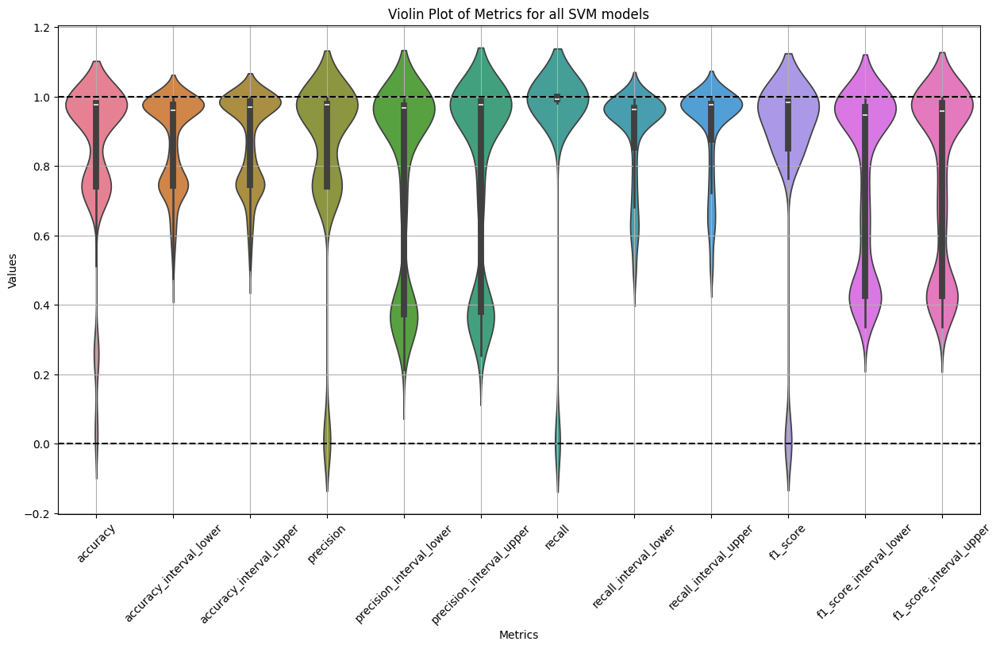

In [22]:
# Adding horizontal lines at 0.0 and 1.0
plt.figure(figsize=(15, 8))
plt.axhline(y=0.0, color='black', linestyle='--')
plt.axhline(y=1.0, color='black', linestyle='--')

# Plotting the violin plot for all SVM models
sns.violinplot(data=all_svm_df[all_svm_df.columns[2:]])
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Violin Plot of Metrics for all SVM models')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

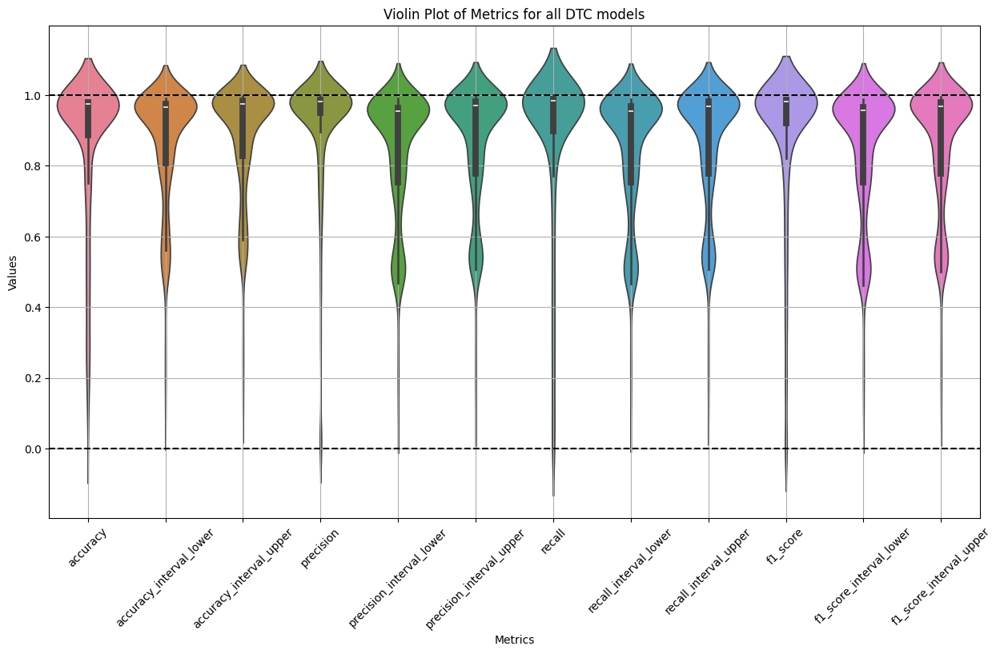

In [23]:
# Adding horizontal lines at 0.0 and 1.0
plt.figure(figsize=(15, 8))
plt.axhline(y=0.0, color='black', linestyle='--')
plt.axhline(y=1.0, color='black', linestyle='--')

# Plotting the violin plot for all DTC models
sns.violinplot(data=all_dtc_df[all_dtc_df.columns[2:]])
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Violin Plot of Metrics for all DTC models')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

## Accuracy for each Sub-DataFrame

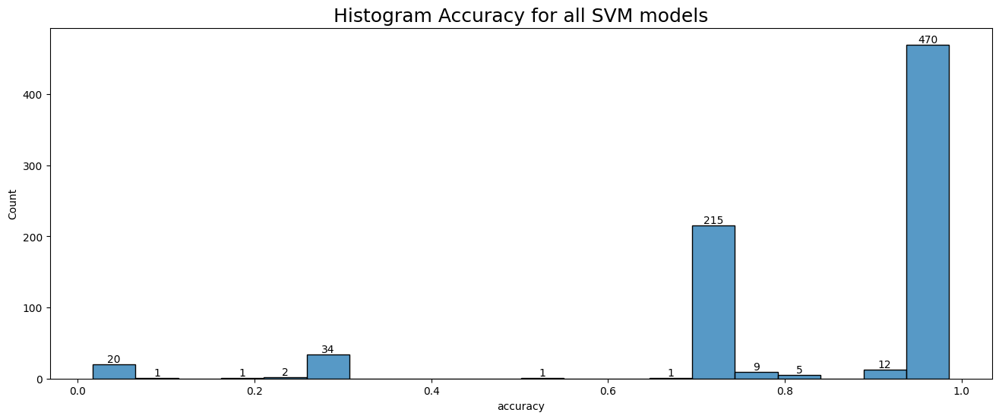

In [24]:
# Histogram Accuracy all SVM models
plt.figure(figsize=(16, 6))
plt.title("Histogram Accuracy for all SVM models", size=18)
ax = sns.histplot(x=all_svm_df['accuracy'], data=all_svm_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

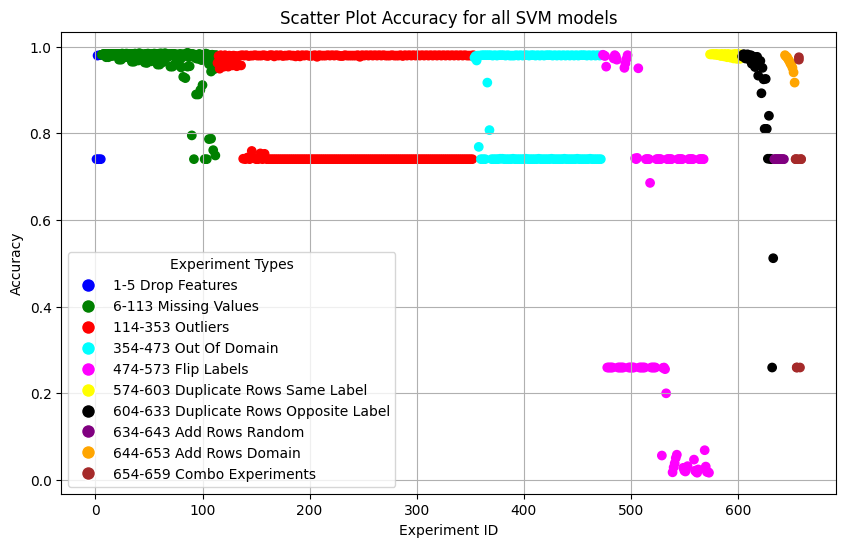

In [25]:
# Scatter plot accuracy for all SVM 
plt.figure(figsize=(10, 6))
plt.scatter(all_svm_df['experiment_id'], all_svm_df['accuracy'], c=colors_svm)

plt.xlabel('Experiment ID')
plt.ylabel('Accuracy')
plt.title('Scatter Plot Accuracy for all SVM models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [26]:
# Find out which experiments lead to the minimum
all_svm_df[all_svm_df['accuracy'] == all_svm_df['accuracy'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
453,562,SVM,0.016997,0.698946,0.723524,0.018727,0.693511,0.725689,0.006378,0.650597,0.677539,0.009515,0.653037,0.682601
464,573,SVM,0.016997,0.781131,0.796580,0.018727,0.774178,0.799164,0.006378,0.727122,0.744212,0.009515,0.740122,0.758160


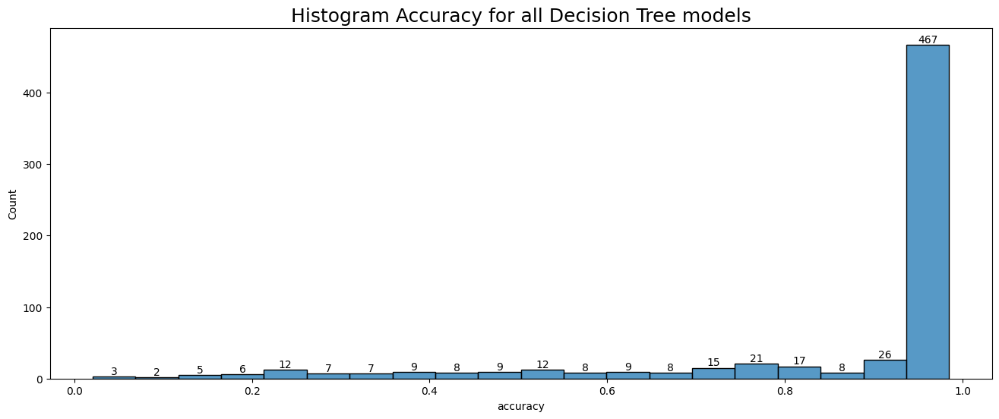

In [27]:
# Histogram Accuracy all DTC models
plt.figure(figsize=(16, 6))
plt.title("Histogram Accuracy for all Decision Tree models", size=18)
ax = sns.histplot(x=all_dtc_df['accuracy'], data=all_dtc_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

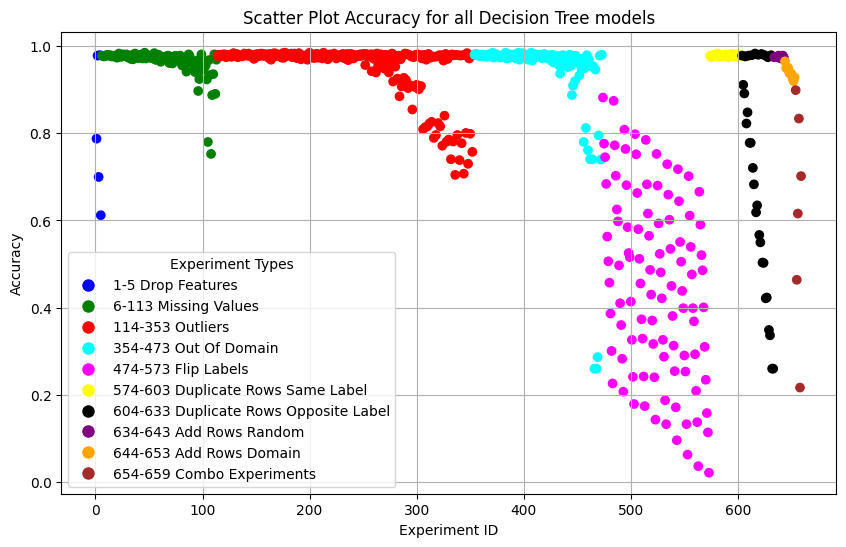

In [28]:
# Scatter plot accuracy for all DTC
plt.figure(figsize=(10, 6))
plt.scatter(all_dtc_df['experiment_id'], all_dtc_df['accuracy'], c=colors_dtc)

plt.xlabel('Experiment ID')
plt.ylabel('Accuracy')
plt.title('Scatter Plot Accuracy for all Decision Tree models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [29]:
# Find out which experiments lead to the minimum
all_dtc_df[all_dtc_df['accuracy'] == all_dtc_df['accuracy'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1253,573,Decision Tree,0.020774,0.658014,0.680226,0.026217,0.625651,0.649945,0.008929,0.624733,0.651101,0.013321,0.624713,0.650058


## Precision for each Sub-DataFrame

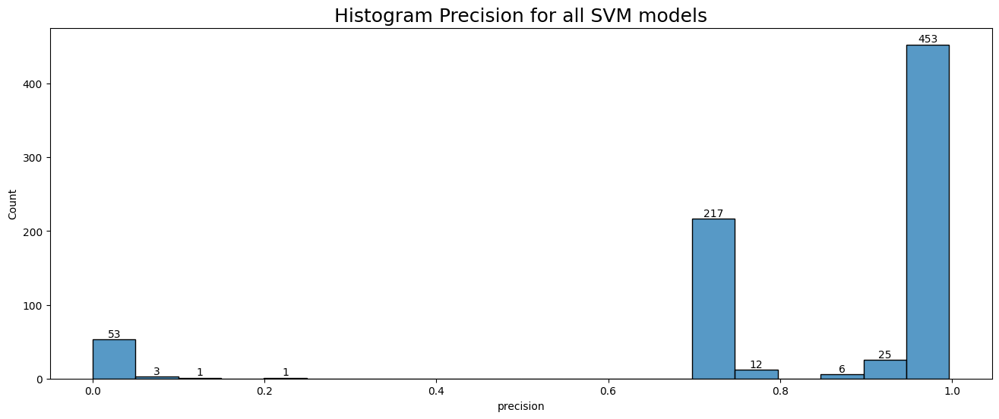

In [30]:
# Histogram Precision all SVM models
plt.figure(figsize=(16, 6))
plt.title("Histogram Precision for all SVM models", size=18)
ax = sns.histplot(x=all_svm_df['precision'], data=all_svm_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

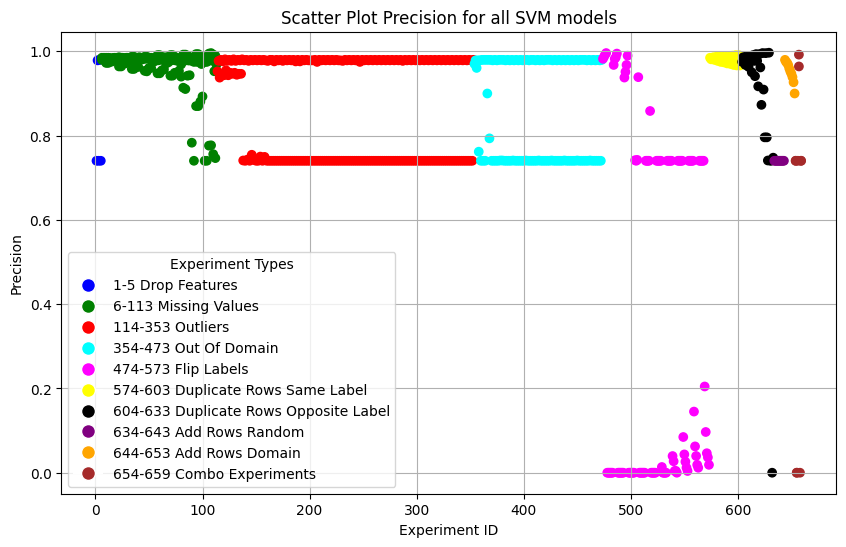

In [31]:
# Scatter plot precision for all SVM
plt.figure(figsize=(10, 6))
plt.scatter(all_svm_df['experiment_id'], all_svm_df['precision'], c=colors_svm)

plt.xlabel('Experiment ID')
plt.ylabel('Precision')
plt.title('Scatter Plot Precision for all SVM models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [32]:
# Find out which experiments lead to the minimum
all_svm_df[all_svm_df['precision'] == all_svm_df['precision'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
369,478,SVM,0.259679,0.661625,0.678892,0.0,0.711151,0.733545,0.0,0.676309,0.693584,0.0,0.651061,0.668960
370,479,SVM,0.259679,0.589785,0.595105,0.0,0.413913,0.663788,0.0,0.499321,0.504845,0.0,0.374610,0.397514
371,480,SVM,0.259679,0.652274,0.653108,0.0,0.326137,0.326554,0.0,NaN,NaN,0.0,0.394774,0.395079
372,481,SVM,0.259679,0.711830,0.712911,0.0,0.355915,0.356456,0.0,NaN,NaN,0.0,0.415830,0.416199
373,482,SVM,0.259679,0.771489,0.772610,0.0,0.385745,0.386305,0.0,NaN,NaN,0.0,0.435503,0.435860
374,483,SVM,0.259679,0.831325,0.832131,0.0,0.415663,0.416066,0.0,NaN,NaN,0.0,0.453947,0.454188
379,488,SVM,0.259679,0.633851,0.660578,0.0,0.671693,0.705242,0.0,0.639727,0.666281,0.0,0.617616,0.646210
380,489,SVM,0.259679,0.571790,0.573064,0.0,0.286005,0.286530,0.0,0.499462,0.500208,0.0,0.363782,0.364298
381,490,SVM,0.259679,0.631774,0.632816,0.0,0.315887,0.316408,0.0,NaN,NaN,0.0,0.387170,0.387561
382,491,SVM,0.259679,0.691564,0.692383,0.0,0.345782,0.346192,0.0,NaN,NaN,0.0,0.408831,0.409117


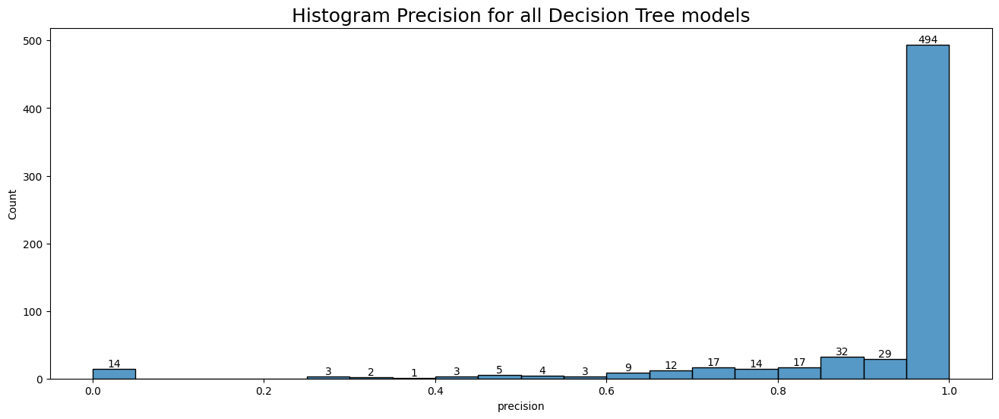

In [33]:
# Histogram Precision all DTC models
plt.figure(figsize=(16, 6))
plt.title("Histogram Precision for all Decision Tree models", size=18)
ax = sns.histplot(x=all_dtc_df['precision'], data=all_dtc_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

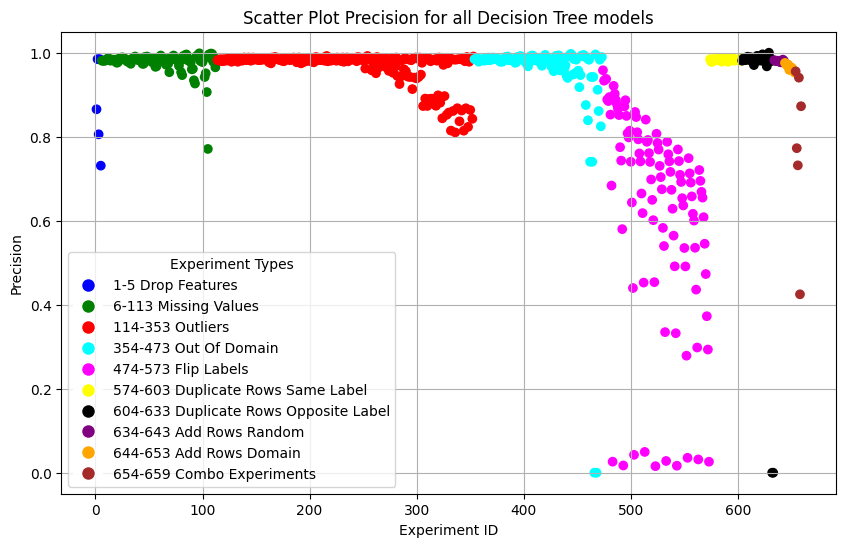

In [34]:
# Scatter plot precision for all DTC
plt.figure(figsize=(10, 6))
plt.scatter(all_dtc_df['experiment_id'], all_dtc_df['precision'], c=colors_dtc)

plt.xlabel('Experiment ID')
plt.ylabel('Precision')
plt.title('Scatter Plot Precision for all Decision Tree models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [35]:
# Find out which experiments lead to the minimum
all_dtc_df[all_dtc_df['precision'] == all_dtc_df['precision'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1039,466,Decision Tree,0.259679,0.985758,0.992340,0.0,0.979141,0.990633,0.0,0.982513,0.990641,0.0,0.981413,0.989903
1043,468,Decision Tree,0.259679,0.985492,0.991850,0.0,0.978722,0.989577,0.0,0.982256,0.990391,0.0,0.981064,0.989268
1371,632,Decision Tree,0.259679,0.206381,0.229200,0.0,0.183235,0.202185,0.0,0.197613,0.219479,0.0,0.189473,0.209204
1373,633,Decision Tree,0.259679,0.088087,0.105386,0.0,0.086288,0.103404,0.0,0.089667,0.107212,0.0,0.087454,0.104587


## Recall for each Sub-DataFrame

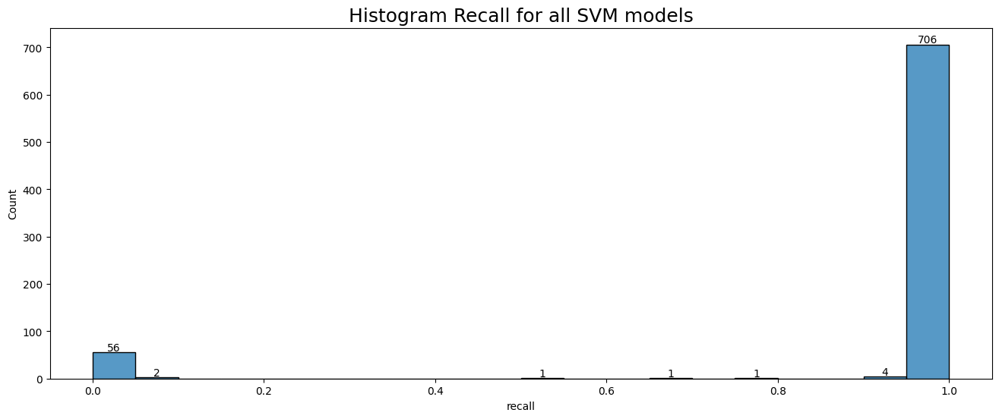

In [36]:
# Histogram recall all SVM models
plt.figure(figsize=(16, 6))
plt.title("Histogram Recall for all SVM models", size=18)
ax = sns.histplot(x=all_svm_df['recall'], data=all_svm_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

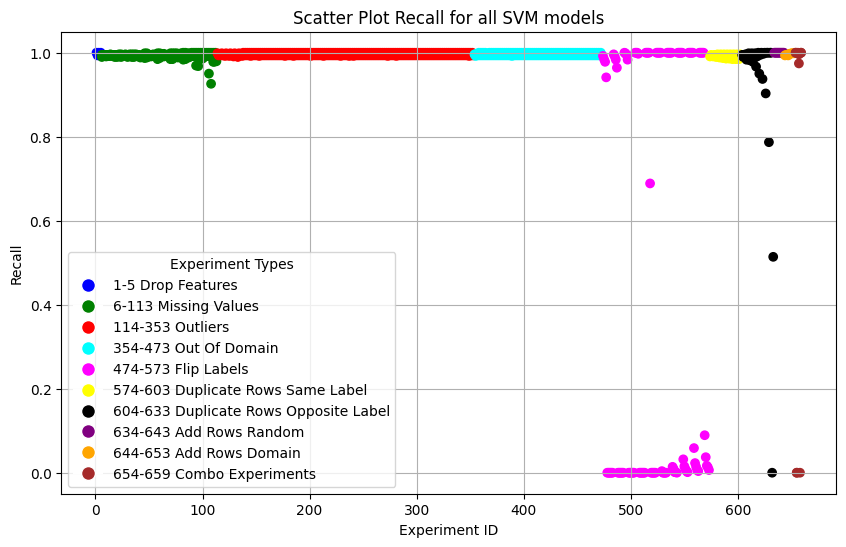

In [37]:
# Scatter plot recall for all SVM
plt.figure(figsize=(10, 6))
plt.scatter(all_svm_df['experiment_id'], all_svm_df['recall'], c=colors_svm)

plt.xlabel('Experiment ID')
plt.ylabel('Recall')
plt.title('Scatter Plot Recall for all SVM models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [38]:
# Find out which experiments lead to the minimum
all_svm_df[all_svm_df['recall'] == all_svm_df['recall'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
369,478,SVM,0.259679,0.661625,0.678892,0.0,0.711151,0.733545,0.0,0.676309,0.693584,0.0,0.651061,0.668960
370,479,SVM,0.259679,0.589785,0.595105,0.0,0.413913,0.663788,0.0,0.499321,0.504845,0.0,0.374610,0.397514
371,480,SVM,0.259679,0.652274,0.653108,0.0,0.326137,0.326554,0.0,NaN,NaN,0.0,0.394774,0.395079
372,481,SVM,0.259679,0.711830,0.712911,0.0,0.355915,0.356456,0.0,NaN,NaN,0.0,0.415830,0.416199
373,482,SVM,0.259679,0.771489,0.772610,0.0,0.385745,0.386305,0.0,NaN,NaN,0.0,0.435503,0.435860
374,483,SVM,0.259679,0.831325,0.832131,0.0,0.415663,0.416066,0.0,NaN,NaN,0.0,0.453947,0.454188
379,488,SVM,0.259679,0.633851,0.660578,0.0,0.671693,0.705242,0.0,0.639727,0.666281,0.0,0.617616,0.646210
380,489,SVM,0.259679,0.571790,0.573064,0.0,0.286005,0.286530,0.0,0.499462,0.500208,0.0,0.363782,0.364298
381,490,SVM,0.259679,0.631774,0.632816,0.0,0.315887,0.316408,0.0,NaN,NaN,0.0,0.387170,0.387561
382,491,SVM,0.259679,0.691564,0.692383,0.0,0.345782,0.346192,0.0,NaN,NaN,0.0,0.408831,0.409117


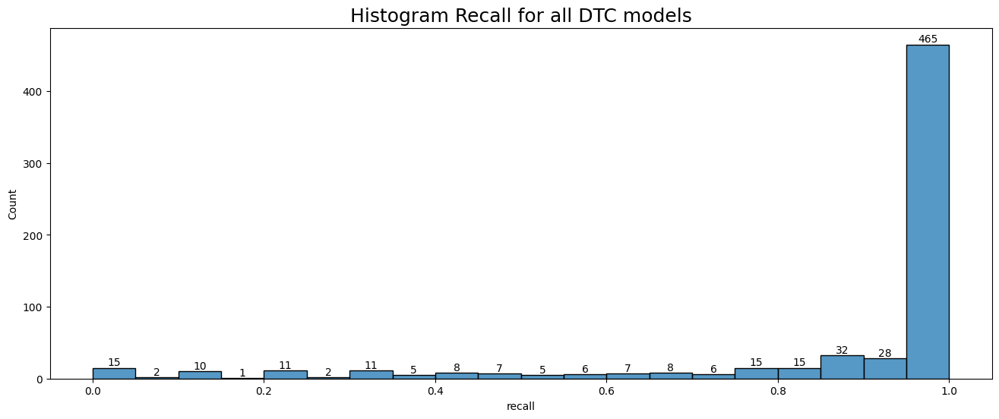

In [39]:
# Histogram recall all DTC models
plt.figure(figsize=(16, 6))
plt.title("Histogram Recall for all DTC models", size=18)
ax = sns.histplot(x=all_dtc_df['recall'], data=all_dtc_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

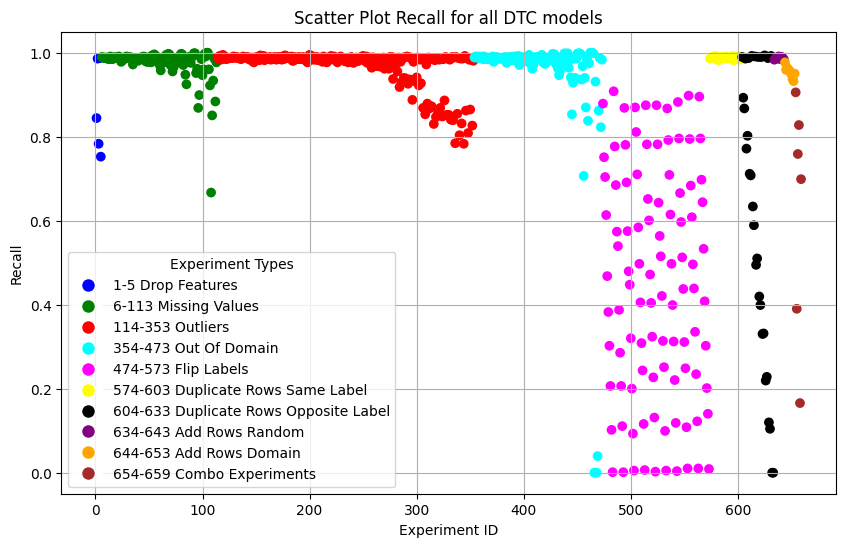

In [40]:
# Scatter plot recall for all DTC
plt.figure(figsize=(10, 6))
plt.scatter(all_dtc_df['experiment_id'], all_dtc_df['recall'], c=colors_dtc)

plt.xlabel('Experiment ID')
plt.ylabel('Recall')
plt.title('Scatter Plot Recall for all DTC models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [41]:
# Find out which experiments lead to the minimum
all_dtc_df[all_dtc_df['recall'] == all_dtc_df['recall'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1039,466,Decision Tree,0.259679,0.985758,0.992340,0.0,0.979141,0.990633,0.0,0.982513,0.990641,0.0,0.981413,0.989903
1043,468,Decision Tree,0.259679,0.985492,0.991850,0.0,0.978722,0.989577,0.0,0.982256,0.990391,0.0,0.981064,0.989268
1371,632,Decision Tree,0.259679,0.206381,0.229200,0.0,0.183235,0.202185,0.0,0.197613,0.219479,0.0,0.189473,0.209204
1373,633,Decision Tree,0.259679,0.088087,0.105386,0.0,0.086288,0.103404,0.0,0.089667,0.107212,0.0,0.087454,0.104587


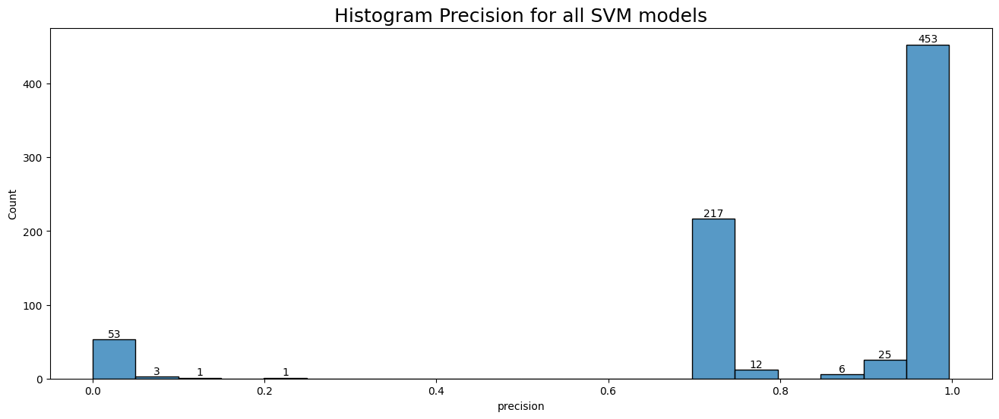

In [42]:
# Histogram Precision all SVM models
plt.figure(figsize=(16, 6))
plt.title("Histogram Precision for all SVM models", size=18)
ax = sns.histplot(x=all_svm_df['precision'], data=all_svm_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

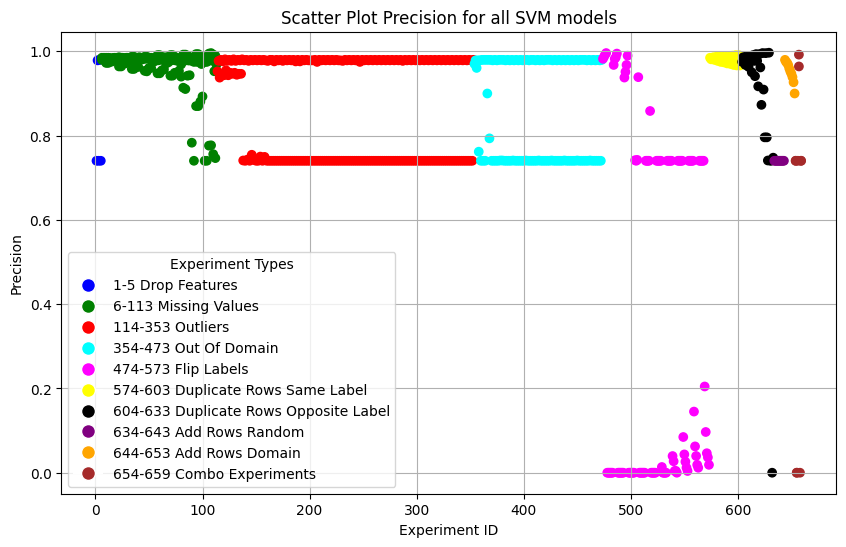

In [43]:
# Scatter plot precision for all SVM
plt.figure(figsize=(10, 6))
plt.scatter(all_svm_df['experiment_id'], all_svm_df['precision'], c=colors_svm)

plt.xlabel('Experiment ID')
plt.ylabel('Precision')
plt.title('Scatter Plot Precision for all SVM models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [44]:
# Find out which experiments lead to the minimum
all_svm_df[all_svm_df['precision'] == all_svm_df['precision'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
369,478,SVM,0.259679,0.661625,0.678892,0.0,0.711151,0.733545,0.0,0.676309,0.693584,0.0,0.651061,0.668960
370,479,SVM,0.259679,0.589785,0.595105,0.0,0.413913,0.663788,0.0,0.499321,0.504845,0.0,0.374610,0.397514
371,480,SVM,0.259679,0.652274,0.653108,0.0,0.326137,0.326554,0.0,NaN,NaN,0.0,0.394774,0.395079
372,481,SVM,0.259679,0.711830,0.712911,0.0,0.355915,0.356456,0.0,NaN,NaN,0.0,0.415830,0.416199
373,482,SVM,0.259679,0.771489,0.772610,0.0,0.385745,0.386305,0.0,NaN,NaN,0.0,0.435503,0.435860
374,483,SVM,0.259679,0.831325,0.832131,0.0,0.415663,0.416066,0.0,NaN,NaN,0.0,0.453947,0.454188
379,488,SVM,0.259679,0.633851,0.660578,0.0,0.671693,0.705242,0.0,0.639727,0.666281,0.0,0.617616,0.646210
380,489,SVM,0.259679,0.571790,0.573064,0.0,0.286005,0.286530,0.0,0.499462,0.500208,0.0,0.363782,0.364298
381,490,SVM,0.259679,0.631774,0.632816,0.0,0.315887,0.316408,0.0,NaN,NaN,0.0,0.387170,0.387561
382,491,SVM,0.259679,0.691564,0.692383,0.0,0.345782,0.346192,0.0,NaN,NaN,0.0,0.408831,0.409117


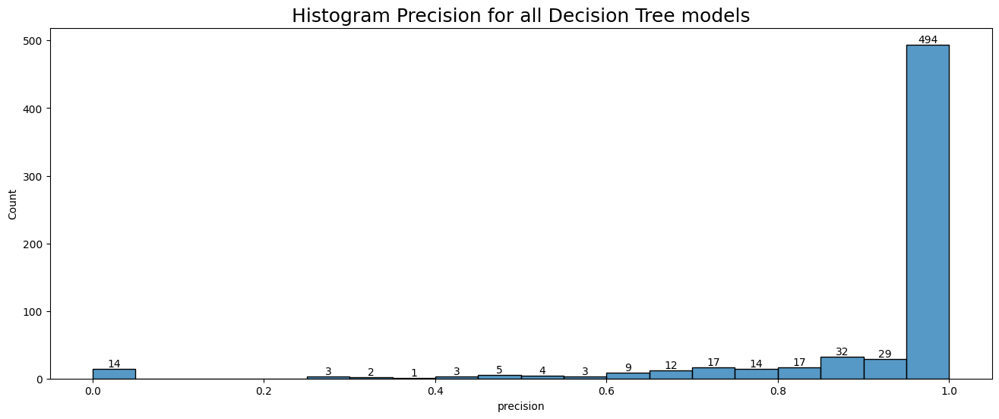

In [45]:
# Histogram Precision all DTC models
plt.figure(figsize=(16, 6))
plt.title("Histogram Precision for all Decision Tree models", size=18)
ax = sns.histplot(x=all_dtc_df['precision'], data=all_dtc_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

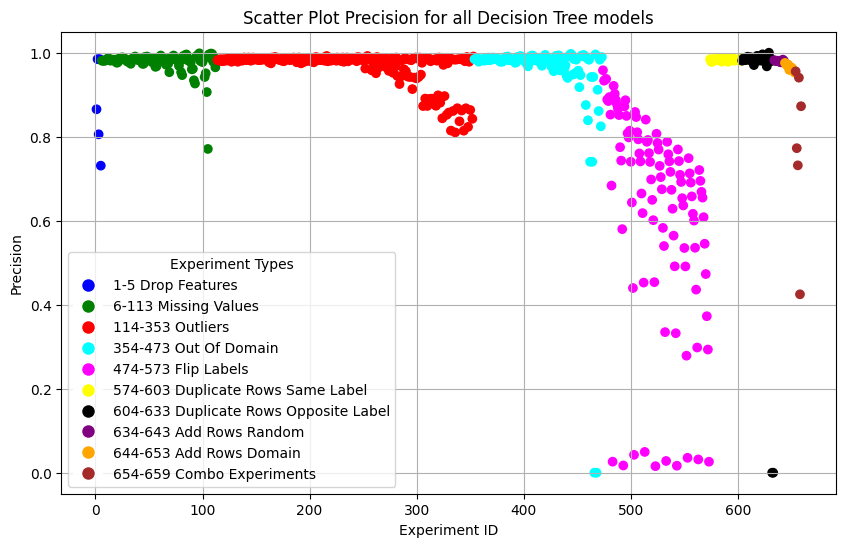

In [46]:
# Scatter plot precision for all DTC
plt.figure(figsize=(10, 6))
plt.scatter(all_dtc_df['experiment_id'], all_dtc_df['precision'], c=colors_dtc)

plt.xlabel('Experiment ID')
plt.ylabel('Precision')
plt.title('Scatter Plot Precision for all Decision Tree models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [47]:
# Find out which experiments lead to the minimum
all_dtc_df[all_dtc_df['precision'] == all_dtc_df['precision'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1039,466,Decision Tree,0.259679,0.985758,0.992340,0.0,0.979141,0.990633,0.0,0.982513,0.990641,0.0,0.981413,0.989903
1043,468,Decision Tree,0.259679,0.985492,0.991850,0.0,0.978722,0.989577,0.0,0.982256,0.990391,0.0,0.981064,0.989268
1371,632,Decision Tree,0.259679,0.206381,0.229200,0.0,0.183235,0.202185,0.0,0.197613,0.219479,0.0,0.189473,0.209204
1373,633,Decision Tree,0.259679,0.088087,0.105386,0.0,0.086288,0.103404,0.0,0.089667,0.107212,0.0,0.087454,0.104587


## F1 score for each Sub-DataFrame

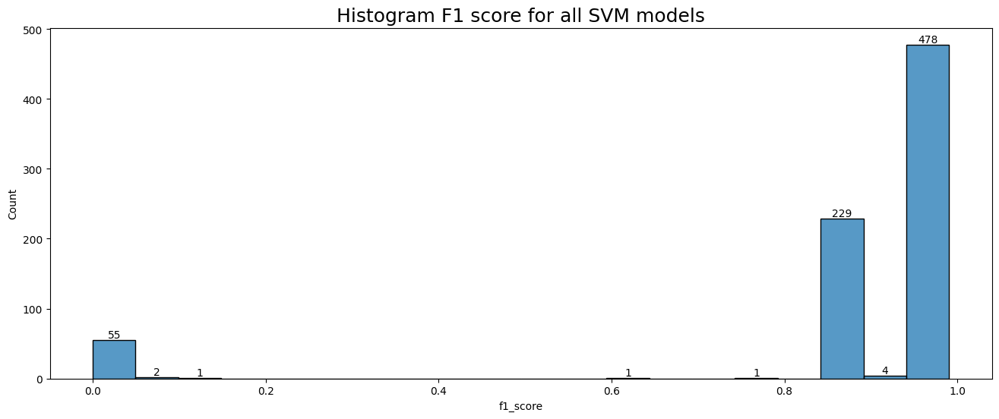

In [48]:
# Histogram F1 score all SVM models
plt.figure(figsize=(16, 6))
plt.title("Histogram F1 score for all SVM models", size=18)
ax = sns.histplot(x=all_svm_df['f1_score'], data=all_svm_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

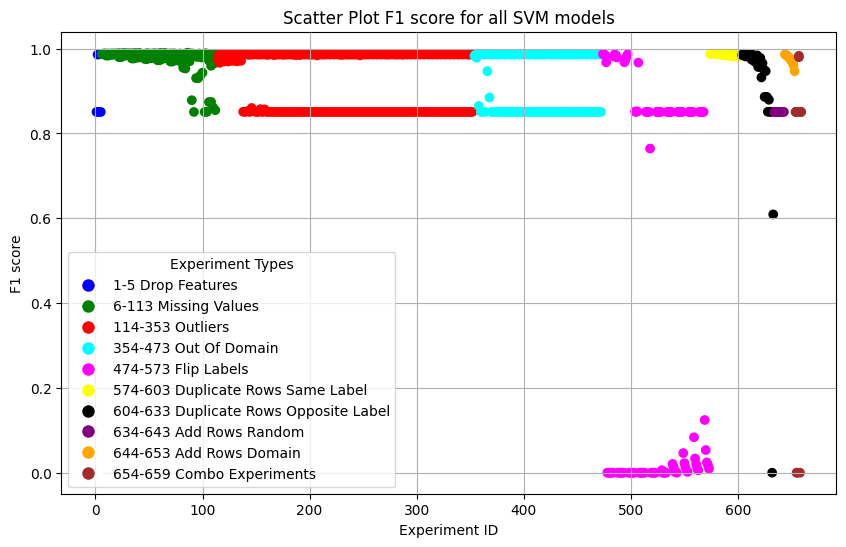

In [49]:
# Scatter plot F1 score for all SVM
plt.figure(figsize=(10, 6))
plt.scatter(all_svm_df['experiment_id'], all_svm_df['f1_score'], c=colors_svm)

plt.xlabel('Experiment ID')
plt.ylabel('F1 score')
plt.title('Scatter Plot F1 score for all SVM models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [50]:
# Find out which experiments lead to the minimum
all_svm_df[all_svm_df['f1_score'] == all_svm_df['f1_score'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
369,478,SVM,0.259679,0.661625,0.678892,0.0,0.711151,0.733545,0.0,0.676309,0.693584,0.0,0.651061,0.668960
370,479,SVM,0.259679,0.589785,0.595105,0.0,0.413913,0.663788,0.0,0.499321,0.504845,0.0,0.374610,0.397514
371,480,SVM,0.259679,0.652274,0.653108,0.0,0.326137,0.326554,0.0,NaN,NaN,0.0,0.394774,0.395079
372,481,SVM,0.259679,0.711830,0.712911,0.0,0.355915,0.356456,0.0,NaN,NaN,0.0,0.415830,0.416199
373,482,SVM,0.259679,0.771489,0.772610,0.0,0.385745,0.386305,0.0,NaN,NaN,0.0,0.435503,0.435860
374,483,SVM,0.259679,0.831325,0.832131,0.0,0.415663,0.416066,0.0,NaN,NaN,0.0,0.453947,0.454188
379,488,SVM,0.259679,0.633851,0.660578,0.0,0.671693,0.705242,0.0,0.639727,0.666281,0.0,0.617616,0.646210
380,489,SVM,0.259679,0.571790,0.573064,0.0,0.286005,0.286530,0.0,0.499462,0.500208,0.0,0.363782,0.364298
381,490,SVM,0.259679,0.631774,0.632816,0.0,0.315887,0.316408,0.0,NaN,NaN,0.0,0.387170,0.387561
382,491,SVM,0.259679,0.691564,0.692383,0.0,0.345782,0.346192,0.0,NaN,NaN,0.0,0.408831,0.409117


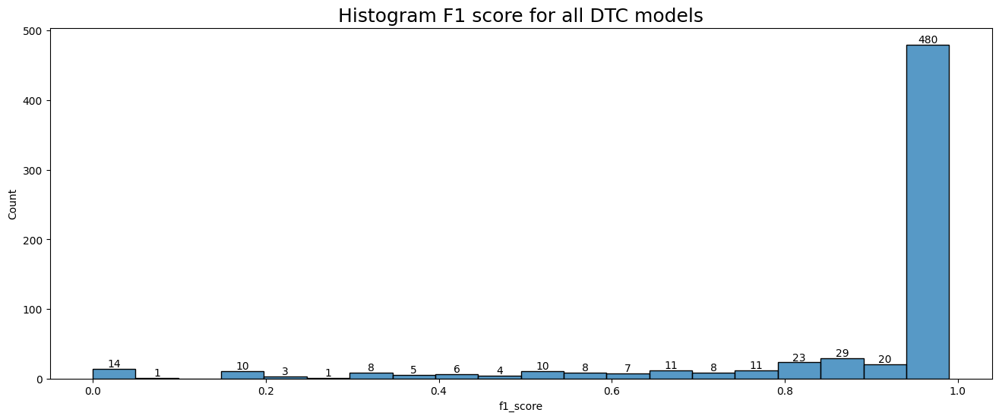

In [51]:
# Histogram F1 score all DTC models
plt.figure(figsize=(16, 6))
plt.title("Histogram F1 score for all DTC models", size=18)
ax = sns.histplot(x=all_dtc_df['f1_score'], data=all_dtc_df, bins=20)

for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.text(p.get_x() + p.get_width()/2., height + 3, height, ha="center")

plt.show()

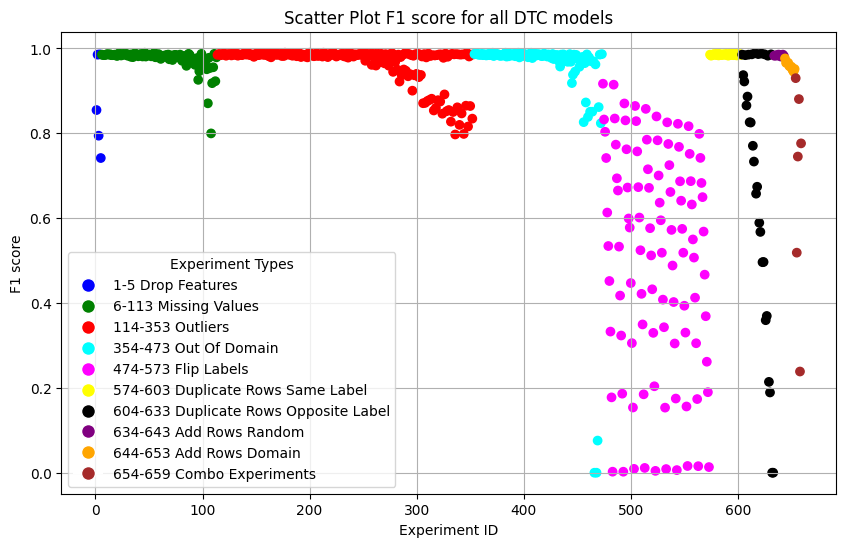

In [52]:
# Scatter plot F1 score for all DTC
plt.figure(figsize=(10, 6))
plt.scatter(all_dtc_df['experiment_id'], all_dtc_df['f1_score'], c=colors_dtc)

plt.xlabel('Experiment ID')
plt.ylabel('F1 score')
plt.title('Scatter Plot F1 score for all DTC models')
plt.grid(True)
plt.legend(handles=handles, title='Experiment Types')
plt.show()

In [53]:
# Find out which experiments lead to the minimum
all_dtc_df[all_dtc_df['f1_score'] == all_dtc_df['f1_score'].min()]

,experiment_id,model_name,accuracy,accuracy_interval_lower,accuracy_interval_upper,precision,precision_interval_lower,precision_interval_upper,recall,recall_interval_lower,recall_interval_upper,f1_score,f1_score_interval_lower,f1_score_interval_upper
1039,466,Decision Tree,0.259679,0.985758,0.992340,0.0,0.979141,0.990633,0.0,0.982513,0.990641,0.0,0.981413,0.989903
1043,468,Decision Tree,0.259679,0.985492,0.991850,0.0,0.978722,0.989577,0.0,0.982256,0.990391,0.0,0.981064,0.989268
1371,632,Decision Tree,0.259679,0.206381,0.229200,0.0,0.183235,0.202185,0.0,0.197613,0.219479,0.0,0.189473,0.209204
1373,633,Decision Tree,0.259679,0.088087,0.105386,0.0,0.086288,0.103404,0.0,0.089667,0.107212,0.0,0.087454,0.104587


## Plots for each kind of Experiment

### Experiment Parameters from JSON

In [54]:
# Generic function for getting experiment parameters from json, given the experiment indexes
def get_experiment_parameters(file_path, start_index, end_index):
    try:
        # Read File
        with open(file_path, 'r') as file:
            experiment_data = json.load(file)      
    except FileNotFoundError as e:
        print(f"File not found: {e}")
        return None
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON: {e}")
        return None
    except Exception as e:
        print(f"An error occurred: {e}")
        return None

    results = []
    for index in range(start_index - 1, end_index):
        if index < len(experiment_data):
            experiment = experiment_data[index]
            results.append(experiment)
        else:
            print(f"Index {index + 1} is out of range")
    
    return results

In [55]:
# Define metrics and colors
metrics = {
    'accuracy': 'purple',
    'precision': 'blue',
    'recall': 'green',
    'f1_score': 'red'
}

# Features to consider
features_to_consider_list = [["PC1"], ["PC2"], ["PC1", "PC2"], ["PC3", "PC4", "PC5"]]

# Ranges to consider
range_type_to_consider_list = ["std", "iqr"] 

# Types to consider
wine_types_to_consider_list = [["red"], ["white"], ["red", "white"]]

### Drop Features

In [56]:
# Range for Drop Features Experiments
start_index = 1
end_index = 5
drop_features = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(drop_features, indent=4))

[
    {
        "experiment-name": "experiment #1",
        "features-to-drop": [
            "PC1"
        ]
    },
    {
        "experiment-name": "experiment #2",
        "features-to-drop": [
            "PC2"
        ]
    },
    {
        "experiment-name": "experiment #3",
        "features-to-drop": [
            "PC1",
            "PC2"
        ]
    },
    {
        "experiment-name": "experiment #4",
        "features-to-drop": [
            "PC3",
            "PC4",
            "PC5"
        ]
    },
    {
        "experiment-name": "experiment #5",
        "features-to-drop": [
            "PC1",
            "PC2",
            "PC3",
            "PC4"
        ]
    }
]


In [57]:
def get_results_drop_features():
    # Get the filtered data, needed for the plots
    results = [(int(experiment["experiment-name"][12:]), experiment["features-to-drop"]) 
    for experiment in drop_features]

    # Insert in the first position the "fake" experiment, used for the ML pipeline metrics
    results.insert(0, (0, []))

    return results

In [58]:
# Function to plot
def plot_drop_features_graph(model_name_to_consider):
    # Get the results object
    results = get_results_drop_features()

    # Make the graph
    plt.figure(figsize=(10, 6))

    for metric, color in metrics.items():
        # Initialize lists to collect x and y values
        x_values = []
        y_values = []

        for experiment_id, features_to_drop in results:
            # Select the correct experiment in the df of metrics
            data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

            if data.empty:
                # Experiment 0
                assert experiment_id == 0, "Something went wrong, expected experiment 0"
                
                # Get the data properly
                data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

                if data.empty:
                    if data.empty:
                        print("DEBUG - Nessun dato trovato per:")
                        print("  experiment_id:", experiment_id)
                        print("  model_name_to_consider:", model_name_to_consider)
                        print("Modelli disponibili:", df['model_name'].unique())
                        print("Esperimenti disponibili:", df['experiment_id'].unique())
                        continue  # oppure return

            # Get the metrics
            metric_value = data[metric].values[0]
            # Collect the data points
            x_values.append(f'{features_to_drop}')
            y_values.append(metric_value)
        
        # Plot all collected points and lines for the current metric
        plt.plot(x_values, y_values, marker='o', linestyle='-', color=color, label=f"{metric.upper()} ({model_name_to_consider})")
        
    plt.xlabel('Dropped Feature(s)')
    plt.ylabel('Metrics Values')
    plt.title(f'Drop Features - Performance Metrics {model_name_to_consider}')
    plt.legend(loc='best')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

#### SVM

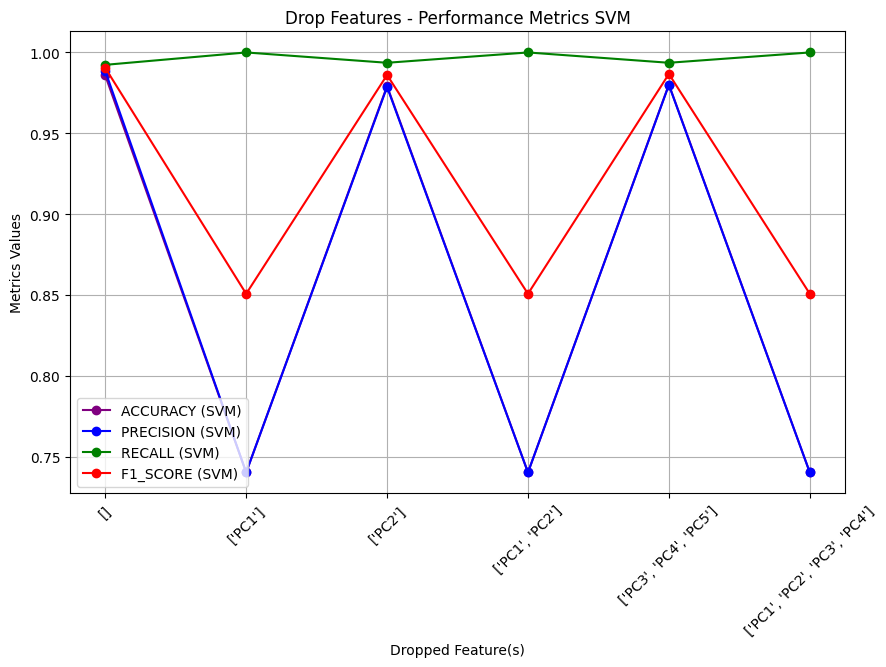

In [59]:
plot_drop_features_graph("SVM")

#### Decision Tree

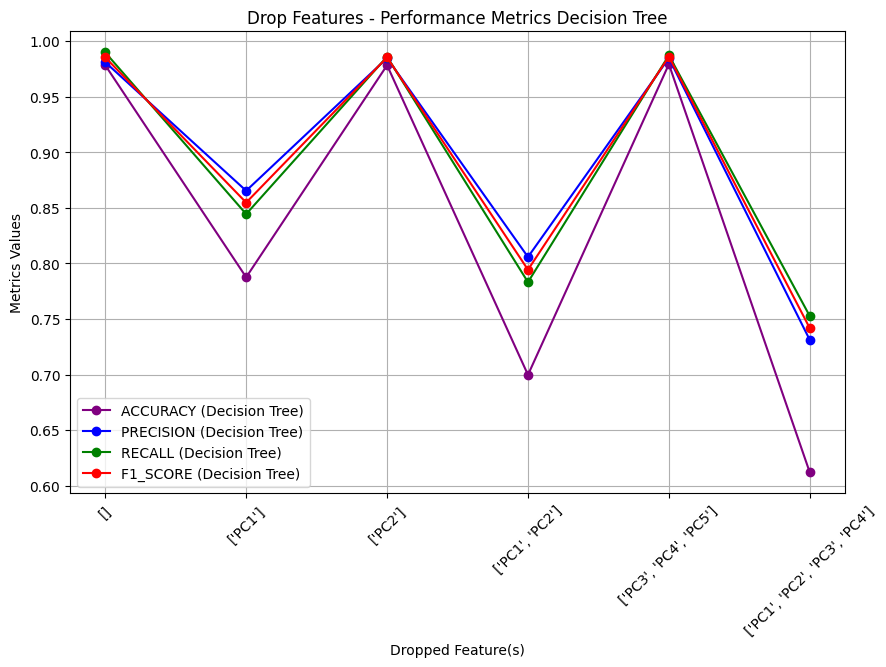

In [60]:
plot_drop_features_graph("Decision Tree")

### Missing Values

In [61]:
# Range for Missing Values Experiments
start_index = 6 
end_index = 113   
missing_values = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(missing_values, indent=4))

[
    {
        "experiment-name": "experiment #6",
        "features-to-dirty-mv": [
            "PC1"
        ],
        "missing-values-percentage": 0.1,
        "wine-types-to-consider-missing-values": [
            "red"
        ]
    },
    {
        "experiment-name": "experiment #7",
        "features-to-dirty-mv": [
            "PC2"
        ],
        "missing-values-percentage": 0.1,
        "wine-types-to-consider-missing-values": [
            "red"
        ]
    },
    {
        "experiment-name": "experiment #8",
        "features-to-dirty-mv": [
            "PC1",
            "PC2"
        ],
        "missing-values-percentage": 0.1,
        "wine-types-to-consider-missing-values": [
            "red"
        ]
    },
    {
        "experiment-name": "experiment #9",
        "features-to-dirty-mv": [
            "PC3",
            "PC4",
            "PC5"
        ],
        "missing-values-percentage": 0.1,
        "wine-types-to-consider-missing-values": [
            

In [62]:
def get_results_mv(features_to_consider, wine_types_to_consider_missing_values):
    print(f"DEBUG: feature={features_to_consider}, wine_types={wine_types_to_consider_missing_values}")
    
    results = []
    for experiment in missing_values:
        try:
            if (experiment["features-to-dirty-mv"] == features_to_consider and
                experiment["wine-types-to-consider-missing-values"] == wine_types_to_consider_missing_values):
                
                exp_id = int(experiment["experiment-name"][12:]) if "experiment-name" in experiment else -1
                results.append((
                    exp_id,
                    experiment.get("missing-values-percentage", 0.0),
                    experiment.get("wine-types-to-consider-missing-values", "unknown")
                ))
        except Exception as e:
            print("Errore durante il parsing di un experiment:", e)
            print("Contenuto:", experiment)

    if len(results) >= 2:
        results.insert(0, (0, 0.0, results[1][2]))
    elif len(results) == 1:
        results.insert(0, (0, 0.0, results[0][2]))
    else:
        print(f"⚠️ Nessun risultato trovato.")

    return results

In [63]:
# Function to plot
def plot_missing_values_graph(model_name_to_consider, features_to_consider, wine_types_to_consider_missing_values):
    # Get the results object
    results = get_results_mv(features_to_consider, wine_types_to_consider_missing_values)

    # Make the graph
    plt.figure(figsize=(10, 6))

    # Flag model_name ends with (mean) or (EM)
    flag = model_name_to_consider.endswith('(mean)') or model_name_to_consider.endswith('(EM)')

    for metric, color in metrics.items():
        # Initialize lists to collect x and y values
        x_values = []
        y_values = []

        for experiment_id, missing_values_percentage, _ in results:
            # Select the correct experiment in the df of metrics
            data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

            if data.empty:
                # Experiment 0 and (mean) or (EM) in model_name
                assert experiment_id == 0 and flag, "Something went wrong, expected experiment 0 and model_name which ends with (mean) or (EM)"
                
                if model_name_to_consider.endswith('(mean)'):
                    # Remove (mean) from the parameter
                    model_name_to_consider_fixed = model_name_to_consider[:-7]
                else:
                    # Remove (EM) from the parameter
                    model_name_to_consider_fixed = model_name_to_consider[:-5]

                # Get the data properly
                data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider_fixed)]

                if data.empty:
                    assert False, "This was unexpected"

            # Get the metrics
            metric_value = data[metric].values[0]
            # Collect the data points
            x_values.append(missing_values_percentage * 100)
            y_values.append(metric_value)
        
        # Plot all collected points and lines for the current metric
        plt.plot(x_values, y_values, marker='o', linestyle='-', color=color, label=f"{metric.upper()} ({model_name_to_consider})")
        
    plt.xlabel('Missing Values (%)')
    plt.ylabel('Metrics Values')
    plt.title(f'Missing Values - Performance Metrics {model_name_to_consider} for Component(s) {features_to_consider} and Target(s) {wine_types_to_consider_missing_values}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.xticks([10 * i for i in range(0, 10)])
    plt.show()

#### SVM

DEBUG: feature=['PC1'], wine_types=['red']


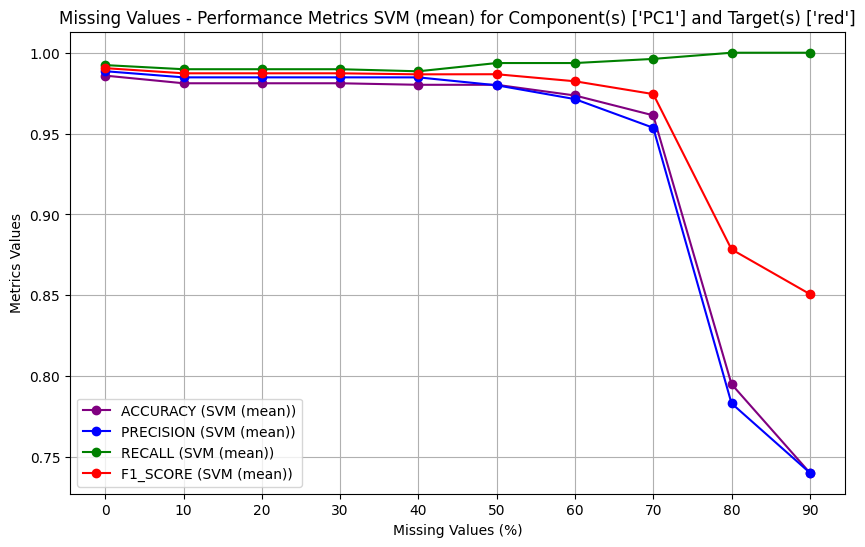

DEBUG: feature=['PC1'], wine_types=['red']


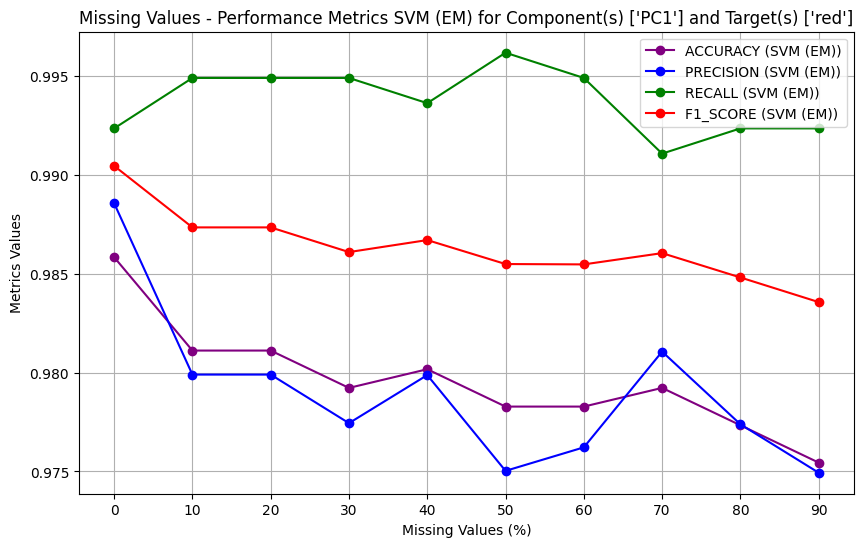

DEBUG: feature=['PC1'], wine_types=['white']


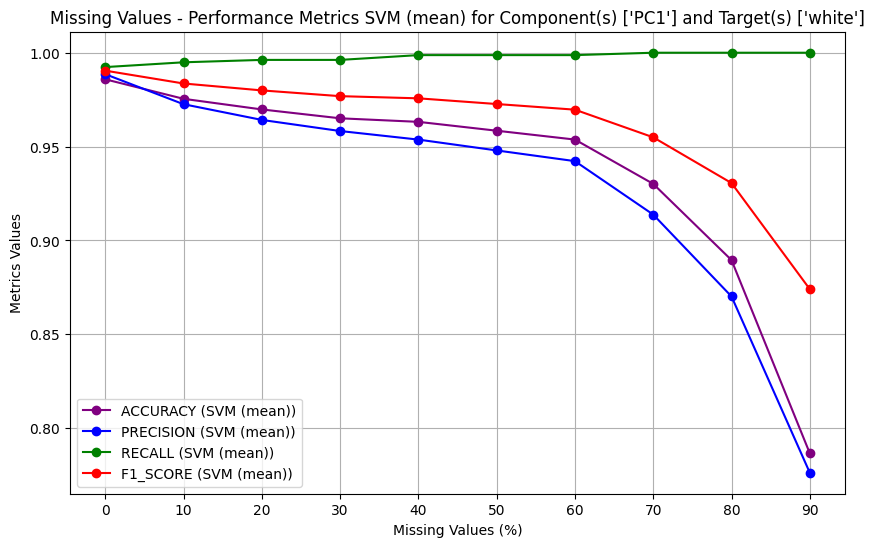

DEBUG: feature=['PC1'], wine_types=['white']


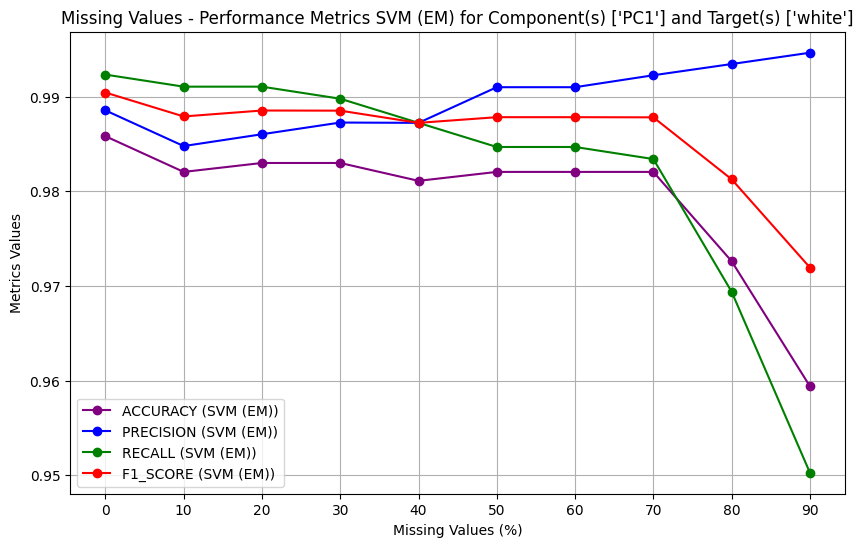

DEBUG: feature=['PC1'], wine_types=['red', 'white']


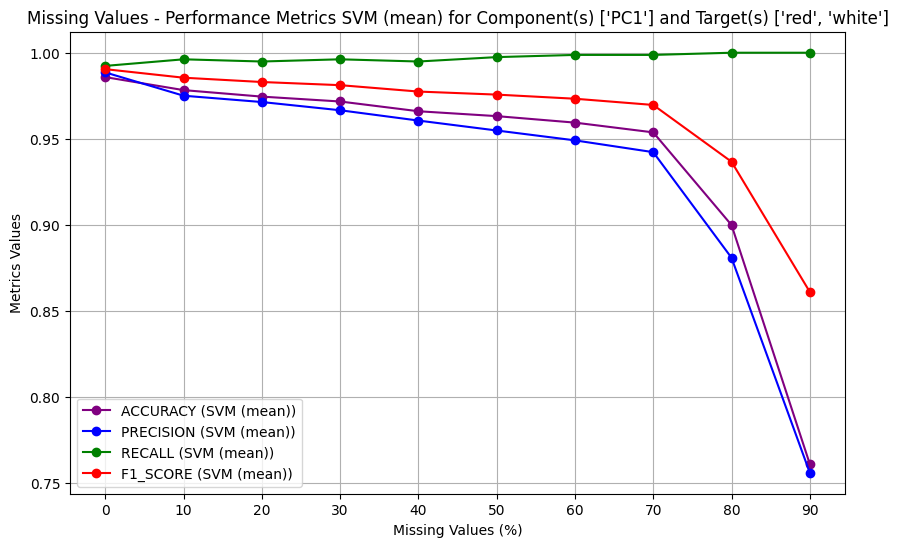

DEBUG: feature=['PC1'], wine_types=['red', 'white']


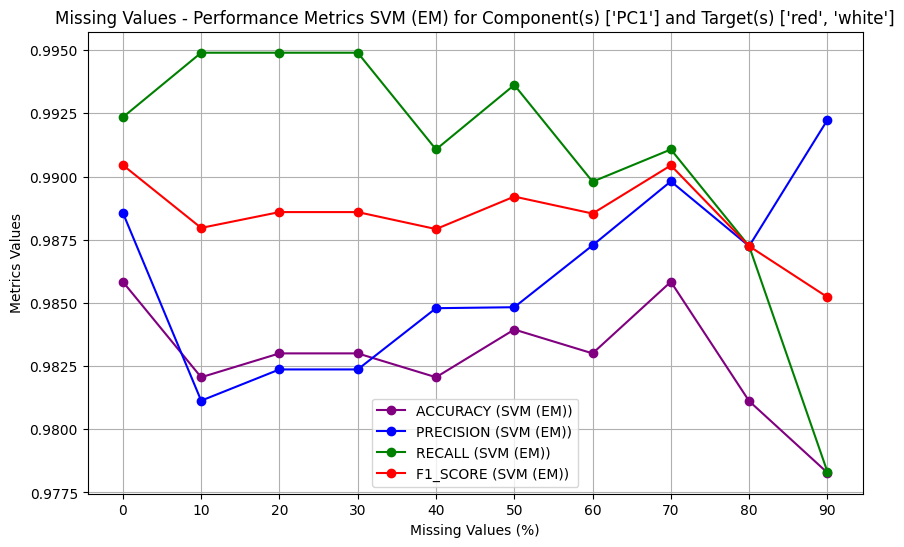

DEBUG: feature=['PC2'], wine_types=['red']


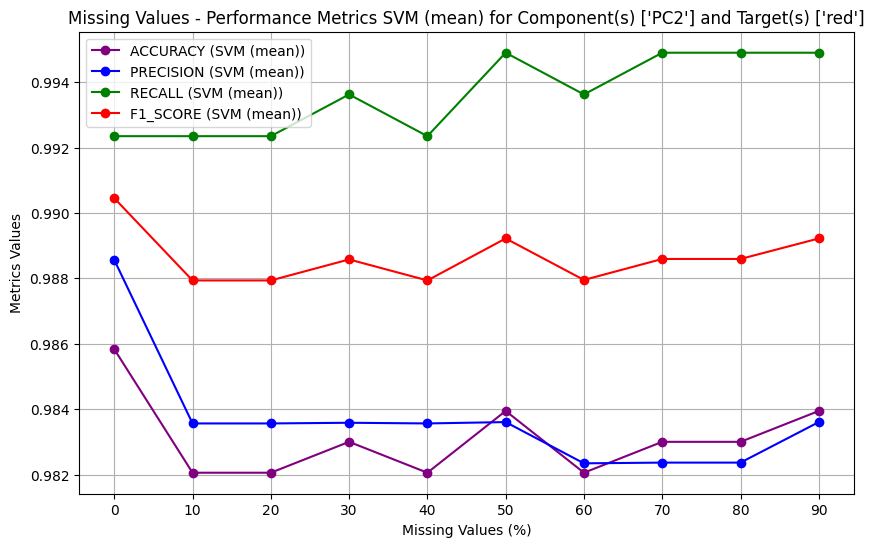

DEBUG: feature=['PC2'], wine_types=['red']


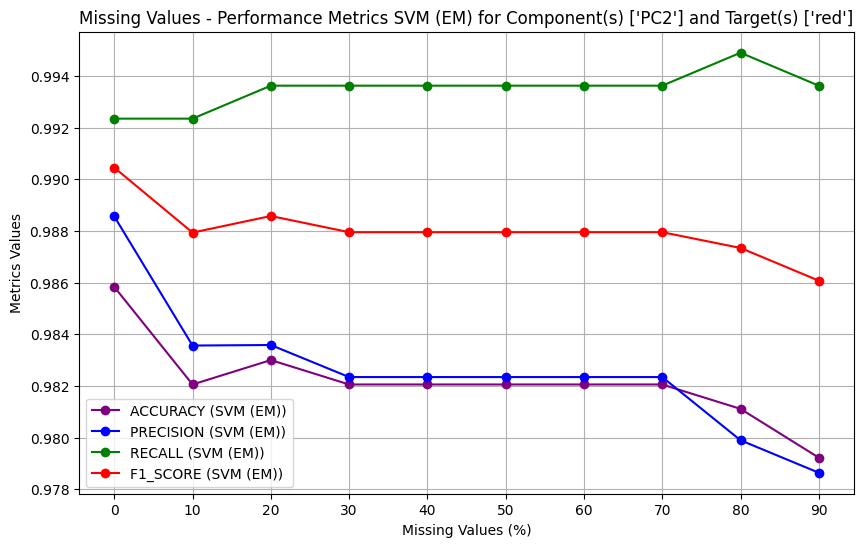

DEBUG: feature=['PC2'], wine_types=['white']


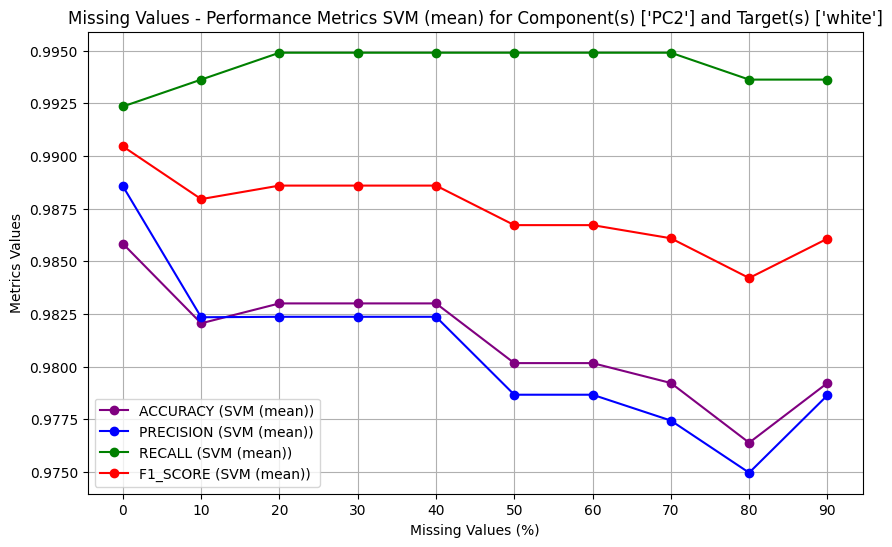

DEBUG: feature=['PC2'], wine_types=['white']


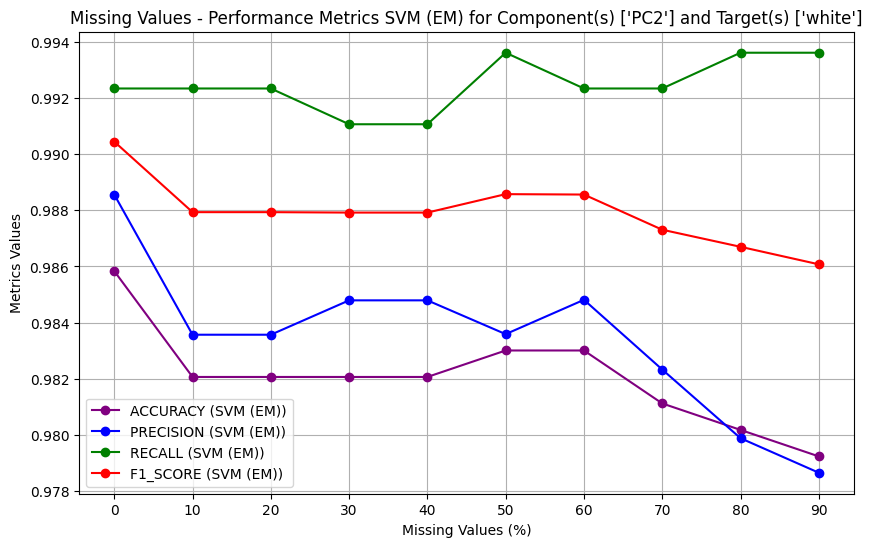

DEBUG: feature=['PC2'], wine_types=['red', 'white']


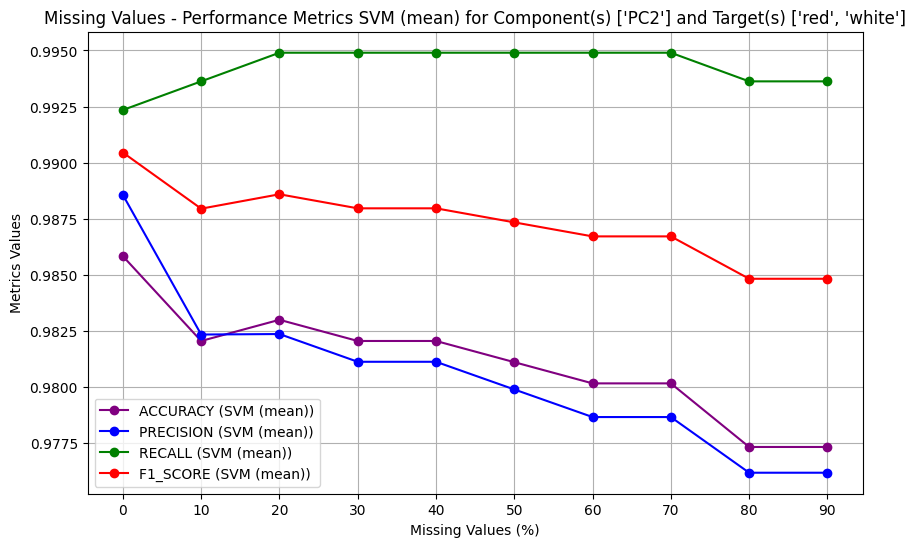

DEBUG: feature=['PC2'], wine_types=['red', 'white']


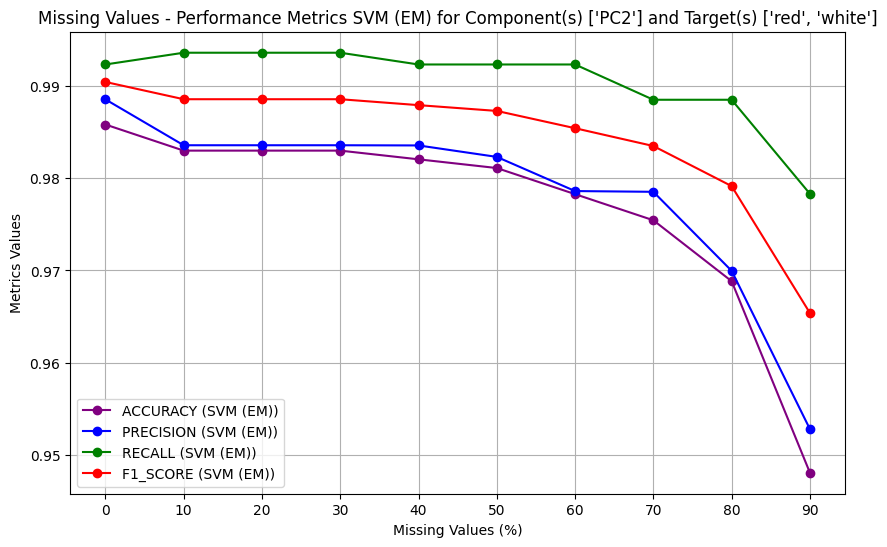

DEBUG: feature=['PC1', 'PC2'], wine_types=['red']


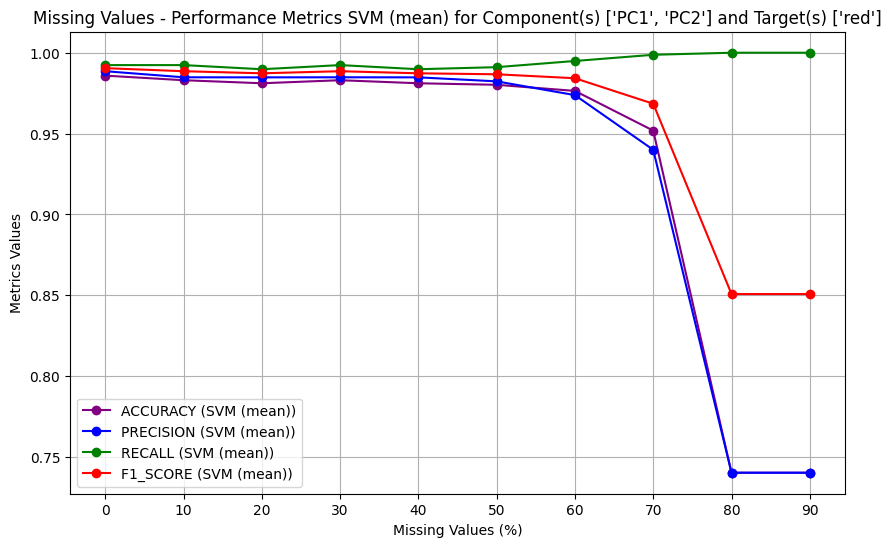

DEBUG: feature=['PC1', 'PC2'], wine_types=['red']


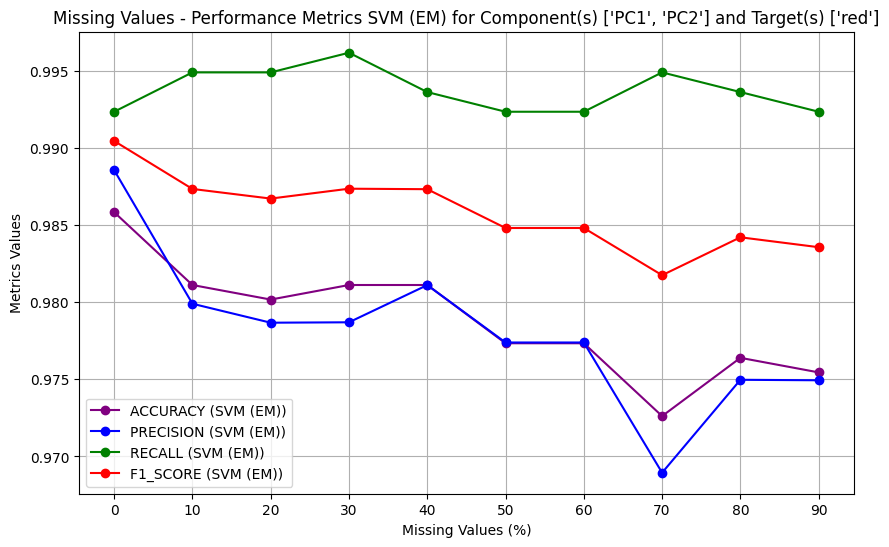

DEBUG: feature=['PC1', 'PC2'], wine_types=['white']


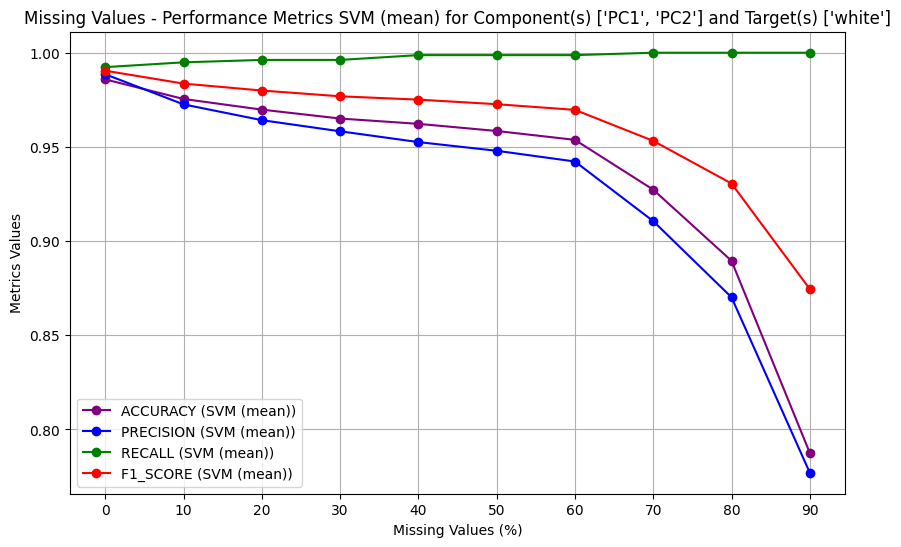

DEBUG: feature=['PC1', 'PC2'], wine_types=['white']


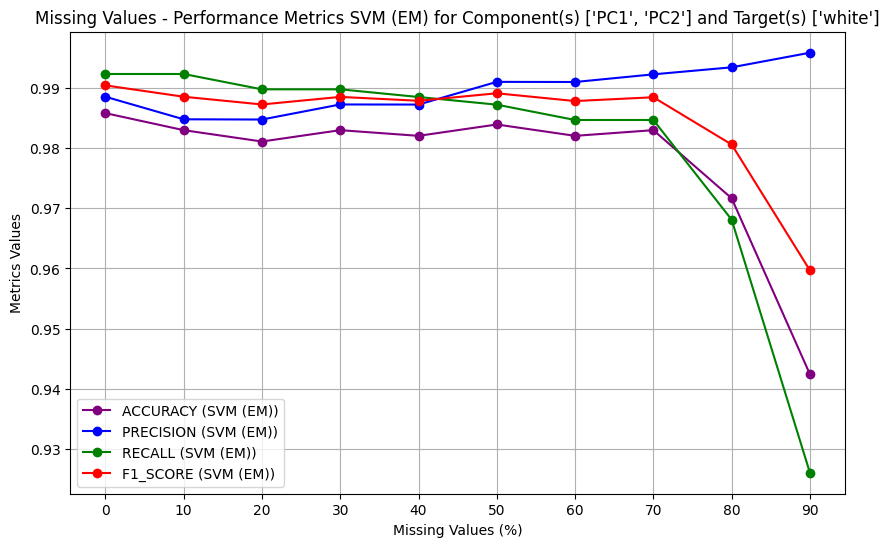

DEBUG: feature=['PC1', 'PC2'], wine_types=['red', 'white']


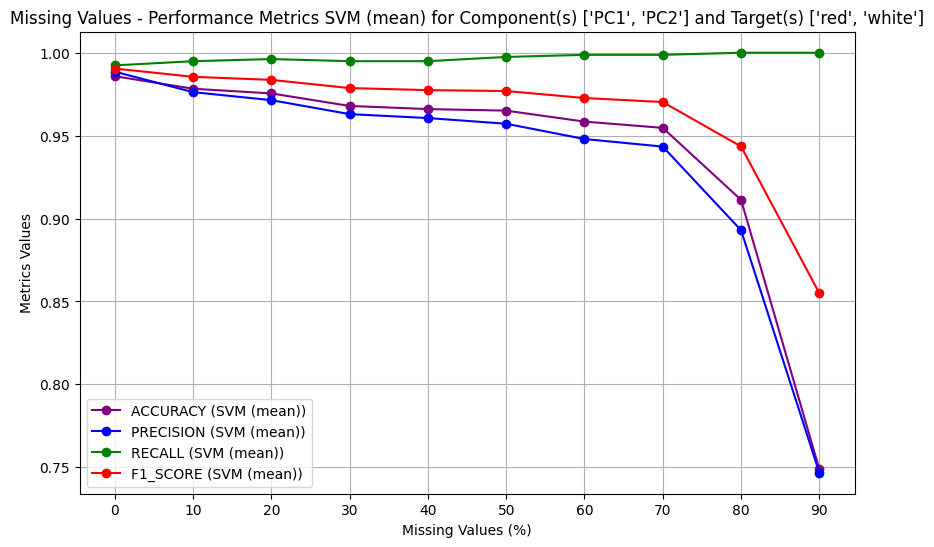

DEBUG: feature=['PC1', 'PC2'], wine_types=['red', 'white']


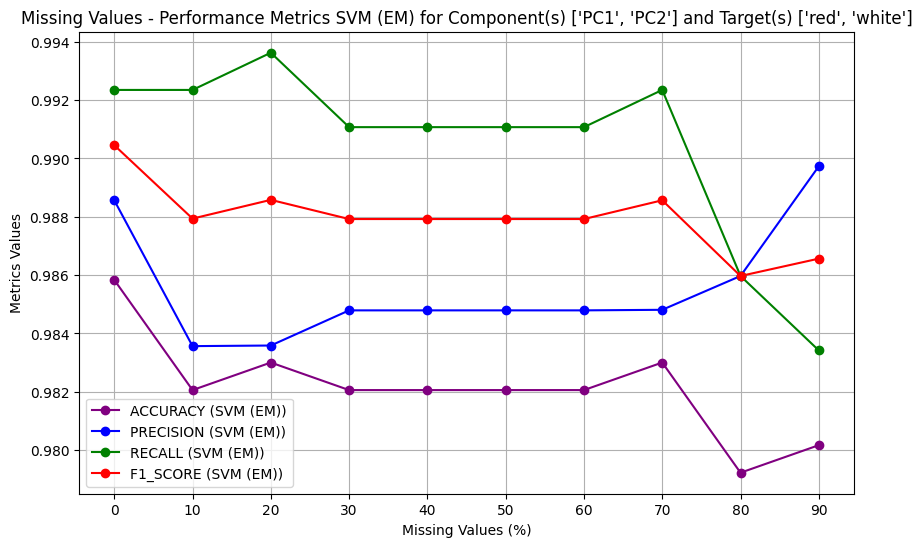

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['red']


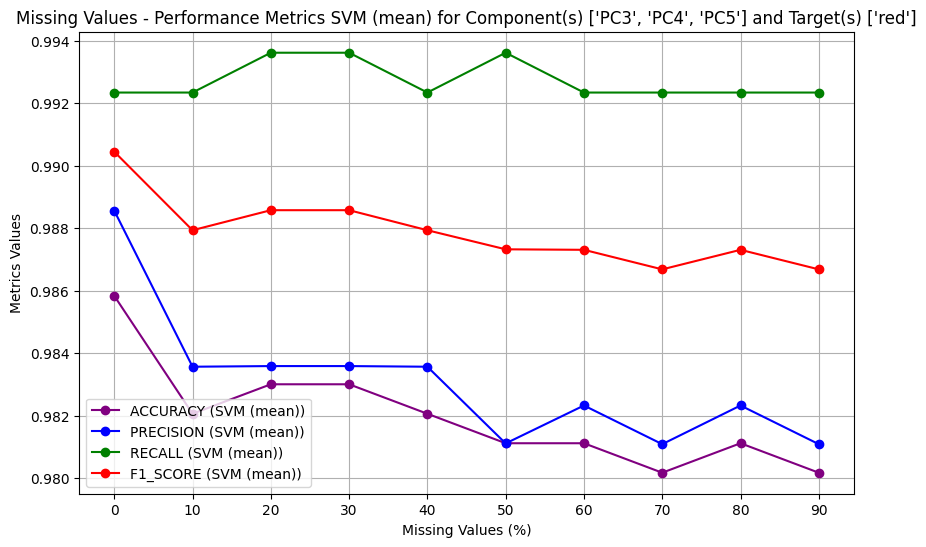

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['red']


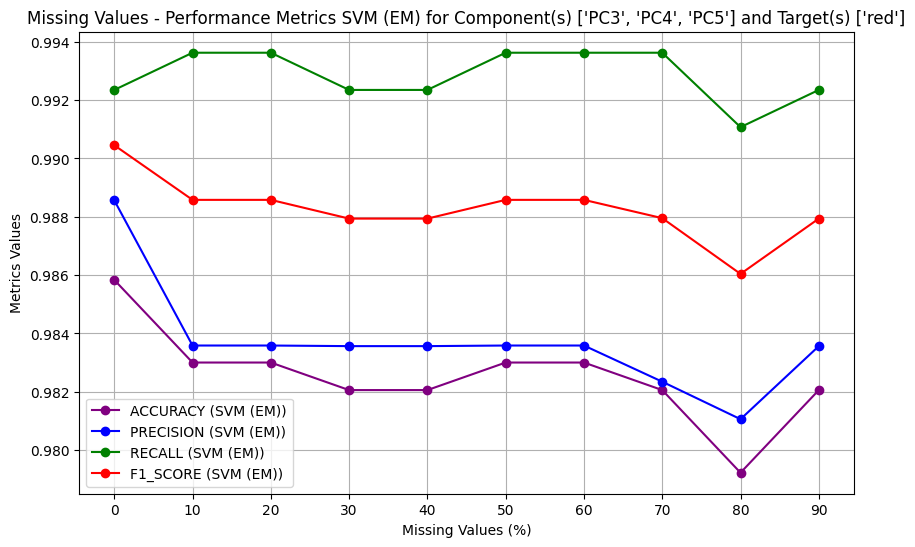

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['white']


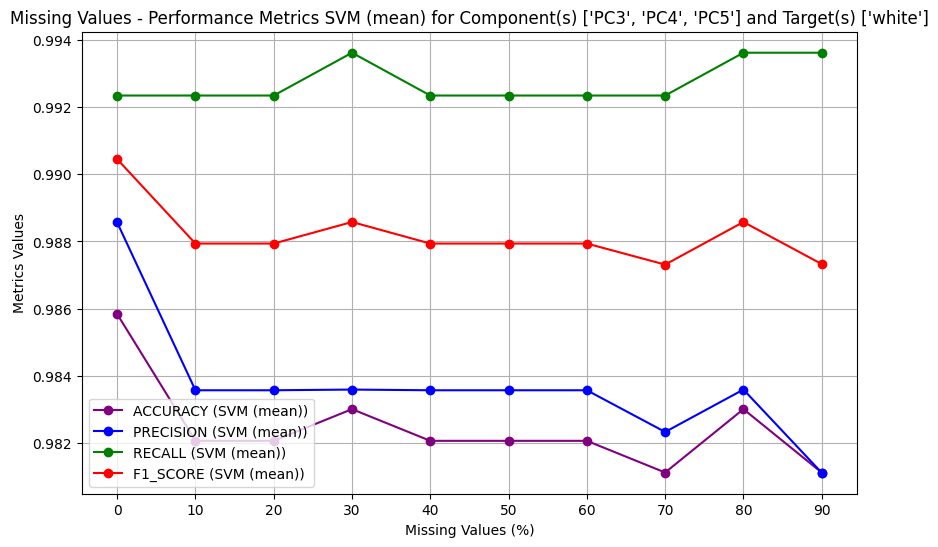

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['white']


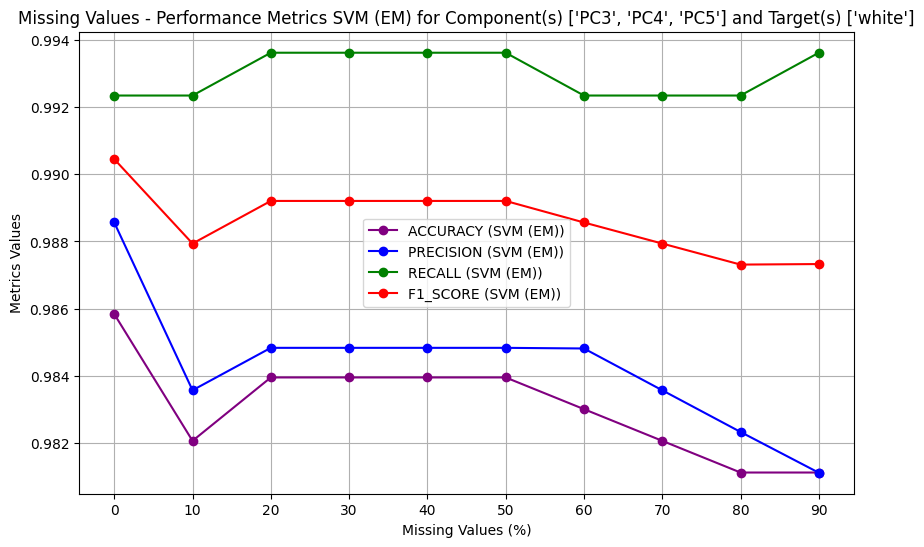

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['red', 'white']


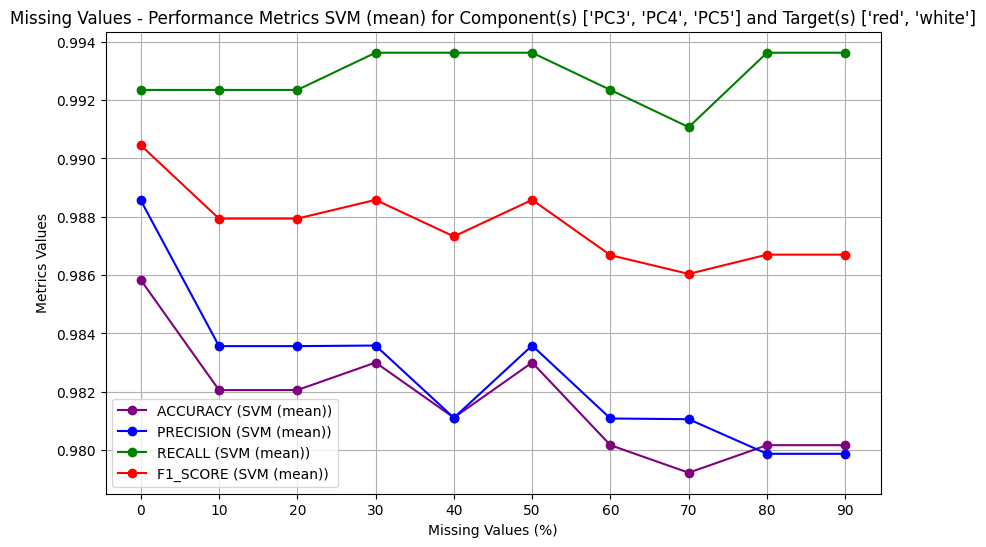

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['red', 'white']


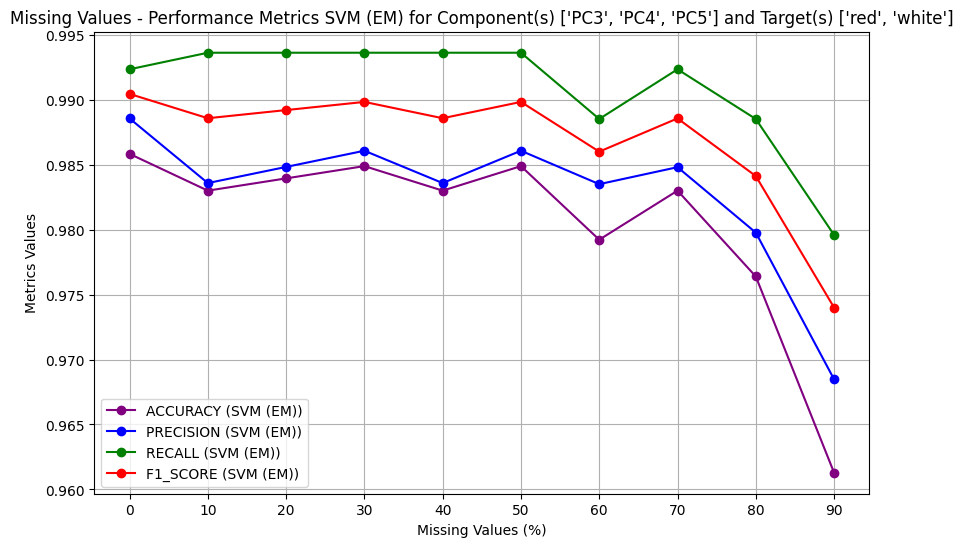

In [64]:
# Plot everything about SVM
for feature in features_to_consider_list:
    for wine_types in wine_types_to_consider_list:
        for svm_type in ["SVM (mean)", "SVM (EM)"]:
            plot_missing_values_graph(svm_type, feature, wine_types)

#### Decision Tree

DEBUG: feature=['PC1'], wine_types=['red']


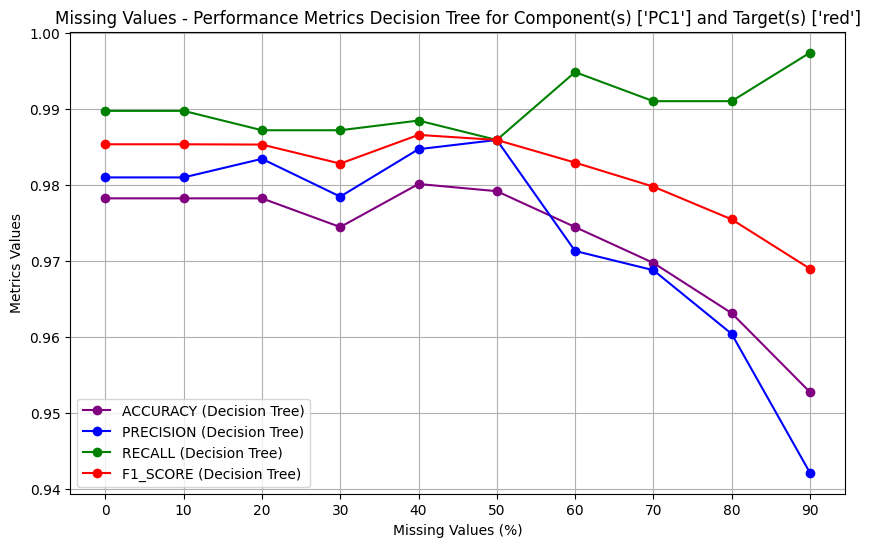

DEBUG: feature=['PC1'], wine_types=['white']


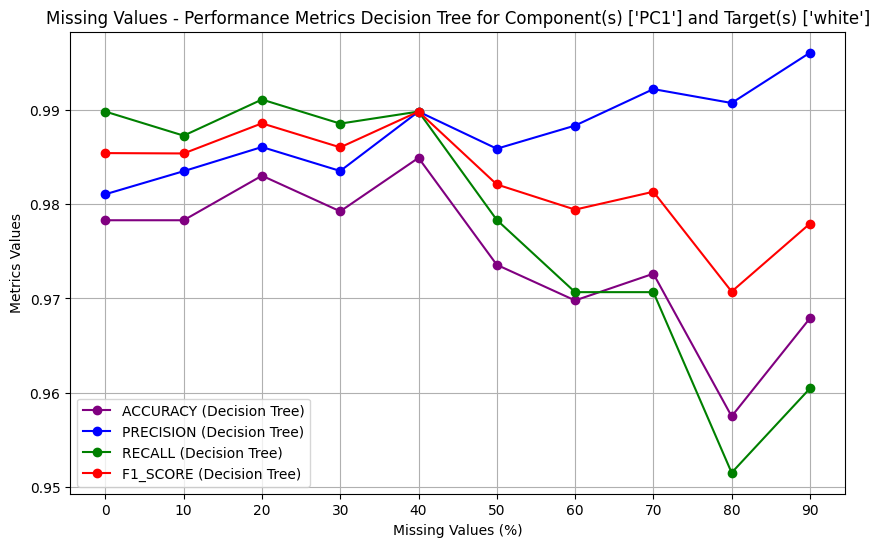

DEBUG: feature=['PC1'], wine_types=['red', 'white']


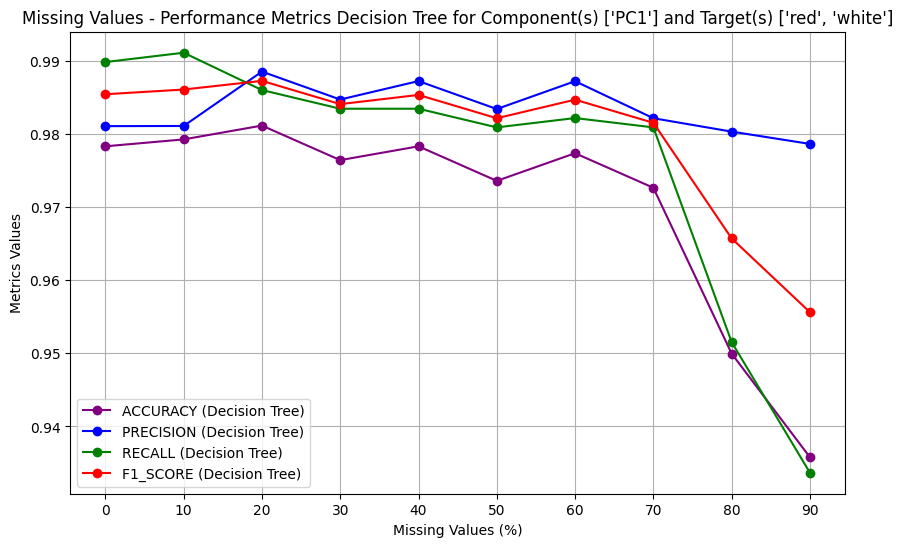

DEBUG: feature=['PC2'], wine_types=['red']


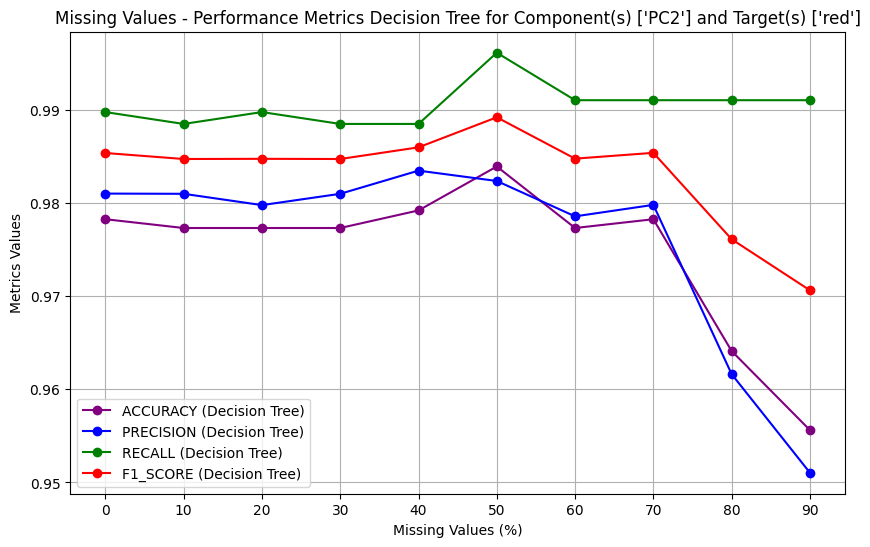

DEBUG: feature=['PC2'], wine_types=['white']


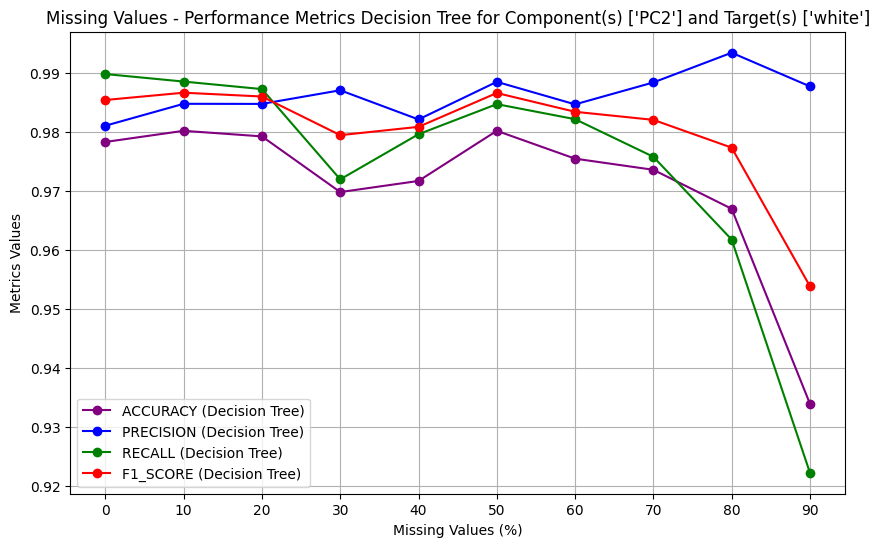

DEBUG: feature=['PC2'], wine_types=['red', 'white']


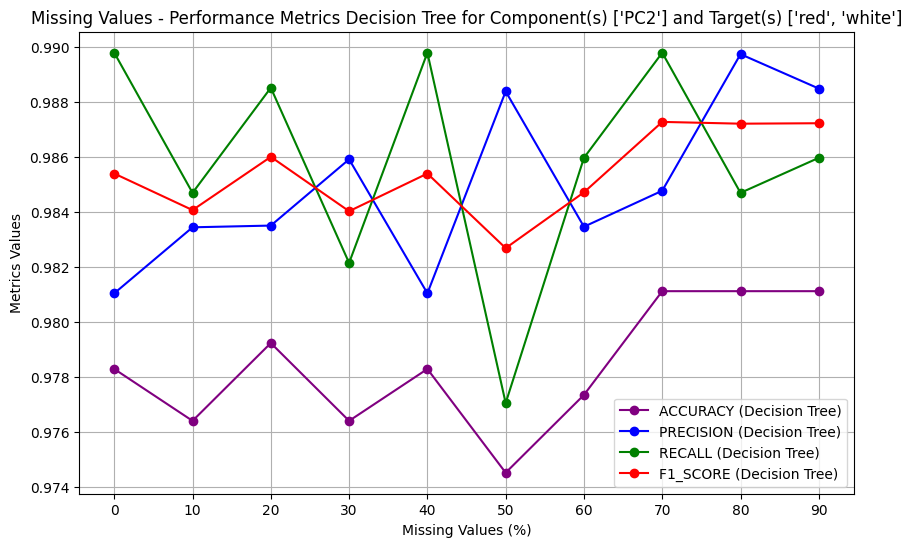

DEBUG: feature=['PC1', 'PC2'], wine_types=['red']


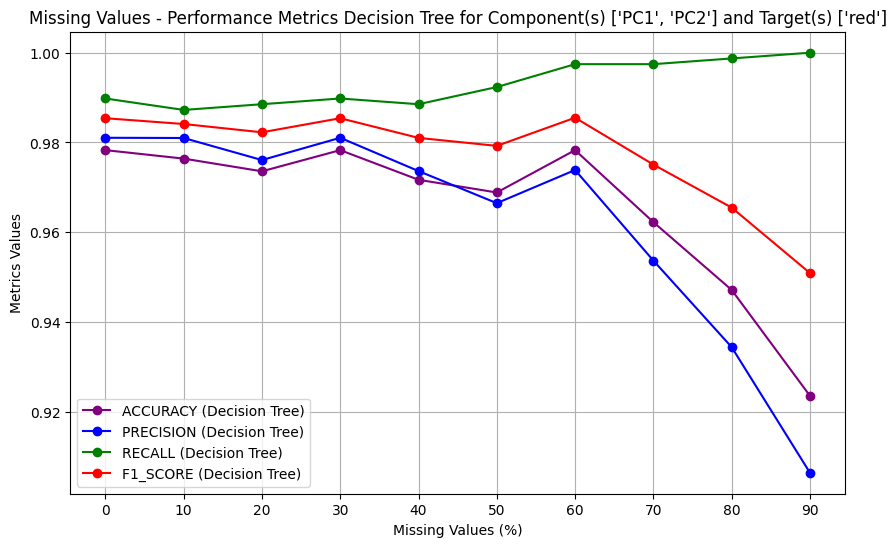

DEBUG: feature=['PC1', 'PC2'], wine_types=['white']


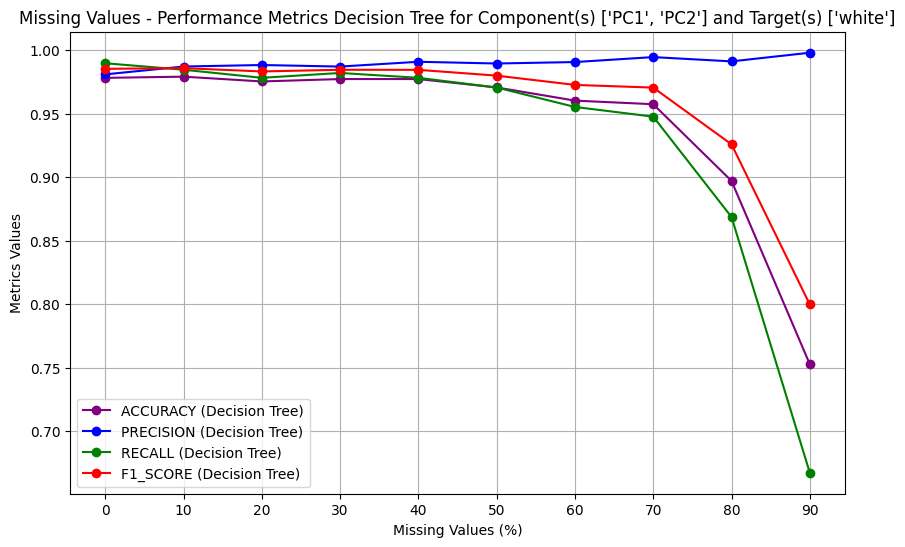

DEBUG: feature=['PC1', 'PC2'], wine_types=['red', 'white']


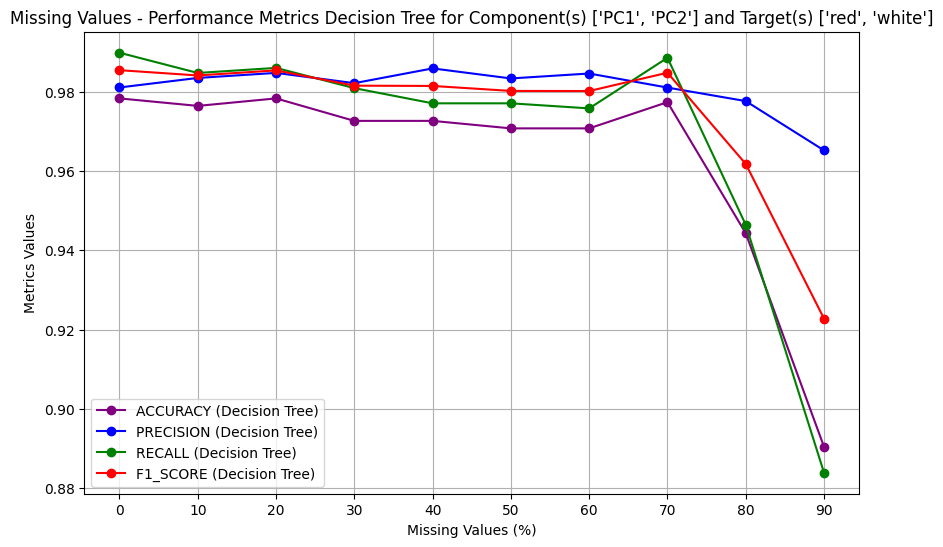

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['red']


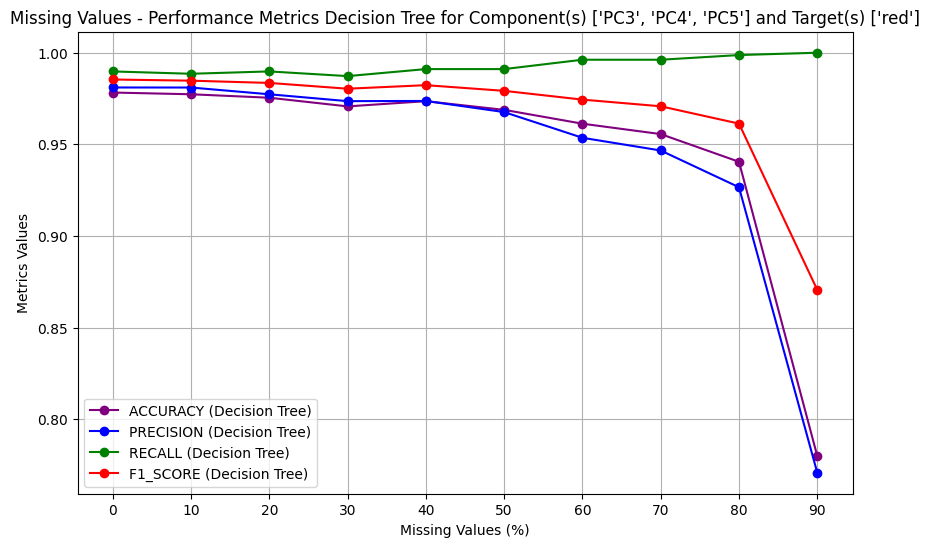

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['white']


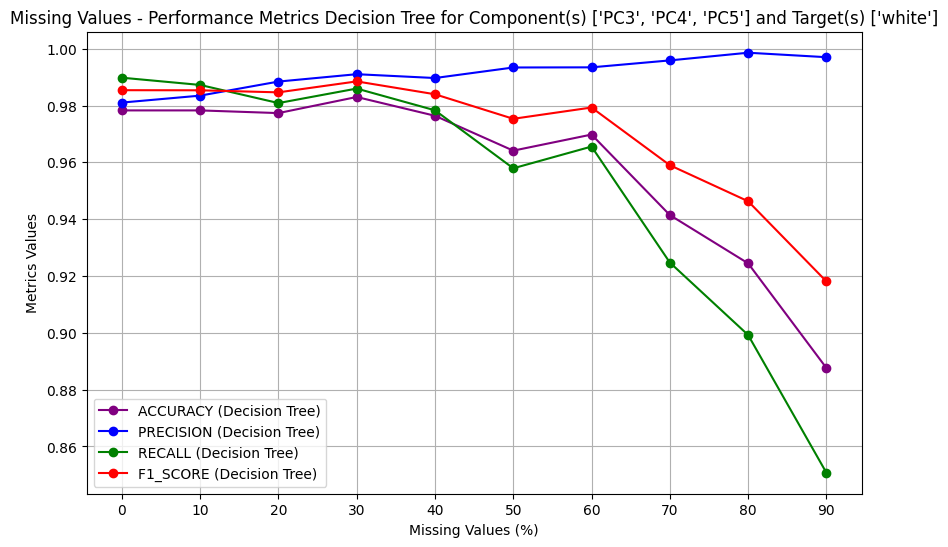

DEBUG: feature=['PC3', 'PC4', 'PC5'], wine_types=['red', 'white']


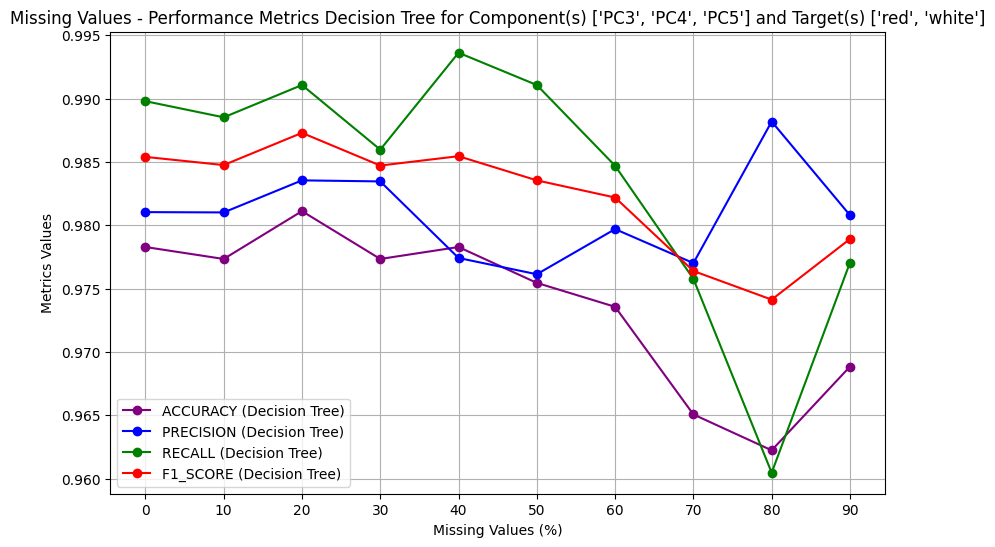

In [65]:
# Plot everything about Decision Tree
for feature in features_to_consider_list:
    for wine_types in wine_types_to_consider_list:
        plot_missing_values_graph("Decision Tree", feature, wine_types)

### Outliers 

In [66]:
# Range for Outliers Experiments
start_index = 114 
end_index = 353   
outliers = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(outliers, indent=4))

[
    {
        "experiment-name": "experiment #114",
        "features-to-dirty-outliers": [
            "PC1"
        ],
        "outliers-percentage": 0.1,
        "wine-types-to-consider-outliers": [
            "red"
        ],
        "range-type": "std"
    },
    {
        "experiment-name": "experiment #115",
        "features-to-dirty-outliers": [
            "PC2"
        ],
        "outliers-percentage": 0.1,
        "wine-types-to-consider-outliers": [
            "red"
        ],
        "range-type": "std"
    },
    {
        "experiment-name": "experiment #116",
        "features-to-dirty-outliers": [
            "PC1",
            "PC2"
        ],
        "outliers-percentage": 0.1,
        "wine-types-to-consider-outliers": [
            "red"
        ],
        "range-type": "std"
    },
    {
        "experiment-name": "experiment #117",
        "features-to-dirty-outliers": [
            "PC3",
            "PC4",
            "PC5"
        ],
        "outliers-perc

In [67]:
def get_results_outliers(features_to_consider, wine_types_to_consider_outliers, range_type):
    # Normalizza gli input se sono liste
    features = features_to_consider[0] if isinstance(features_to_consider, list) else features_to_consider
    wine_types = wine_types_to_consider_outliers[0] if isinstance(wine_types_to_consider_outliers, list) else wine_types_to_consider_outliers
    rtype = range_type[0] if isinstance(range_type, list) else range_type

    # Filtro
    results = [
        (
            int(experiment["experiment-name"][12:]),
            experiment["outliers-percentage"],
            experiment["wine-types-to-consider-outliers"],
            experiment["range-type"]
        )
        for experiment in outliers
        if experiment["features-to-dirty-outliers"] == features and
           experiment["wine-types-to-consider-outliers"] == wine_types and
           experiment["range-type"] == rtype
    ]

    # Inserisci il "fake experiment" solo se possibile
    if len(results) >= 2:
        results.insert(0, (0, 0.0, results[1][2], results[1][3]))
    elif len(results) == 1:
        results.insert(0, (0, 0.0, results[0][2], results[0][3]))
    else:
        print(f"⚠️ Nessun risultato trovato per: features={features}, wine_types={wine_types}, range_type={rtype}")
        return []

    return results

In [68]:
# Function to plot
def plot_outliers_graph(model_name_to_consider, features_to_consider, wine_types_to_consider_outliers, range_type):
    # Get the results object
    results = get_results_outliers(features_to_consider, wine_types_to_consider_outliers, range_type)

    # Make the graph
    plt.figure(figsize=(10, 6))

    for metric, color in metrics.items():
        # Initialize lists to collect x and y values
        x_values = []
        y_values = []

        for experiment_id, percentage, _, _ in results:
            # Select the correct experiment in the df of metrics
            data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

            if data.empty:
                # Experiment 0
                assert experiment_id == 0, "Something went wrong, expected experiment 0"
            
                # Get the data properly
                data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]
                if data.empty:
                    assert False, "This was unexpected"

            # Get the metrics
            metric_value = data[metric].values[0]
            # Collect the data points
            x_values.append(percentage * 100)
            y_values.append(metric_value)
        # Plot all collected points and lines for the current metric
        plt.plot(x_values, y_values, marker='o', linestyle='-', color=color, label=f"{metric.upper()} ({model_name_to_consider})")
       
    plt.xlabel('Outliers (%)')
    plt.ylabel('Metrics Values')
    plt.title(f'Outliers - Performance Metrics {model_name_to_consider} for Component(s) {features_to_consider}, Target(s) {wine_types_to_consider_outliers} and Range Type(s) {range_type}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.xticks([10 * i for i in range(0, 11)])
    plt.show()

#### SVM

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=std


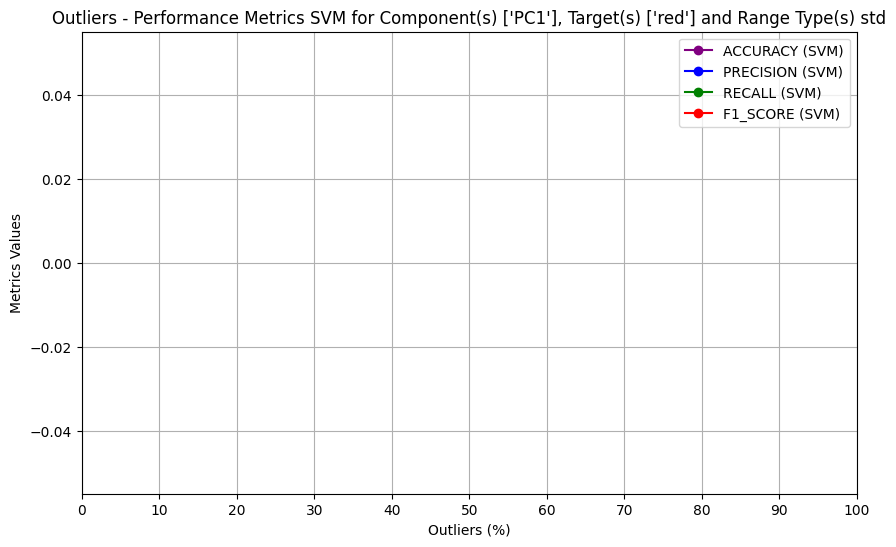

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=iqr


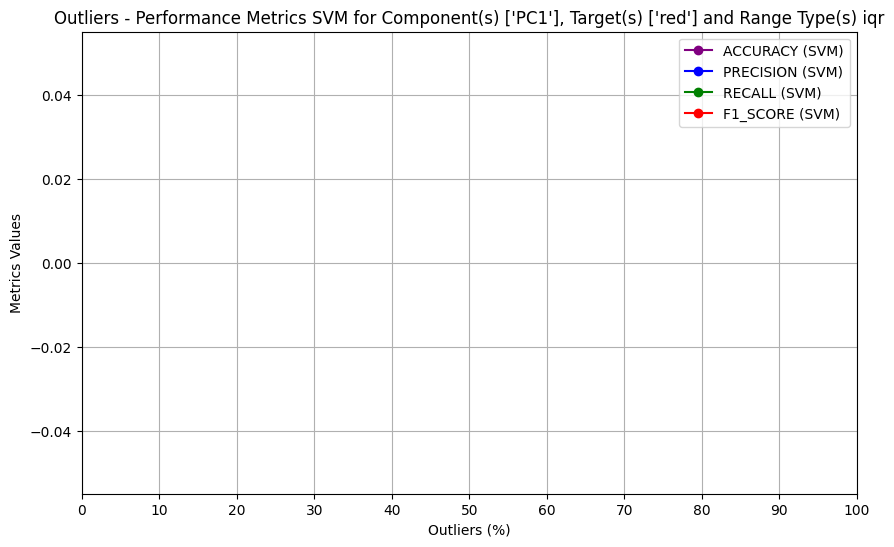

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white, range_type=std


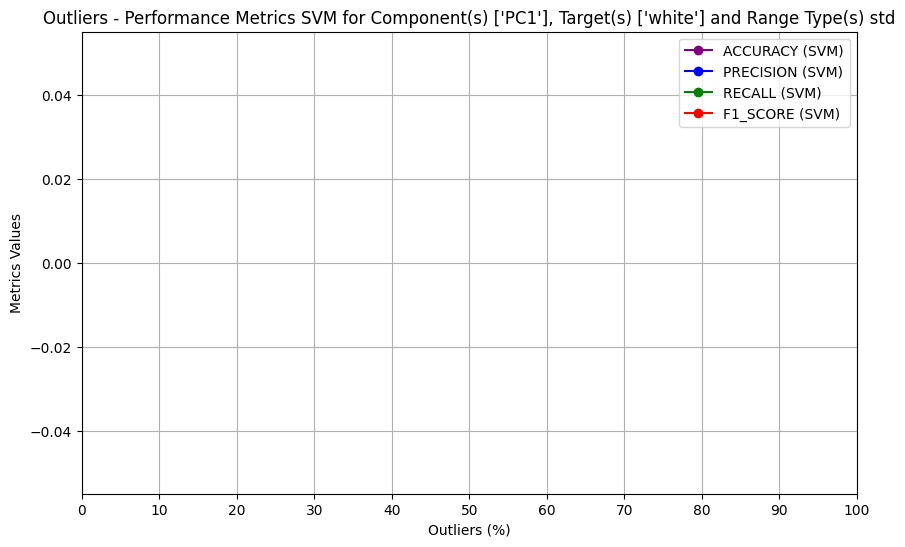

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white, range_type=iqr


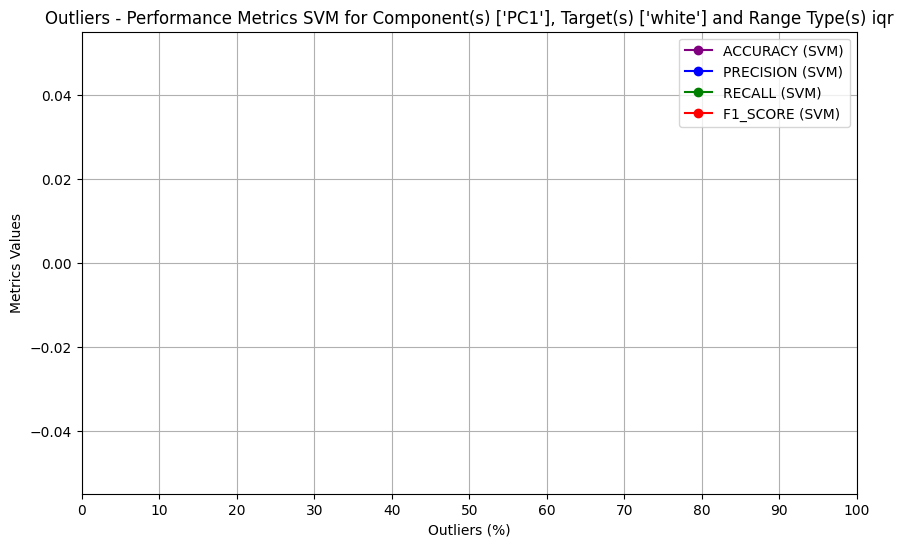

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=std


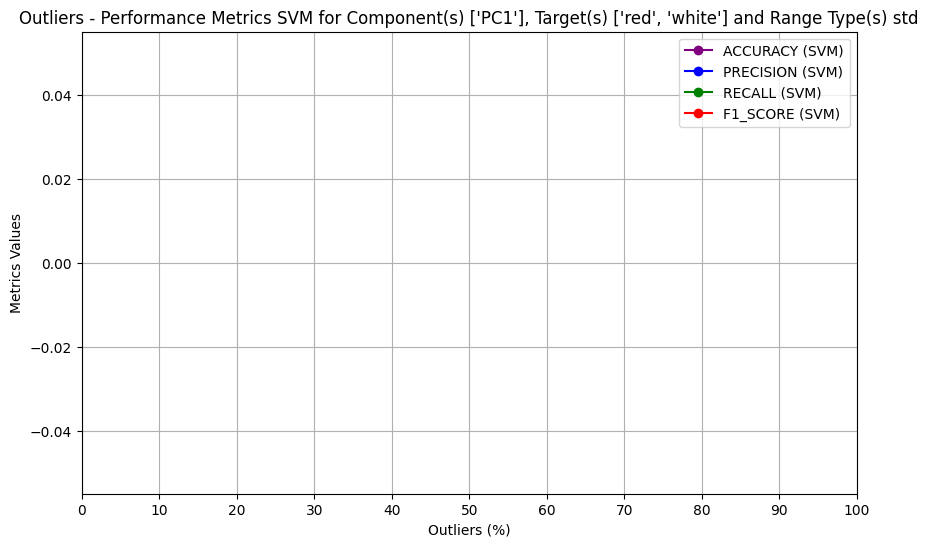

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=iqr


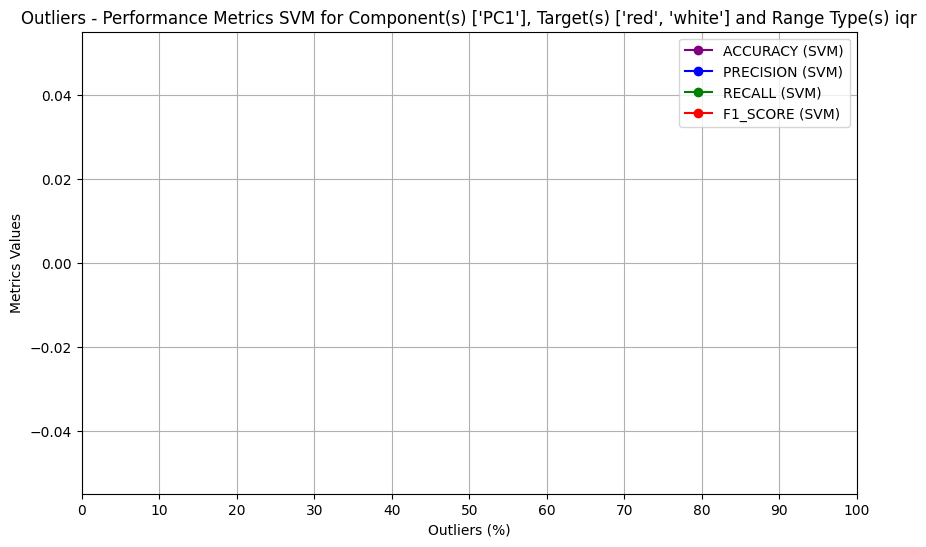

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red, range_type=std


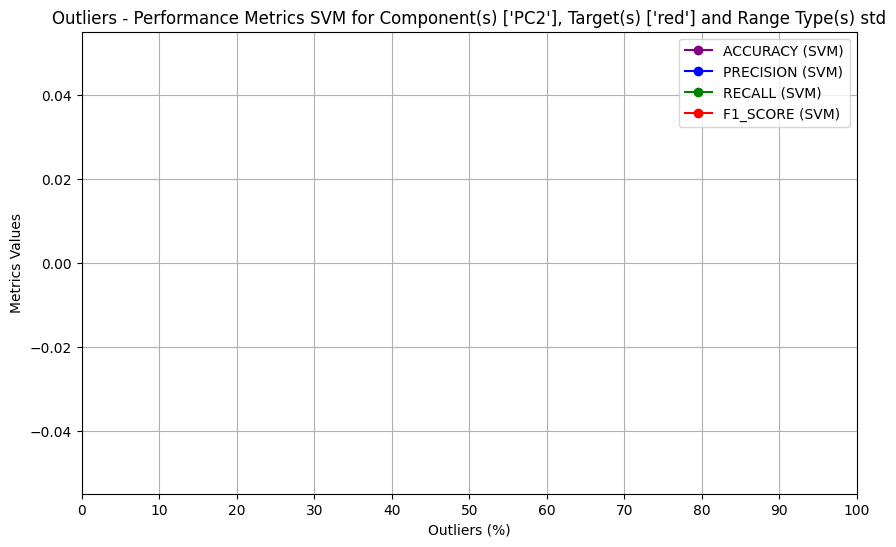

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red, range_type=iqr


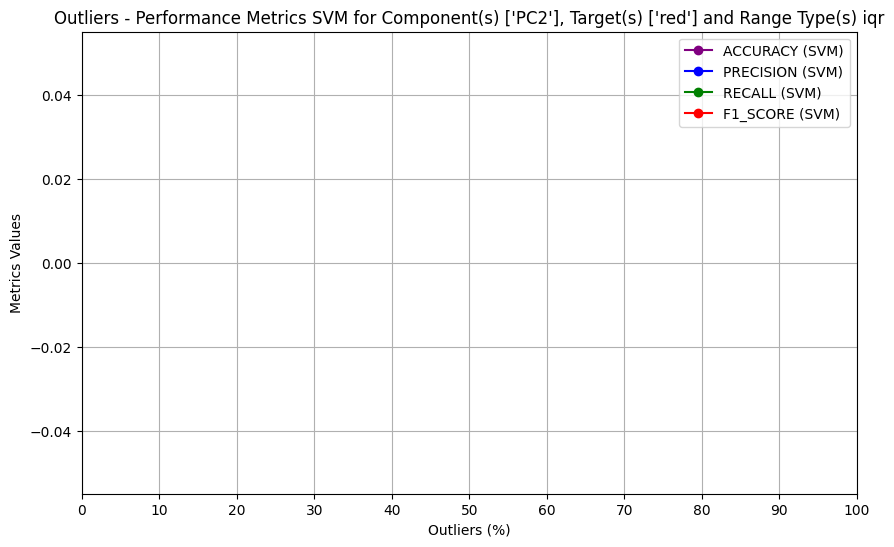

⚠️ Nessun risultato trovato per: features=PC2, wine_types=white, range_type=std


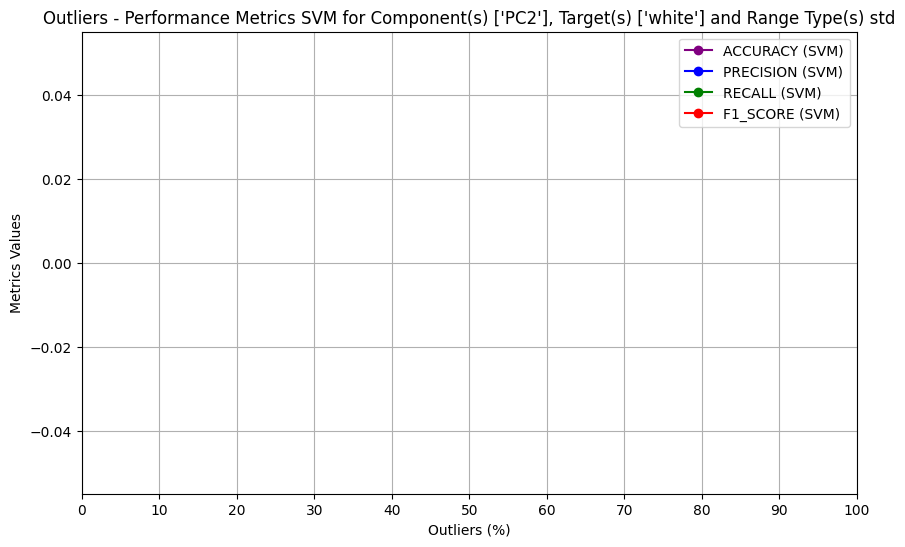

⚠️ Nessun risultato trovato per: features=PC2, wine_types=white, range_type=iqr


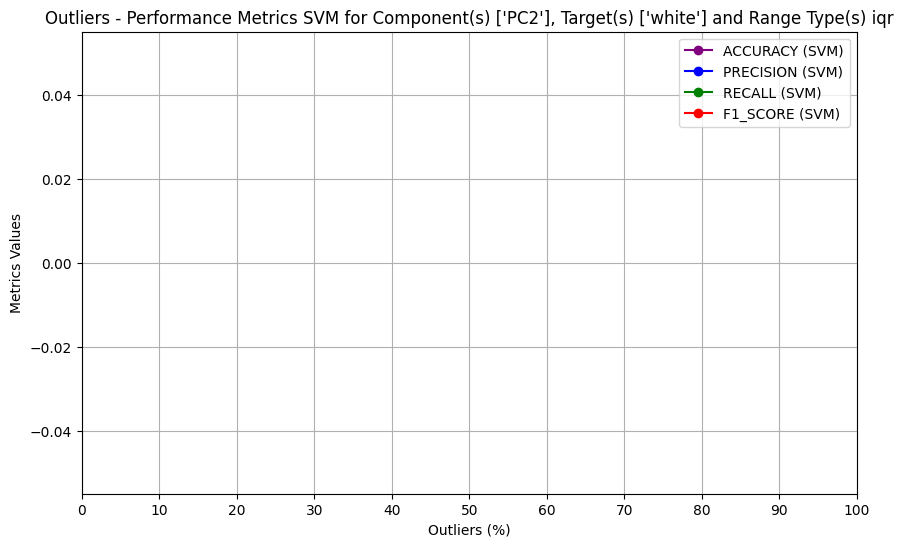

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red, range_type=std


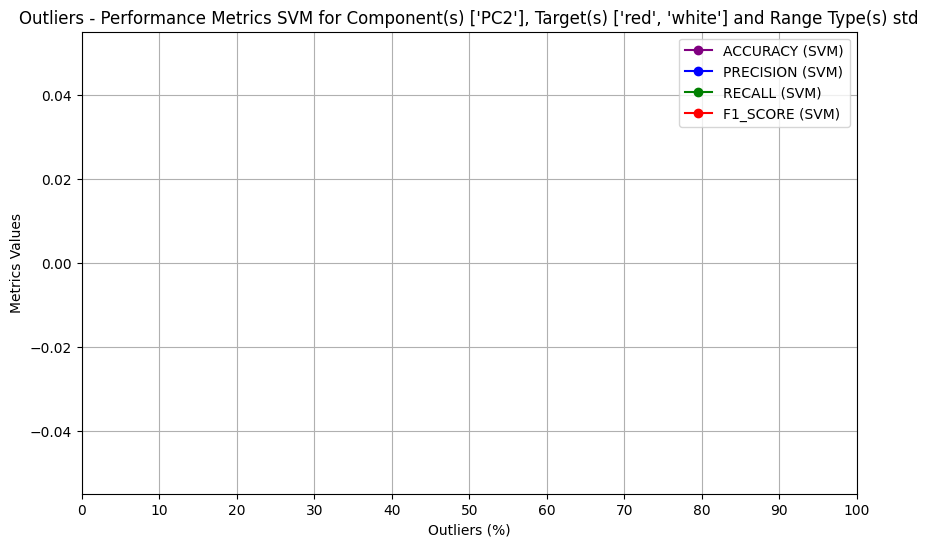

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red, range_type=iqr


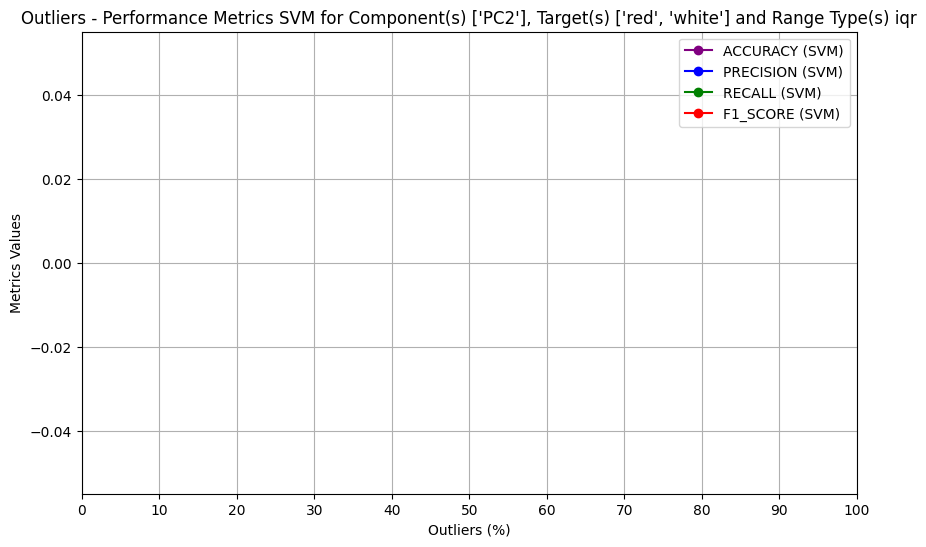

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=std


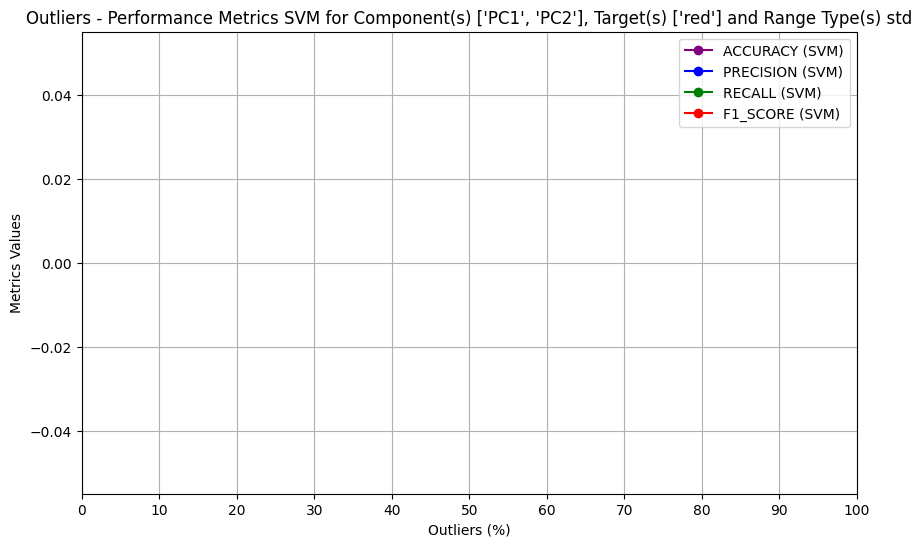

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=iqr


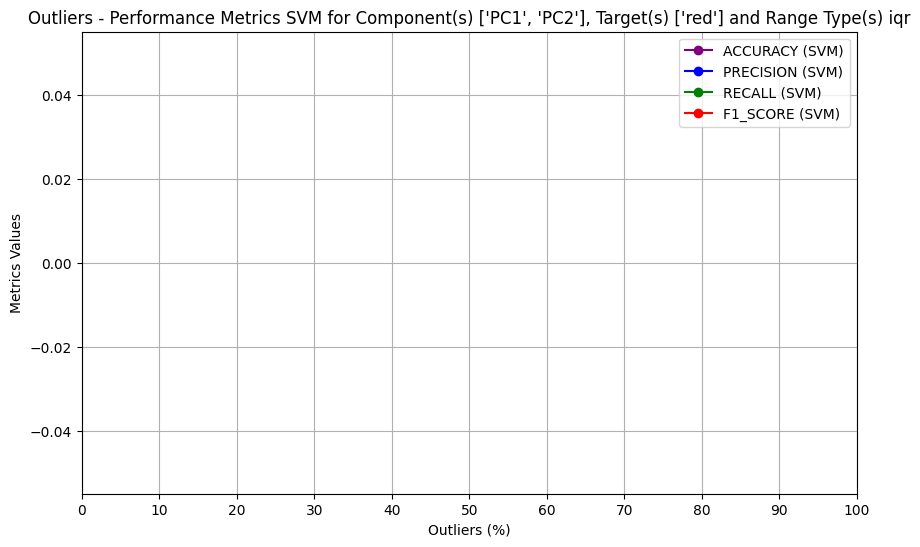

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white, range_type=std


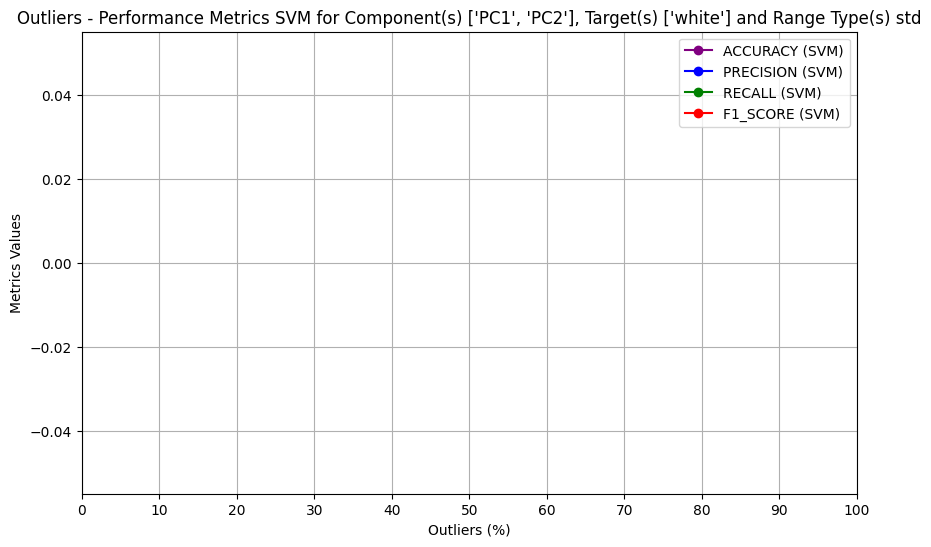

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white, range_type=iqr


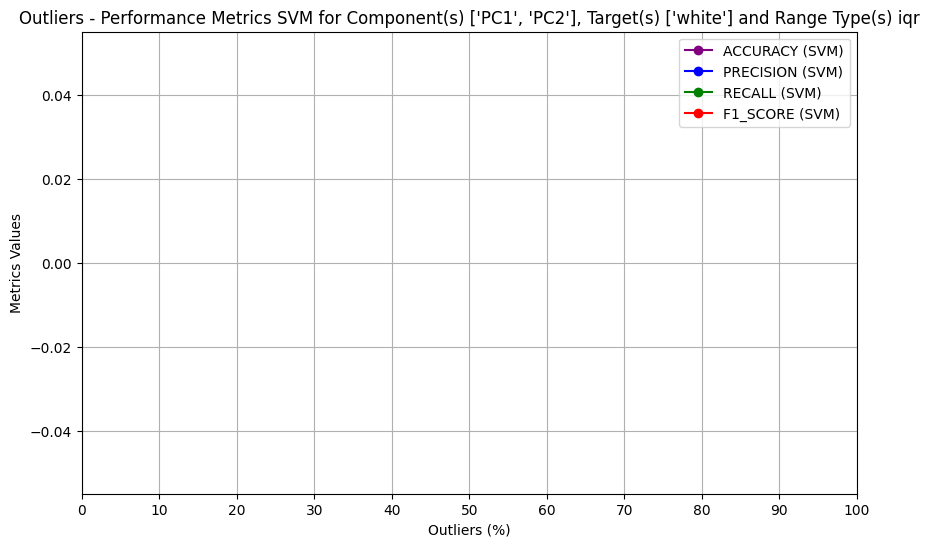

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=std


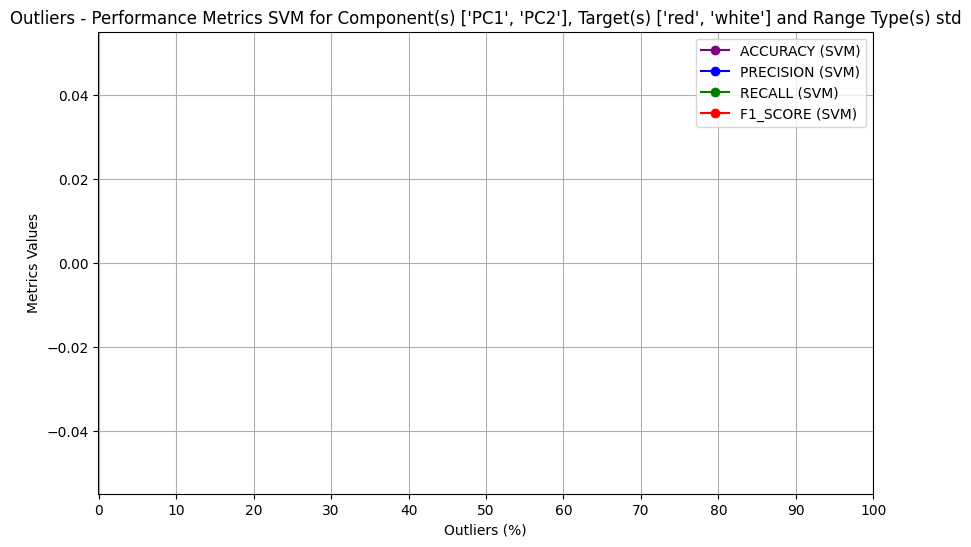

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=iqr


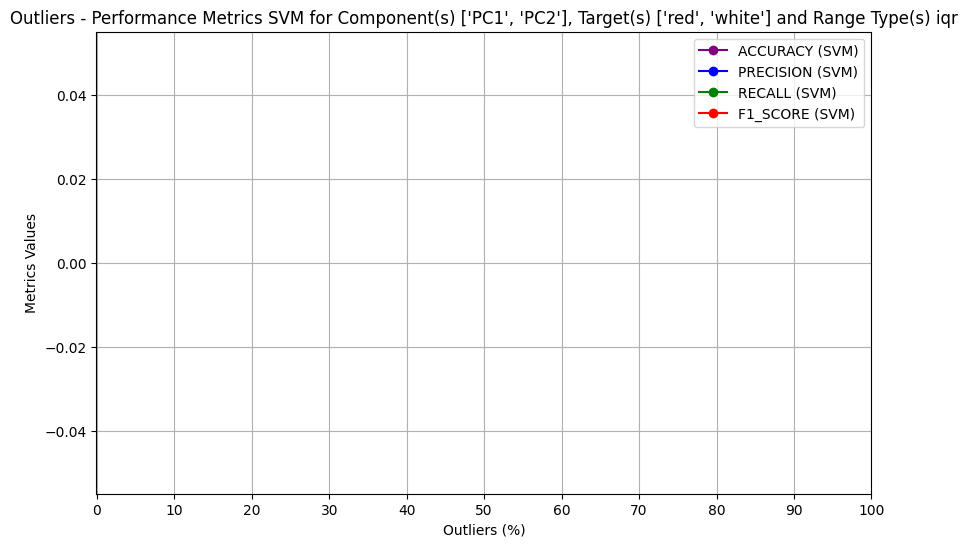

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red, range_type=std


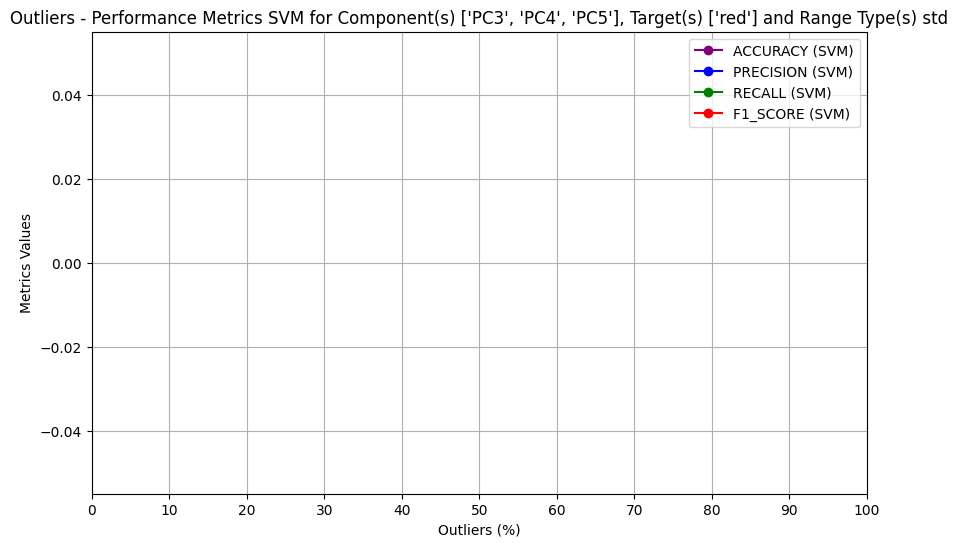

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red, range_type=iqr


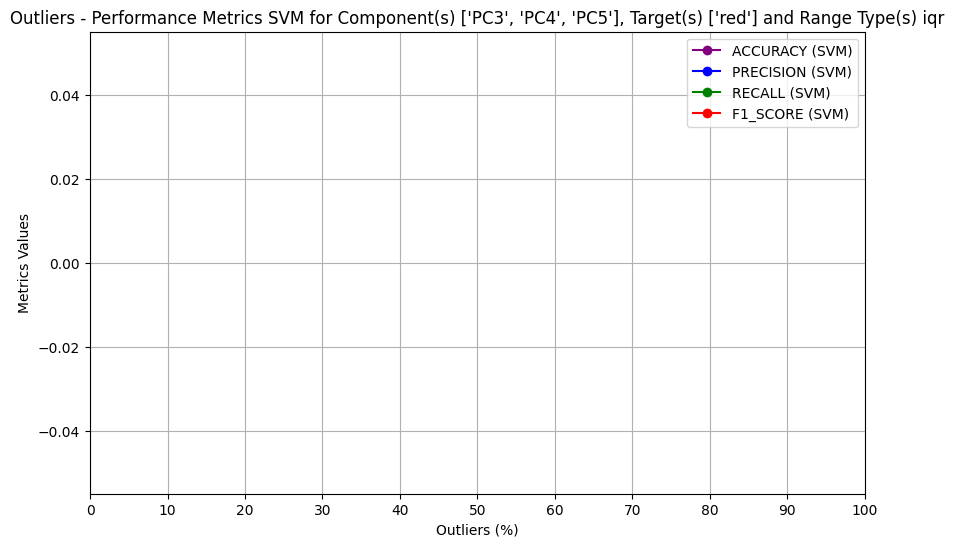

⚠️ Nessun risultato trovato per: features=PC3, wine_types=white, range_type=std


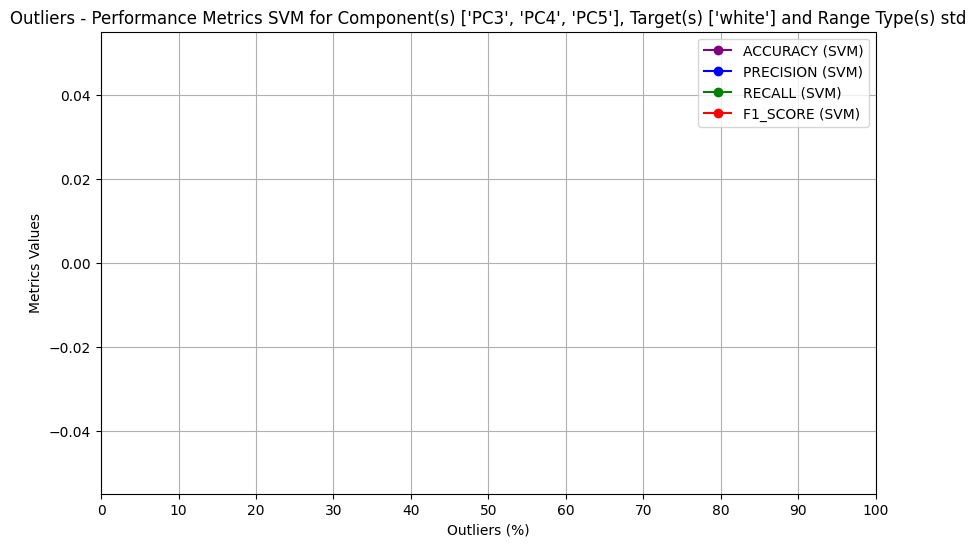

⚠️ Nessun risultato trovato per: features=PC3, wine_types=white, range_type=iqr


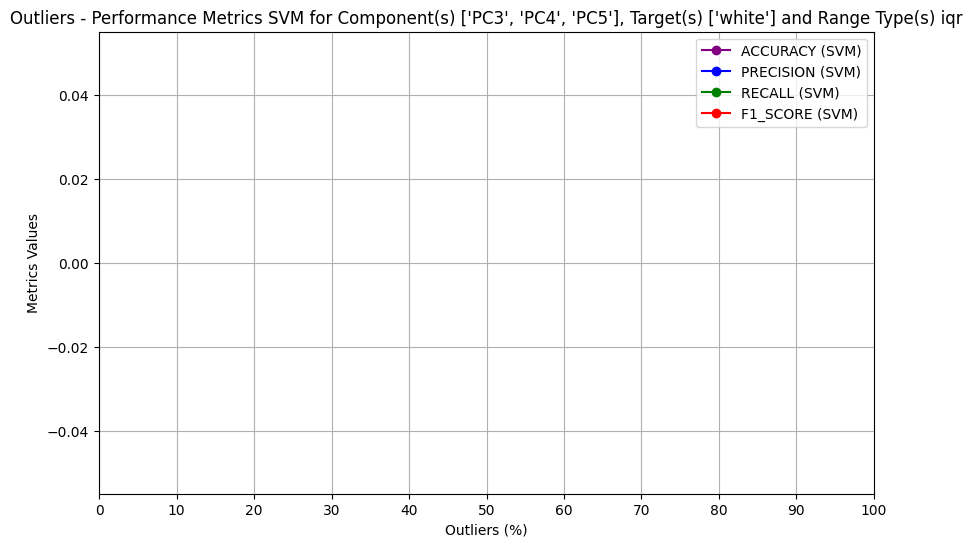

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red, range_type=std


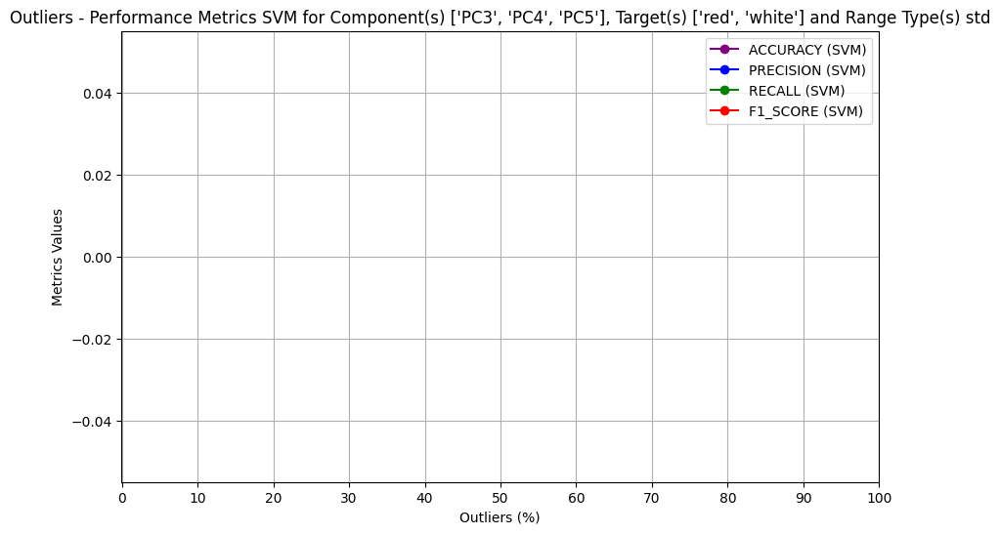

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red, range_type=iqr


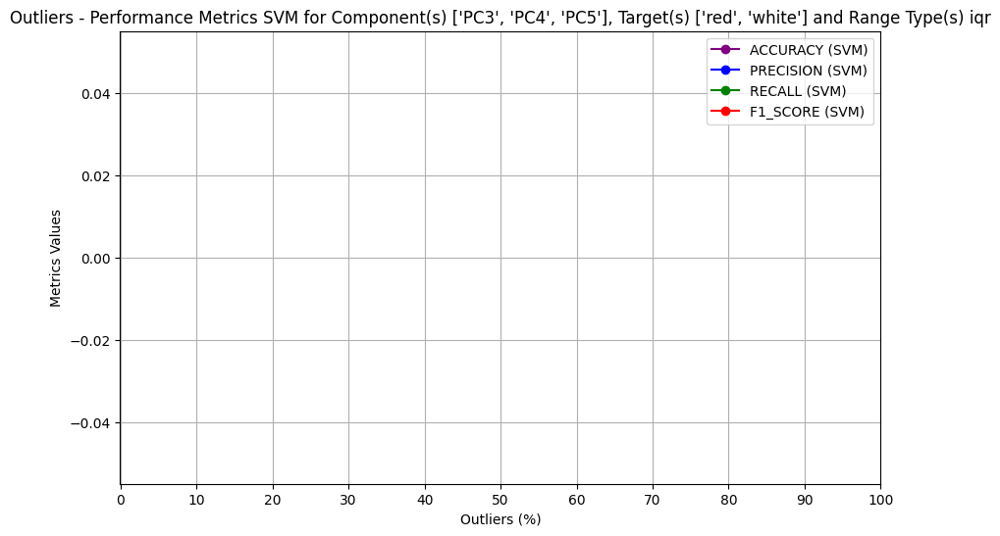

In [69]:
# Plot everything about cambia qua
for feature in features_to_consider_list:
    for wine_types in wine_types_to_consider_list:
        for range_type in range_type_to_consider_list:
            plot_outliers_graph("SVM", feature, wine_types, range_type)

#### Decision Tree

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=std


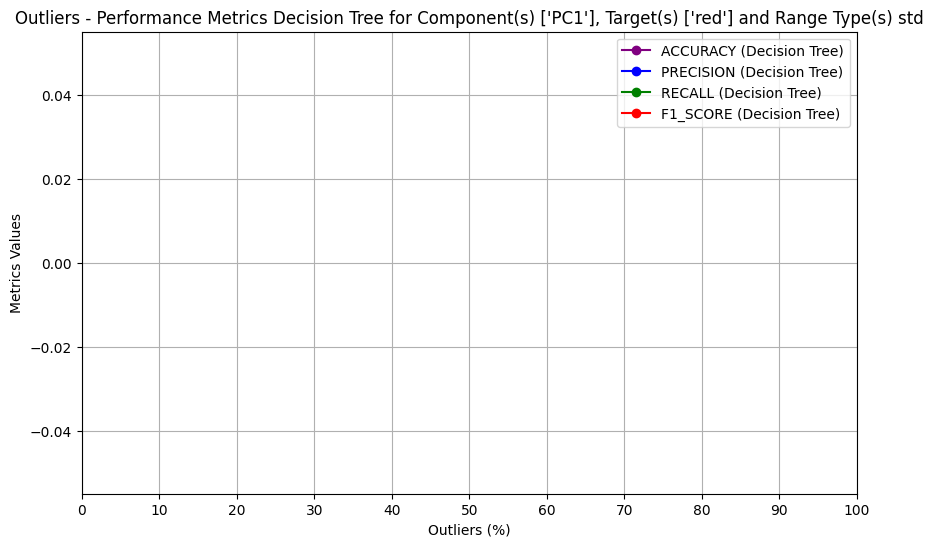

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=iqr


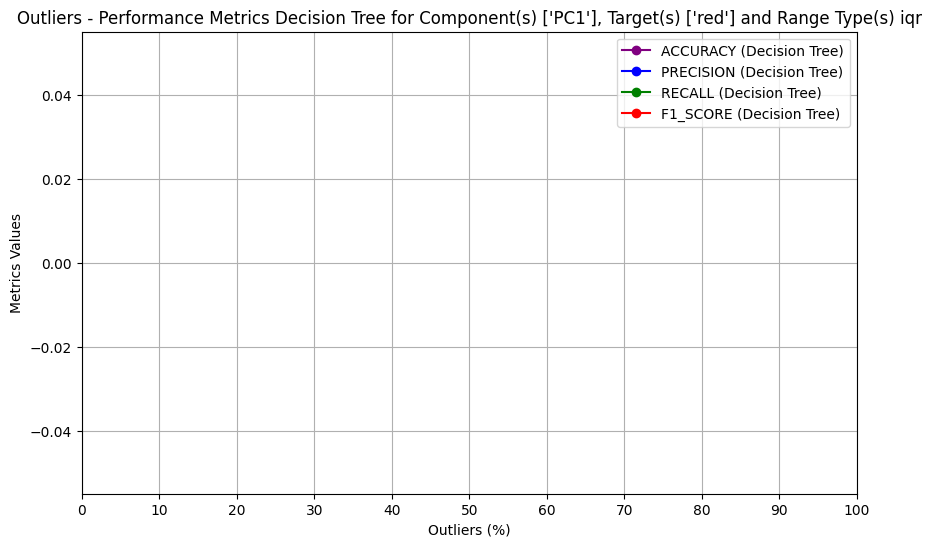

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white, range_type=std


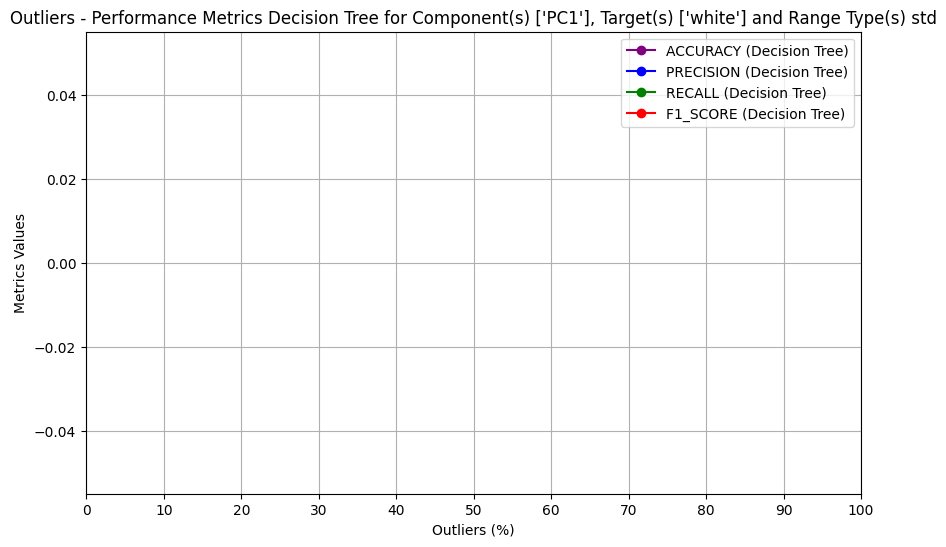

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white, range_type=iqr


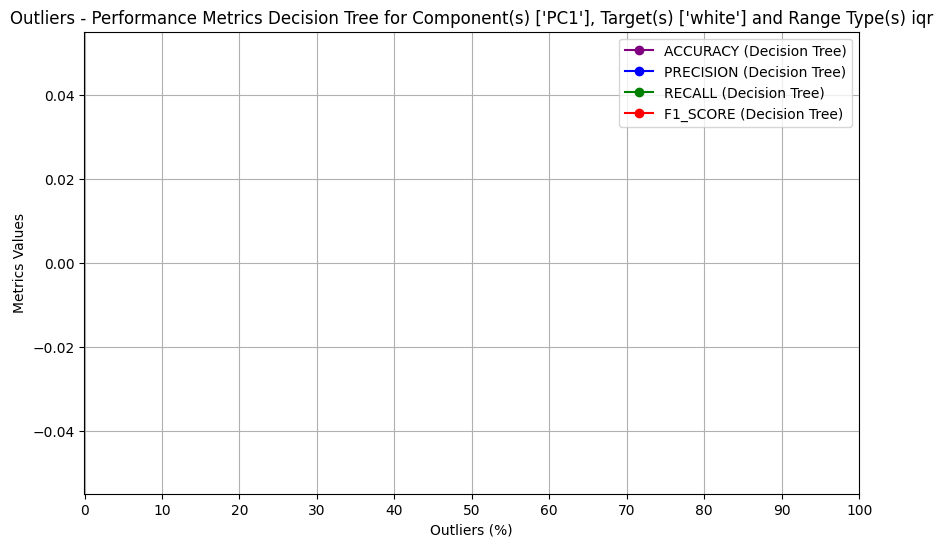

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=std


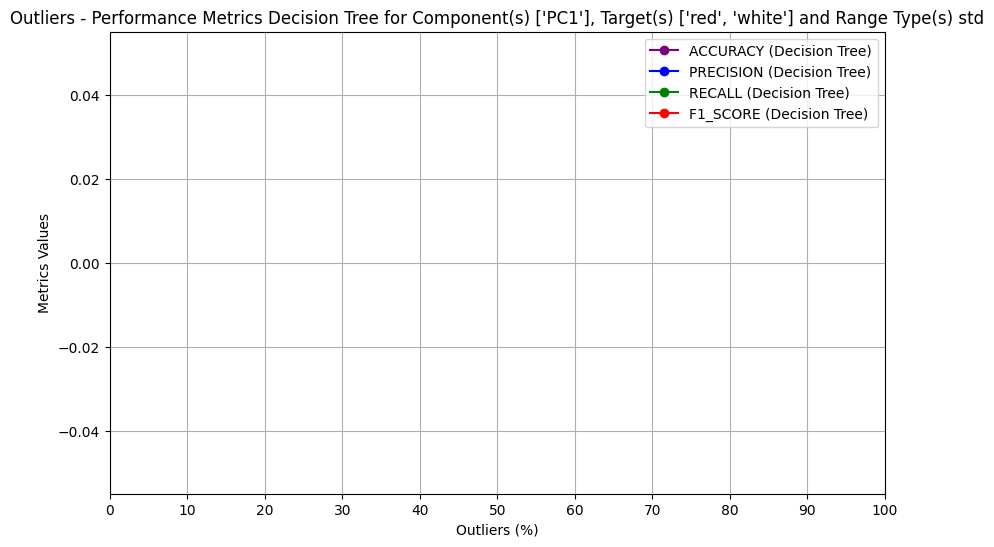

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=iqr


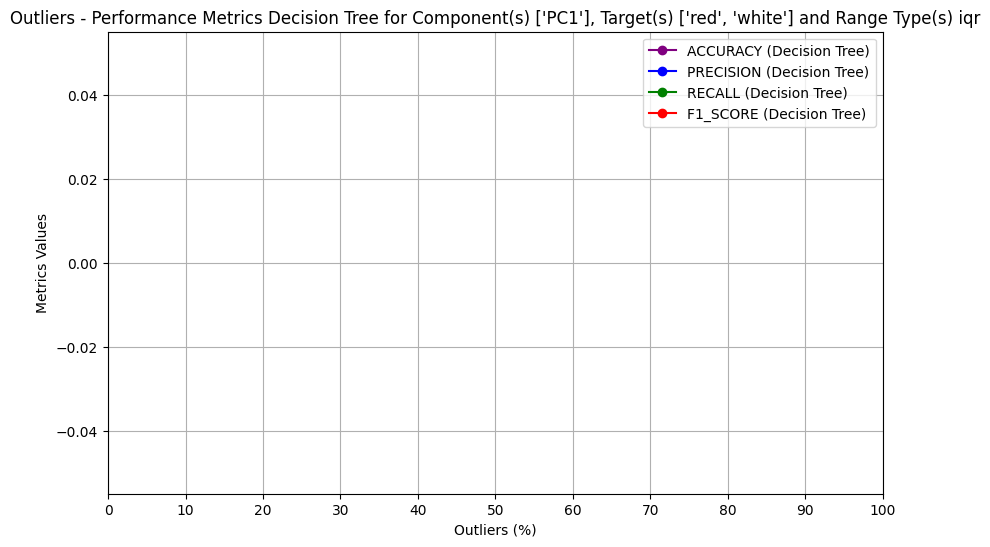

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red, range_type=std


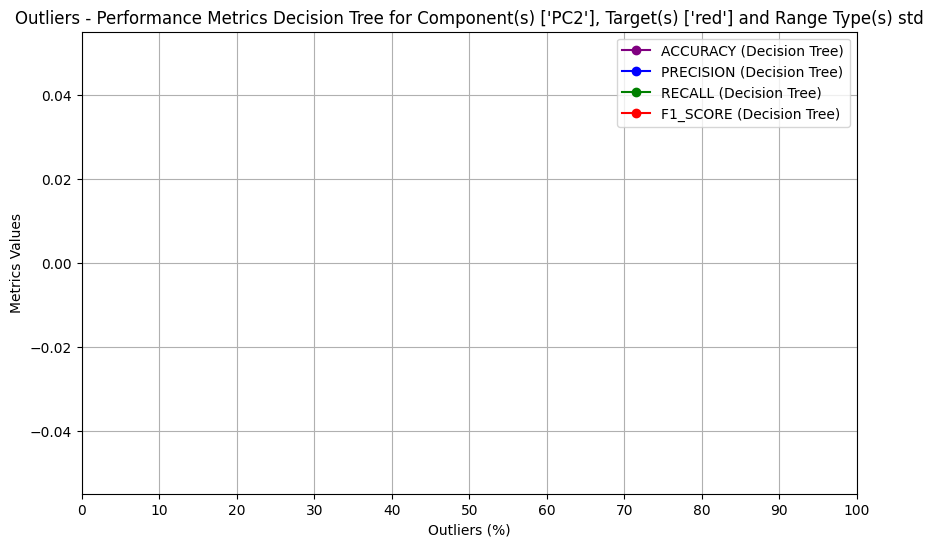

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red, range_type=iqr


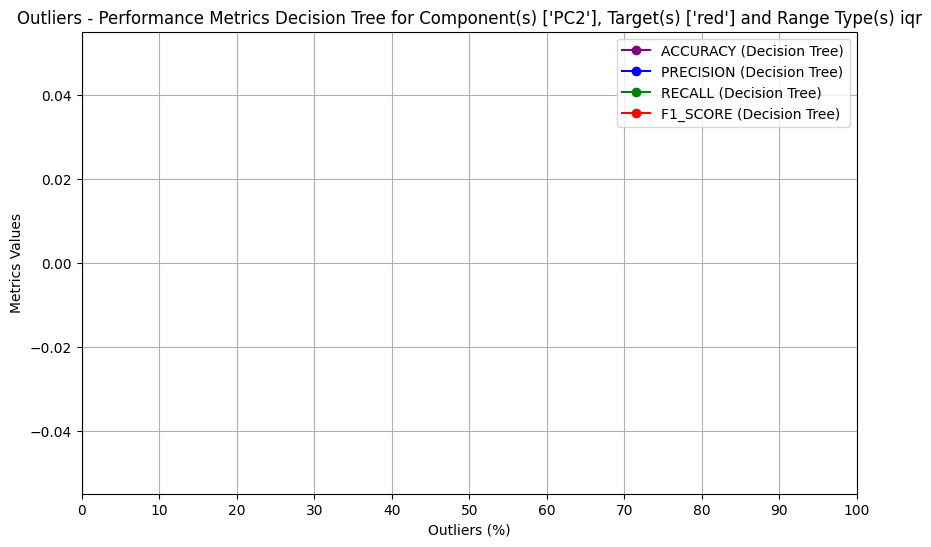

⚠️ Nessun risultato trovato per: features=PC2, wine_types=white, range_type=std


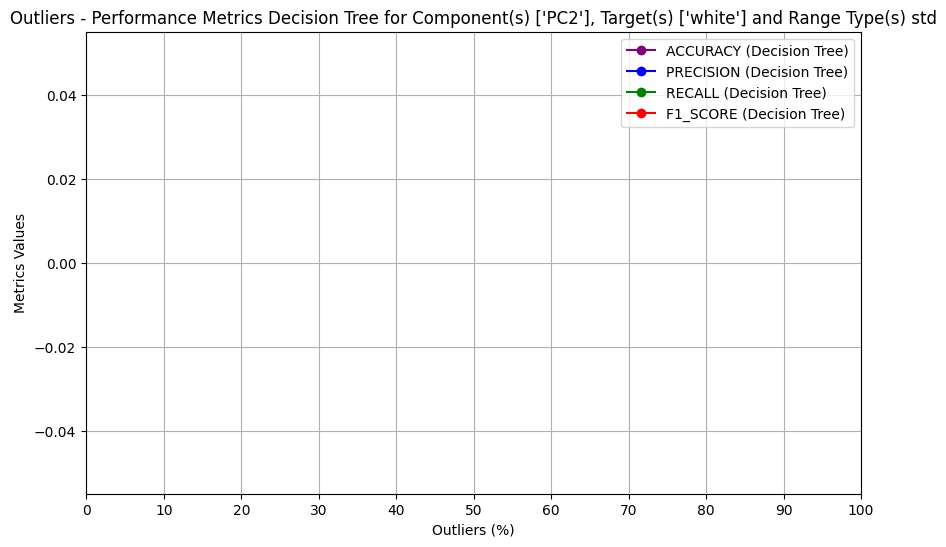

⚠️ Nessun risultato trovato per: features=PC2, wine_types=white, range_type=iqr


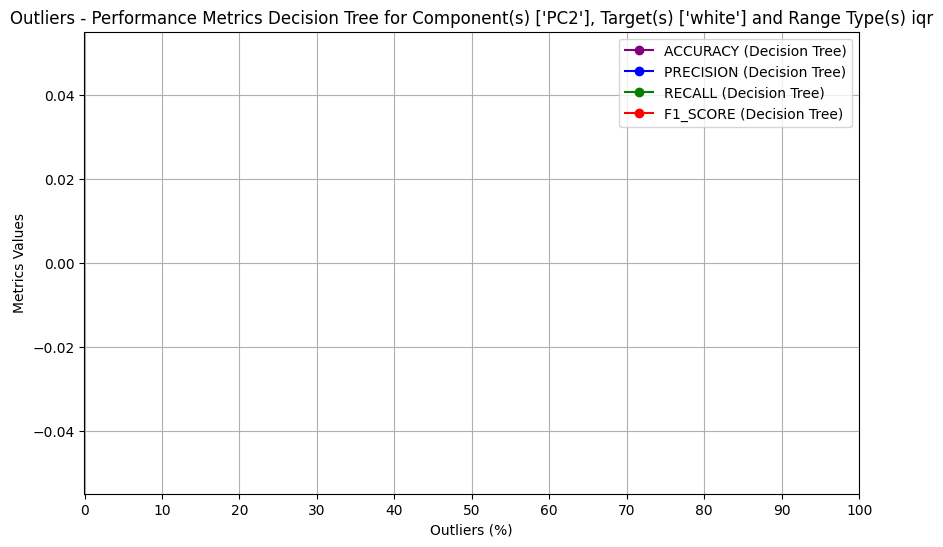

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red, range_type=std


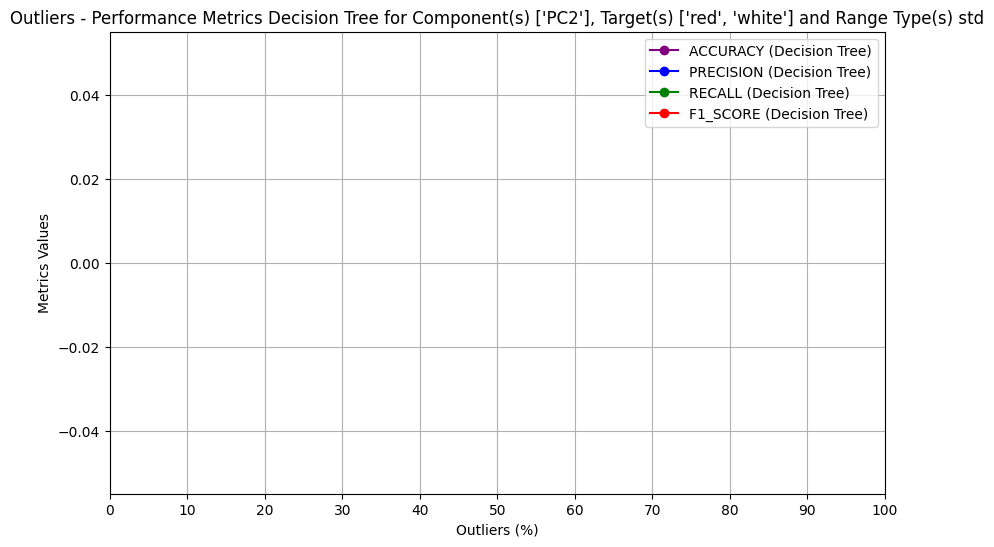

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red, range_type=iqr


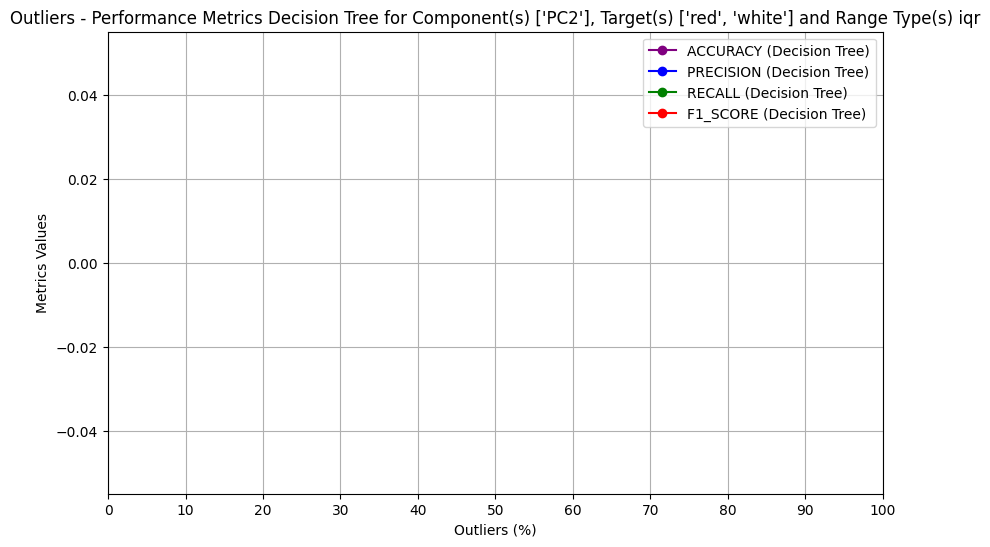

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=std


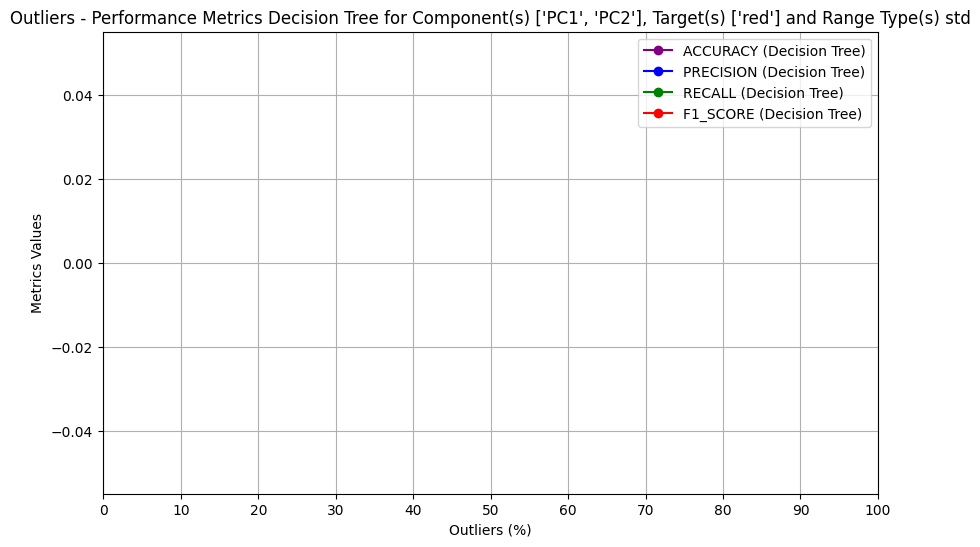

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=iqr


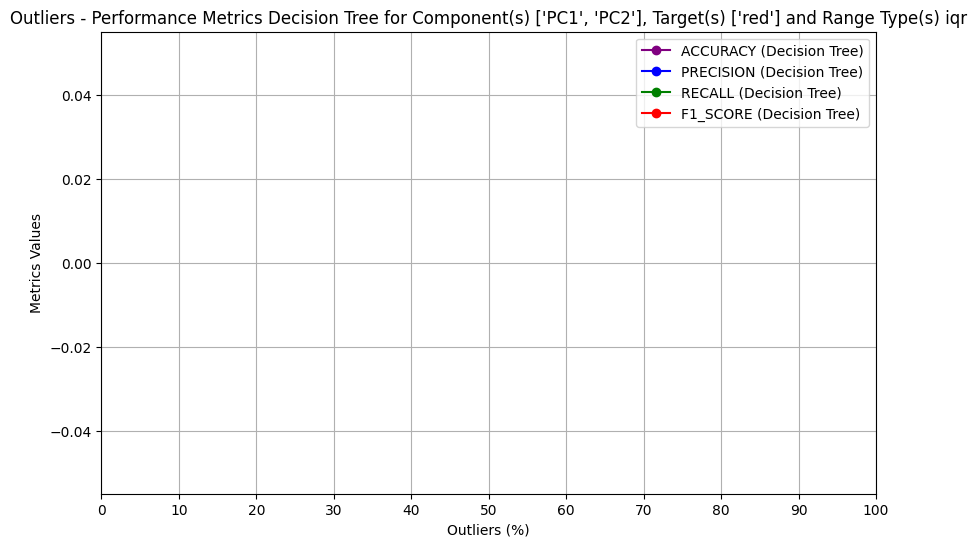

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white, range_type=std


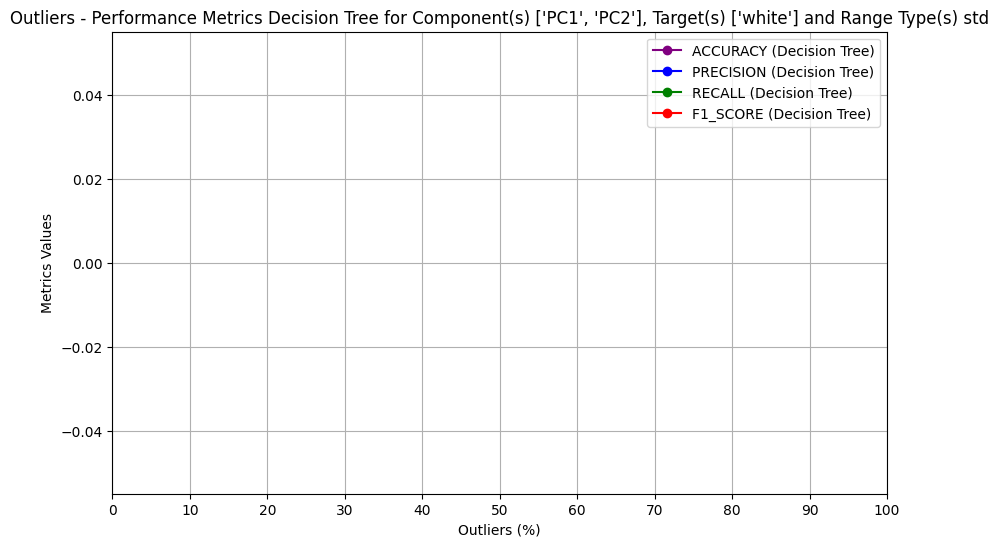

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white, range_type=iqr


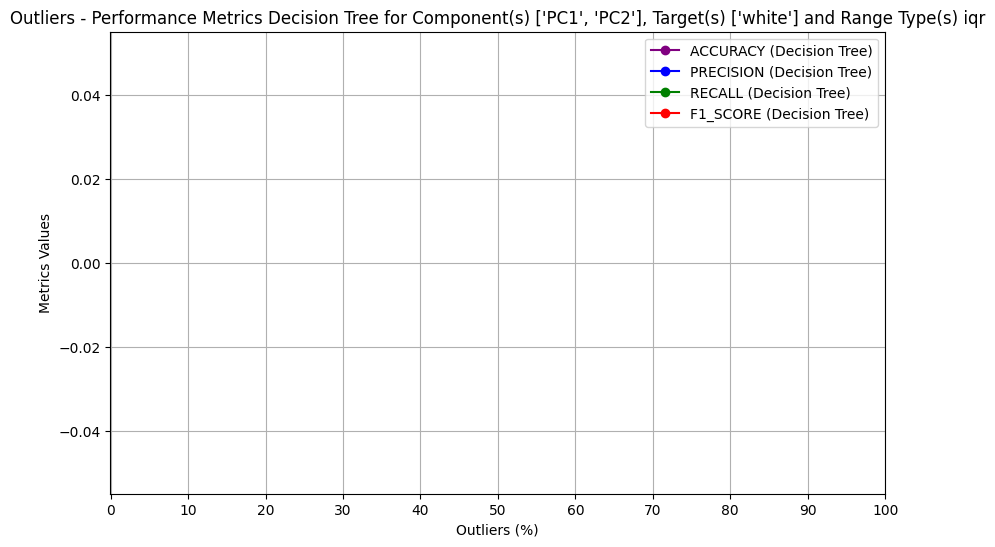

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=std


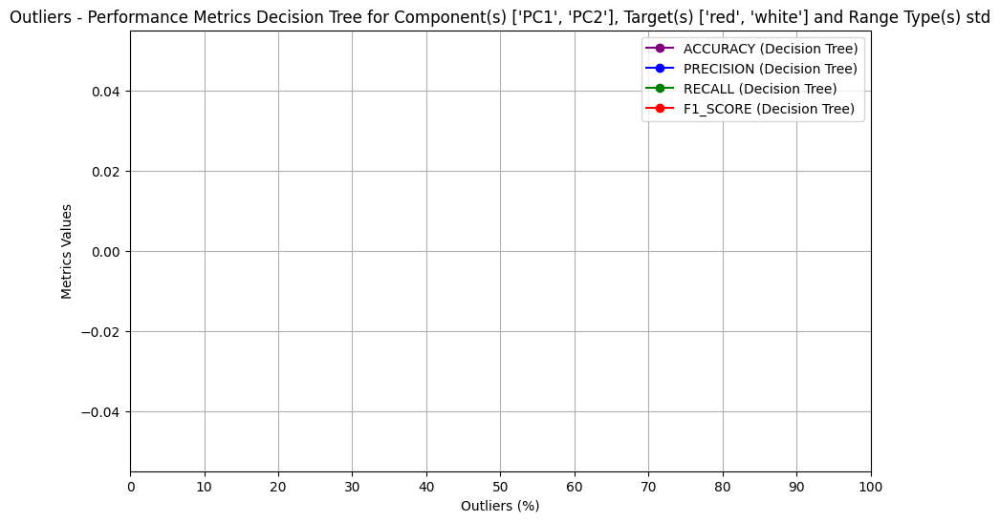

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red, range_type=iqr


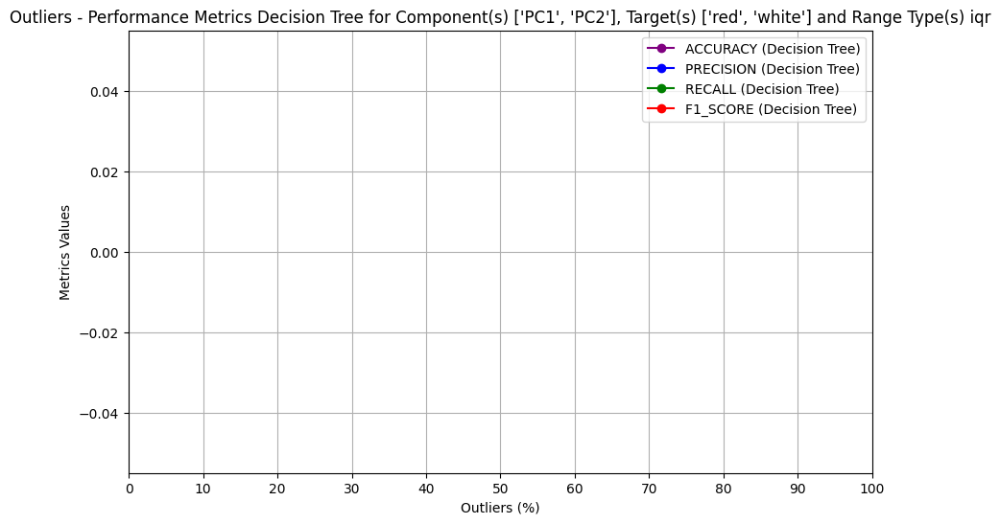

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red, range_type=std


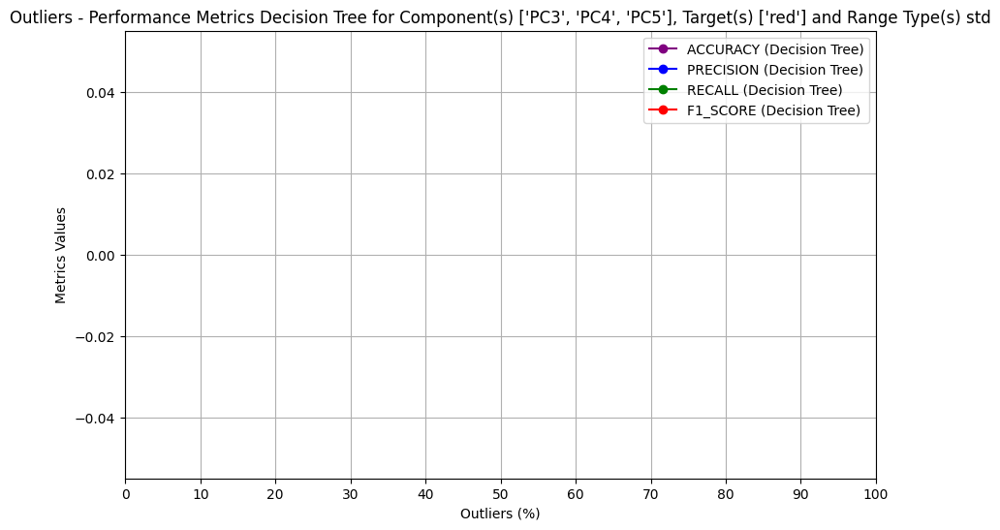

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red, range_type=iqr


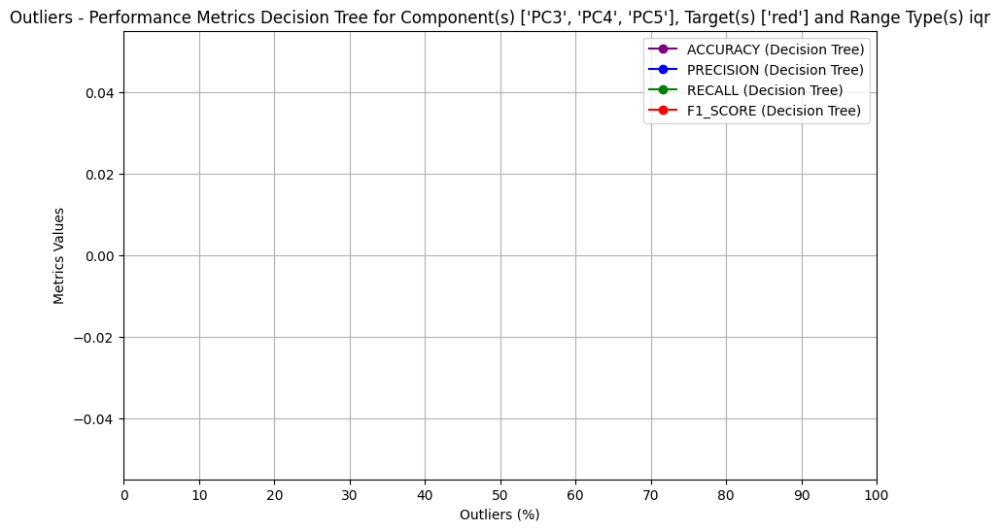

⚠️ Nessun risultato trovato per: features=PC3, wine_types=white, range_type=std


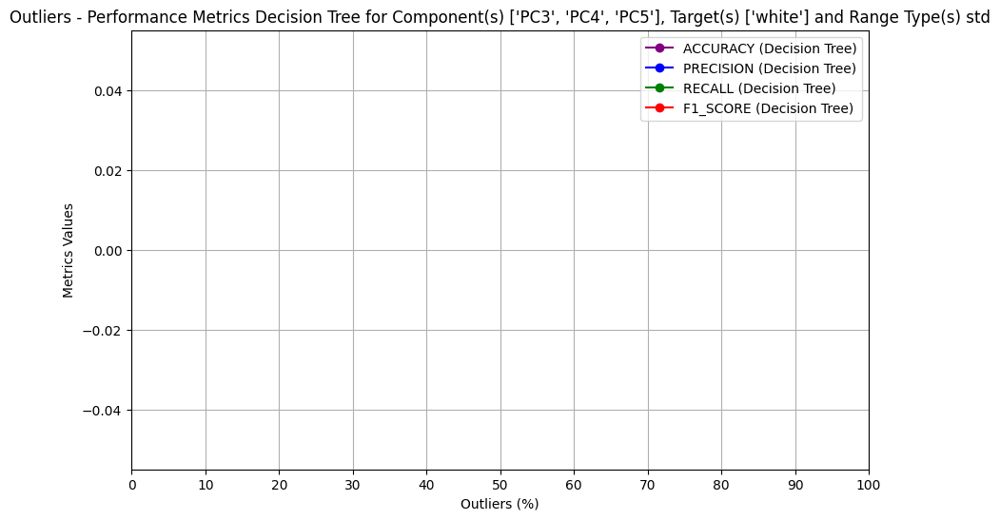

⚠️ Nessun risultato trovato per: features=PC3, wine_types=white, range_type=iqr


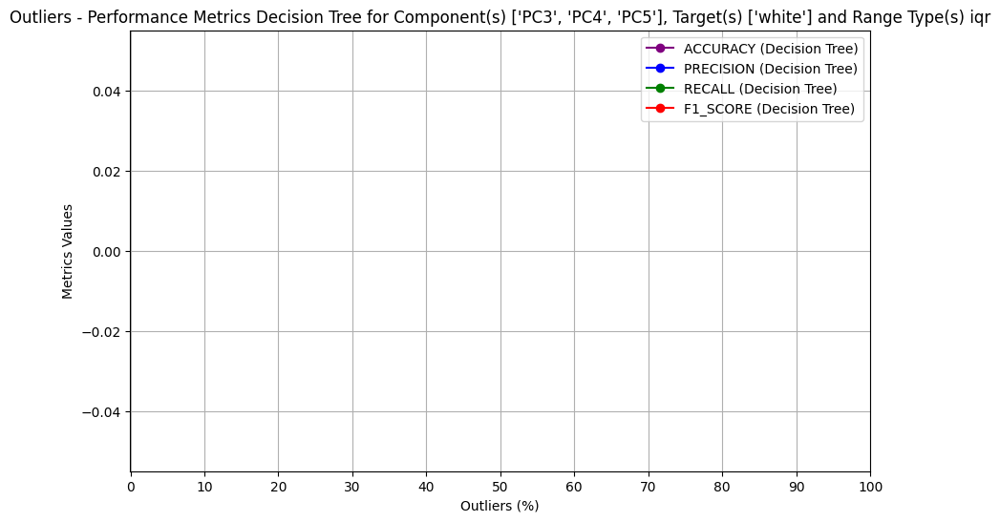

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red, range_type=std


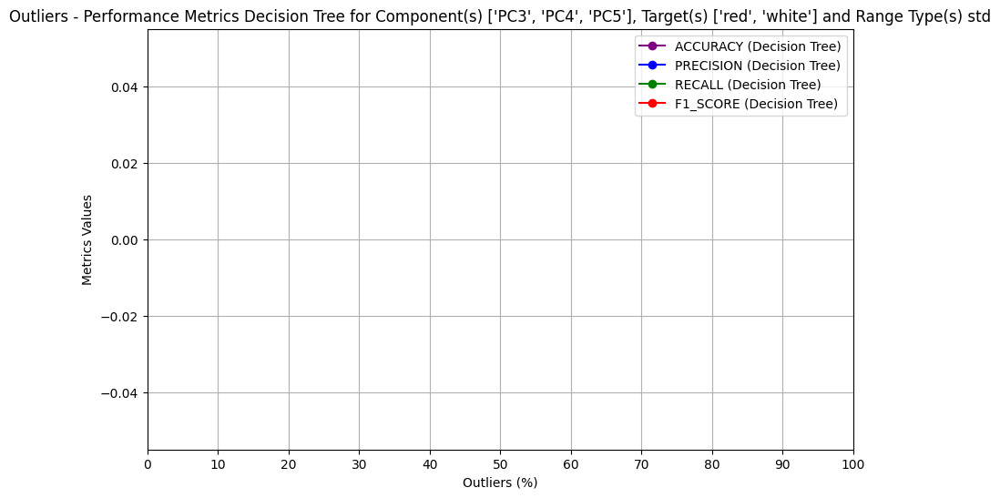

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red, range_type=iqr


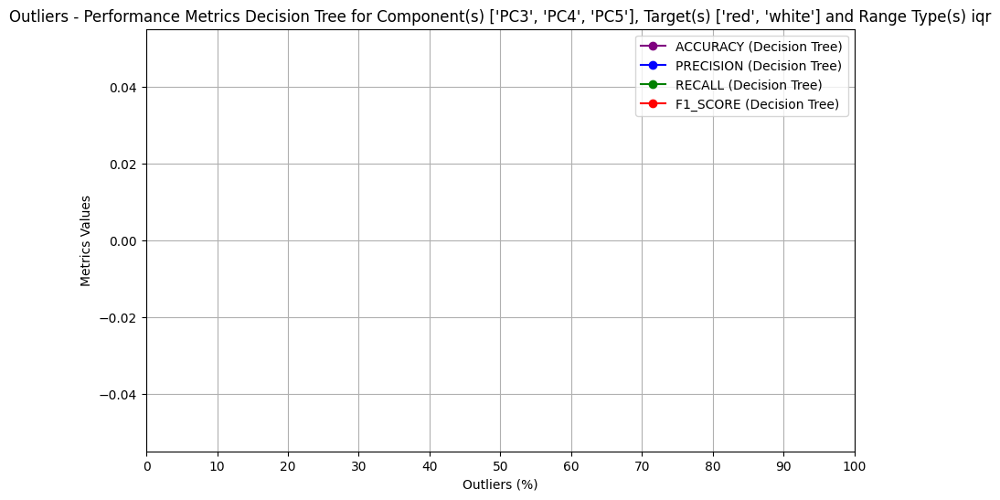

In [70]:
# Plot everything about cambia qua
for feature in features_to_consider_list:
    for wine_types in wine_types_to_consider_list:
        for range_type in range_type_to_consider_list:
            plot_outliers_graph("Decision Tree", feature, wine_types, range_type)

### Out Of Domain Values

In [71]:
# Range for Out of Domain Experiments
start_index = 354
end_index = 473  
out_of_domain = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(out_of_domain, indent=4))

[
    {
        "experiment-name": "experiment #354",
        "features-to-dirty-oodv": [
            "PC1"
        ],
        "oodv-percentage": 0.1,
        "wine-types-to-consider-oodv": [
            "red"
        ]
    },
    {
        "experiment-name": "experiment #355",
        "features-to-dirty-oodv": [
            "PC2"
        ],
        "oodv-percentage": 0.1,
        "wine-types-to-consider-oodv": [
            "red"
        ]
    },
    {
        "experiment-name": "experiment #356",
        "features-to-dirty-oodv": [
            "PC1",
            "PC2"
        ],
        "oodv-percentage": 0.1,
        "wine-types-to-consider-oodv": [
            "red"
        ]
    },
    {
        "experiment-name": "experiment #357",
        "features-to-dirty-oodv": [
            "PC3",
            "PC4",
            "PC5"
        ],
        "oodv-percentage": 0.1,
        "wine-types-to-consider-oodv": [
            "red"
        ]
    },
    {
        "experiment-name": "experim

In [72]:
def get_results_oodv(features_to_consider, wine_types_to_consider_out_of_domain_values):
    # Normalizza gli input se sono liste
    features = features_to_consider[0] if isinstance(features_to_consider, list) else features_to_consider
    wine_types = wine_types_to_consider_out_of_domain_values[0] if isinstance(wine_types_to_consider_out_of_domain_values, list) else wine_types_to_consider_out_of_domain_values

    # Filtro
    results = [
        (
            int(experiment["experiment-name"][12:]),
            experiment["oodv-percentage"],
            experiment["wine-types-to-consider-oodv"]
        )
        for experiment in out_of_domain
        if experiment["features-to-dirty-oodv"] == features and
           experiment["wine-types-to-consider-oodv"] == wine_types
    ]

    # Inserisci il "fake experiment" solo se possibile
    if len(results) >= 2:
        results.insert(0, (0, 0.0, results[1][2]))
    elif len(results) == 1:
        results.insert(0, (0, 0.0, results[0][2]))
    else:
        print(f"⚠️ Nessun risultato trovato per: features={features}, wine_types={wine_types}")
        return []

    return results

In [73]:
# Function to plot
def plot_oodv_graph(model_name_to_consider, features_to_consider, wine_types_to_consider_out_of_domain_values):
    # Get the results object
    results = get_results_oodv(features_to_consider, wine_types_to_consider_out_of_domain_values)

    # Make the graph
    plt.figure(figsize=(10, 6))

    for metric, color in metrics.items():
        # Initialize lists to collect x and y values
        x_values = []
        y_values = []

        for experiment_id, percentage, _ in results:
            # Select the correct experiment in the df of metrics
            data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

            if data.empty:
                # Experiment 0
                assert experiment_id == 0, "Something went wrong, expected experiment 0"

                # Get the data properly
                data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

                if data.empty:
                    assert False, "This was unexpected"

            # Get the metrics
            metric_value = data[metric].values[0]
            # Collect the data points
            x_values.append(percentage * 100)
            y_values.append(metric_value)
        
        # Plot all collected points and lines for the current metric
        plt.plot(x_values, y_values, marker='o', linestyle='-', color=color, label=f"{metric.upper()} ({model_name_to_consider})")
        
    plt.xlabel('Out Of Domain (%)')
    plt.ylabel('Metrics Values')
    plt.title(f'Out Of Domain - Performance Metrics {model_name_to_consider} for Component(s) {features_to_consider} and Target(s) {wine_types_to_consider_out_of_domain_values}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.xticks([10 * i for i in range(0, 11)])
    plt.show()

#### SVM

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red


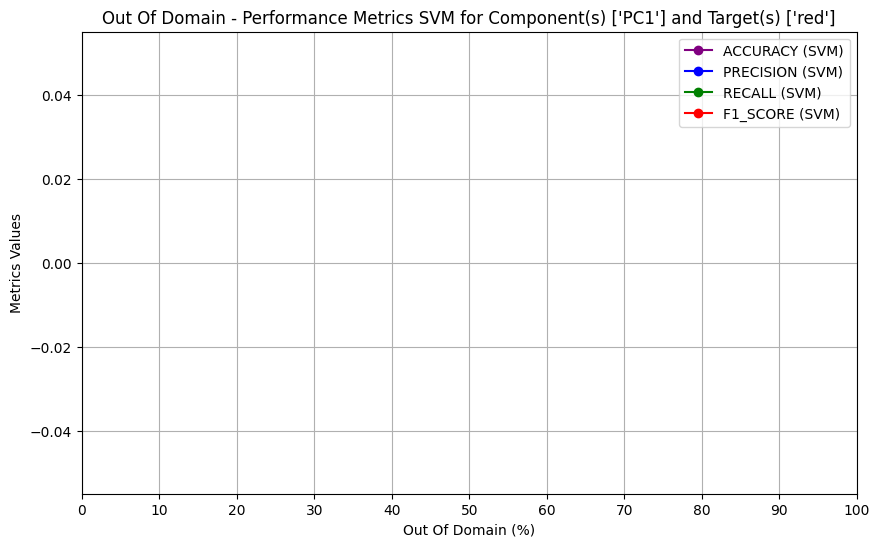

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white


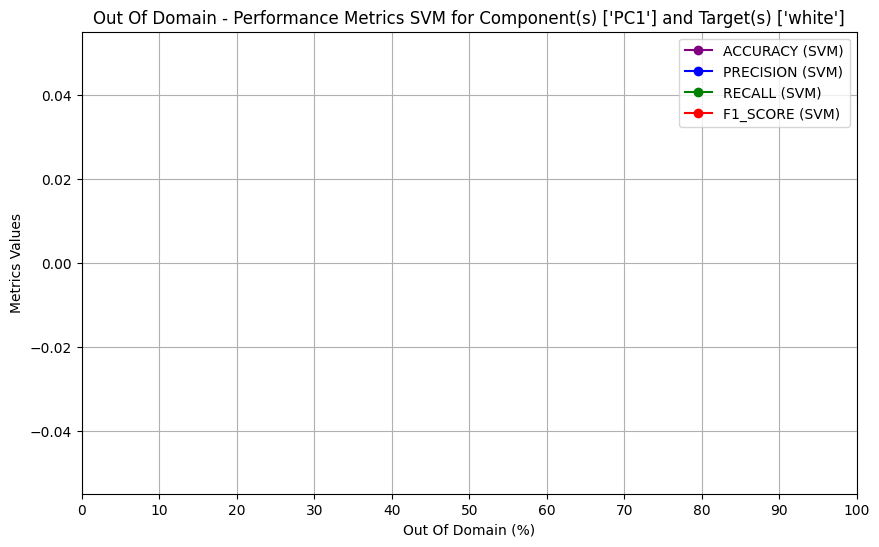

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red


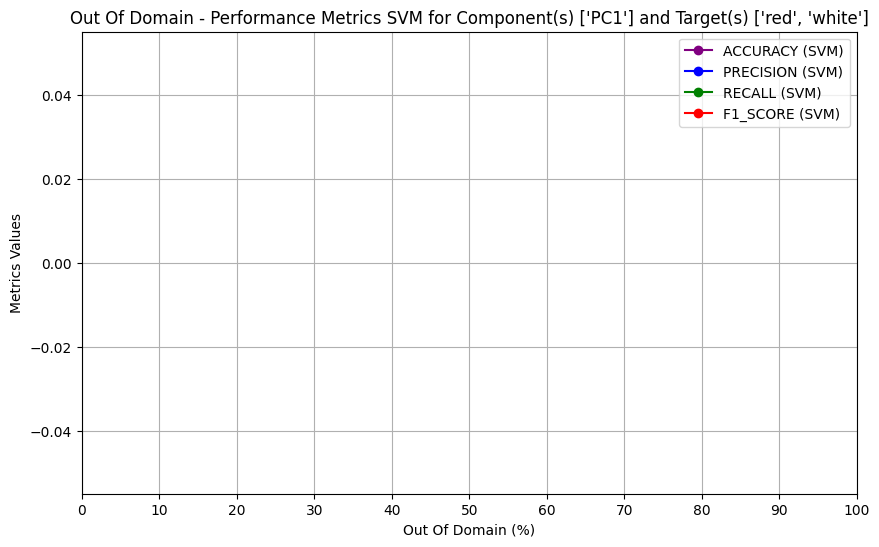

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red


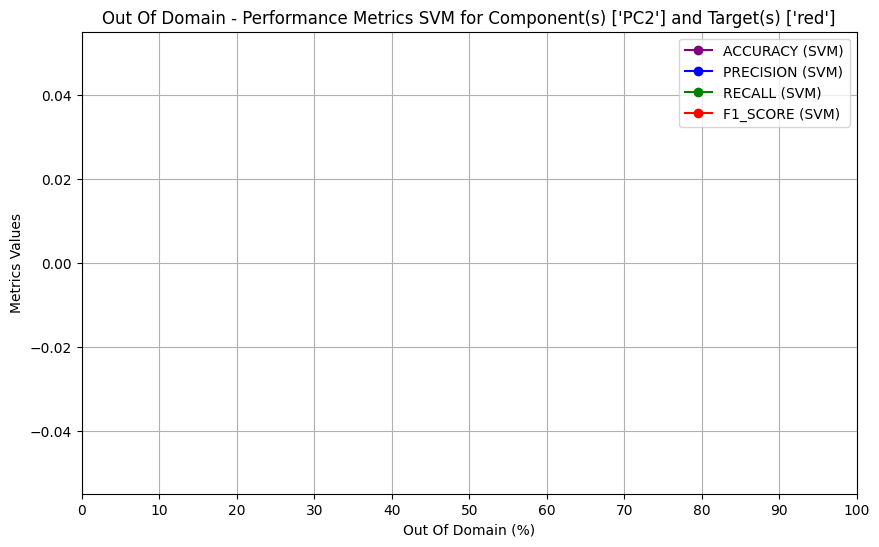

⚠️ Nessun risultato trovato per: features=PC2, wine_types=white


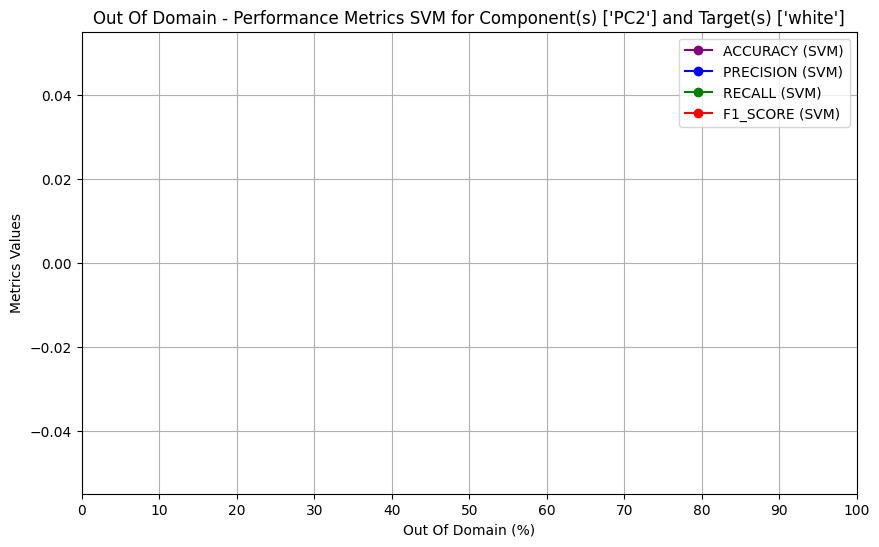

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red


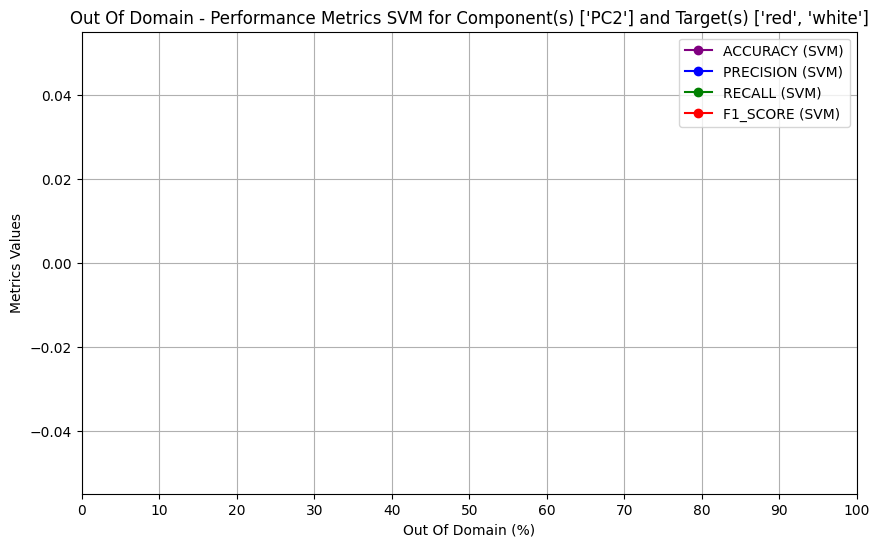

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red


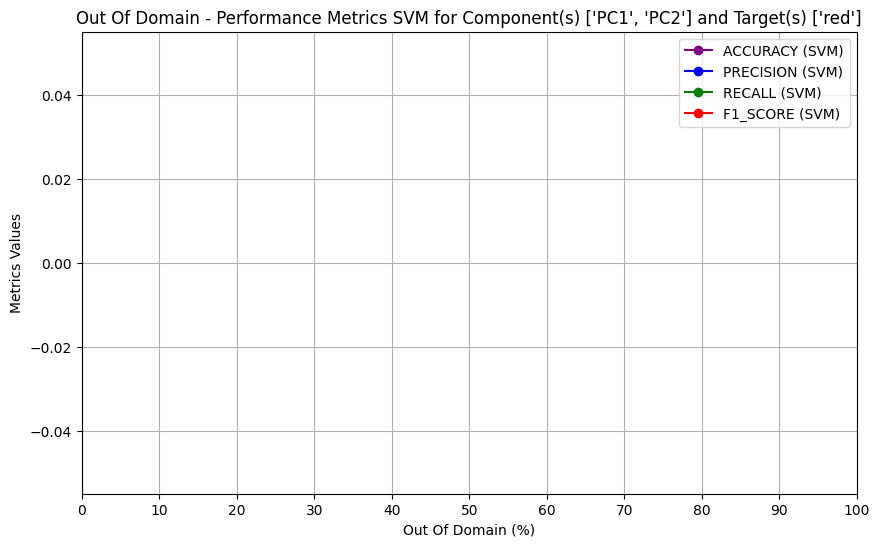

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white


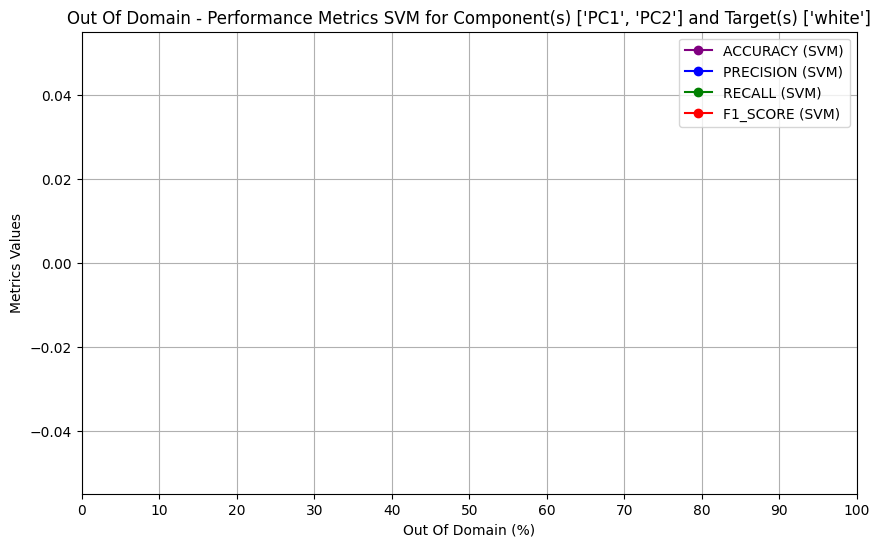

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red


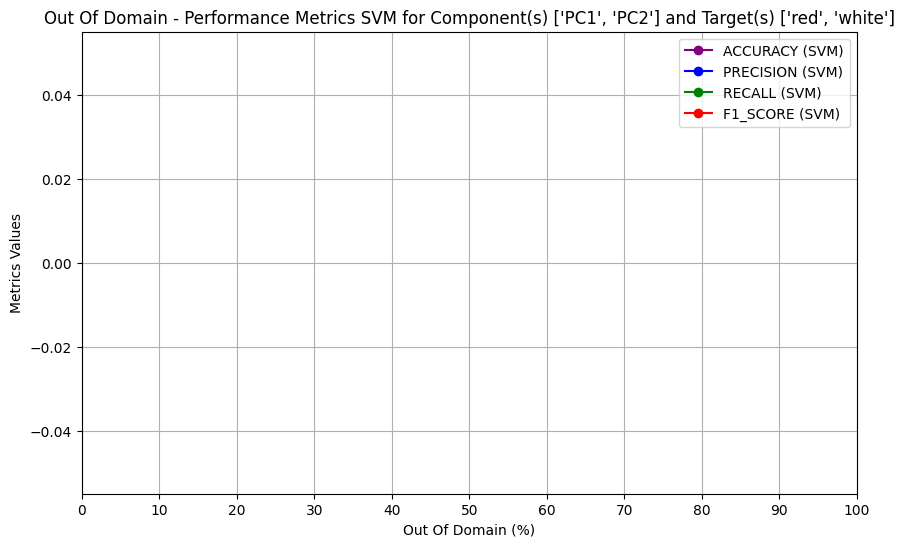

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red


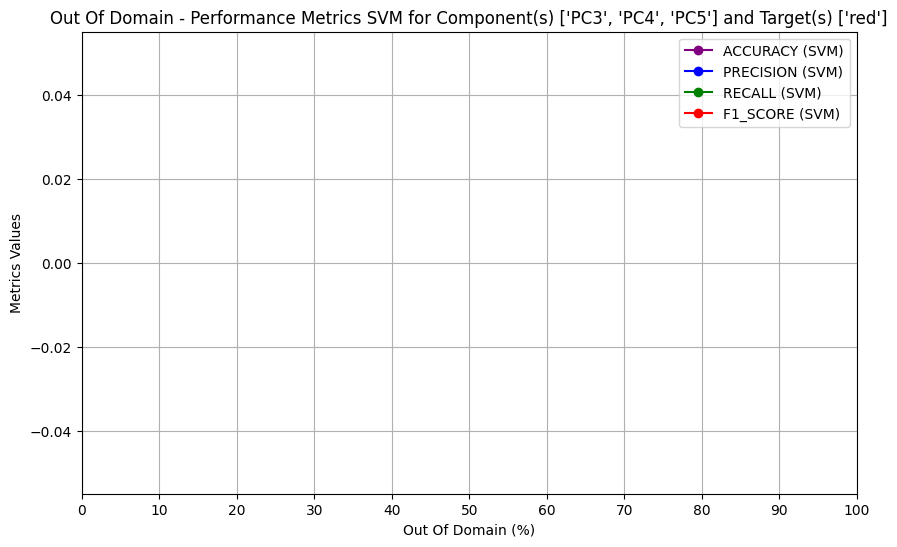

⚠️ Nessun risultato trovato per: features=PC3, wine_types=white


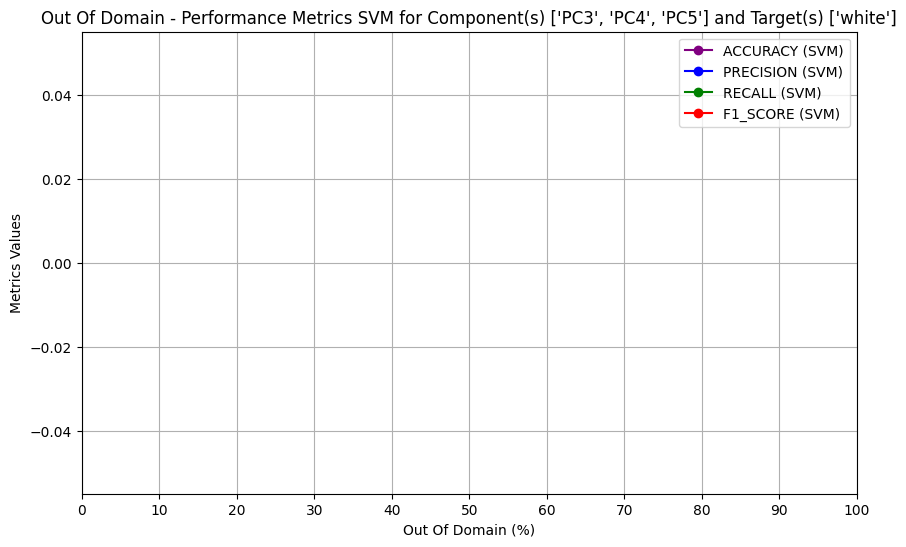

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red


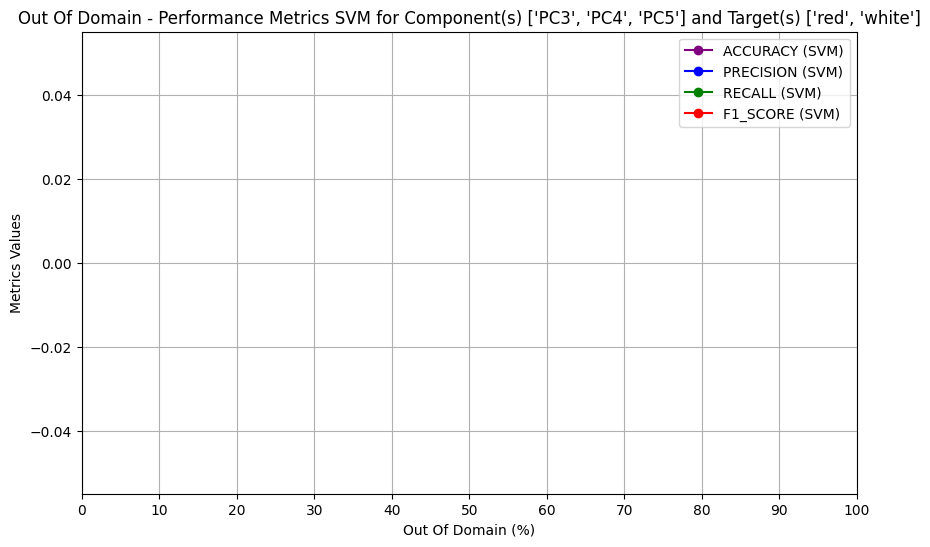

In [74]:
for feature in features_to_consider_list:
    for wine_types in wine_types_to_consider_list:
        plot_oodv_graph("SVM", feature, wine_types)

#### Decision Tree

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red


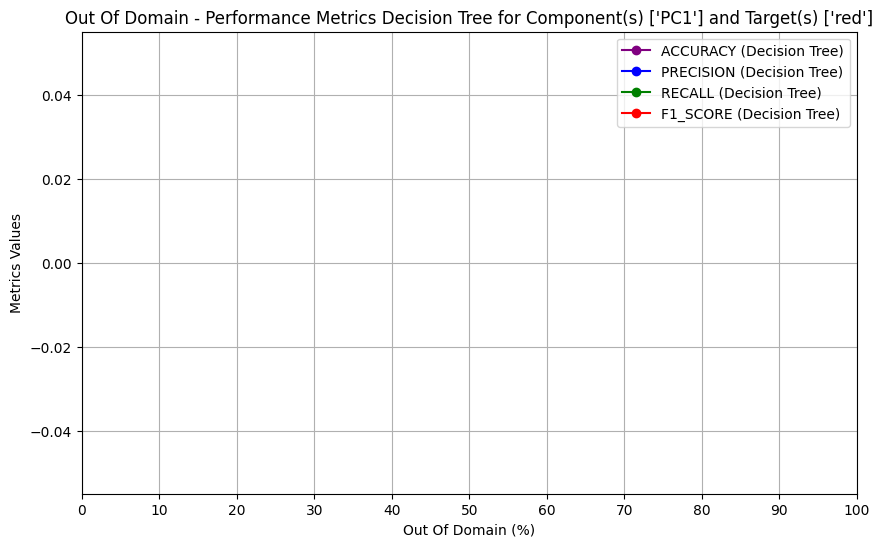

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white


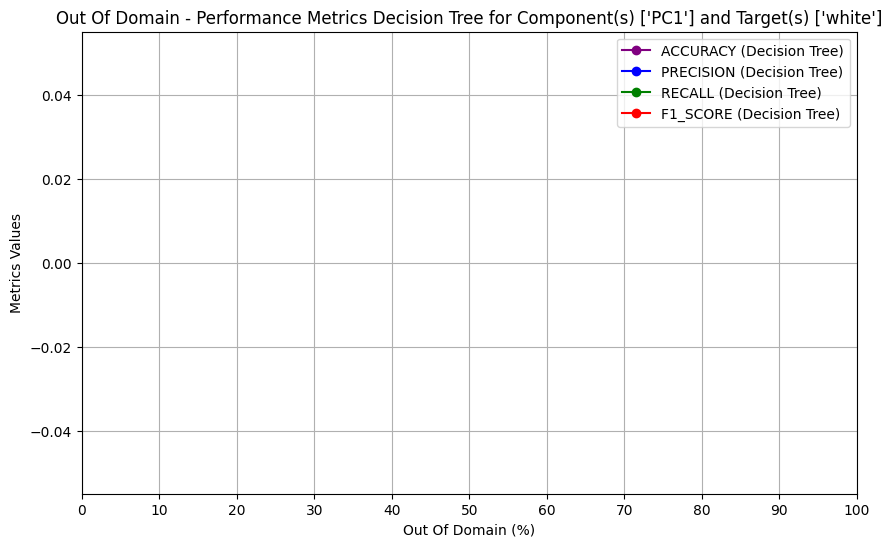

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red


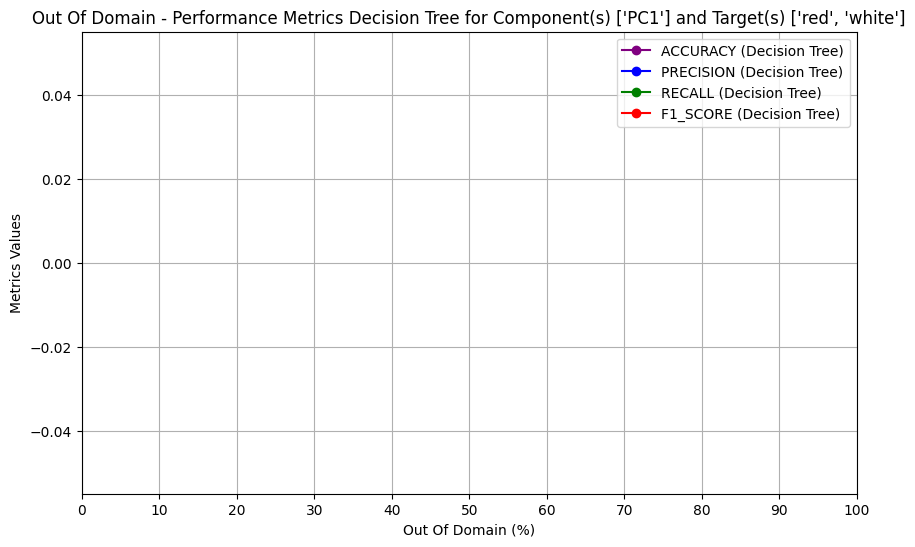

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red


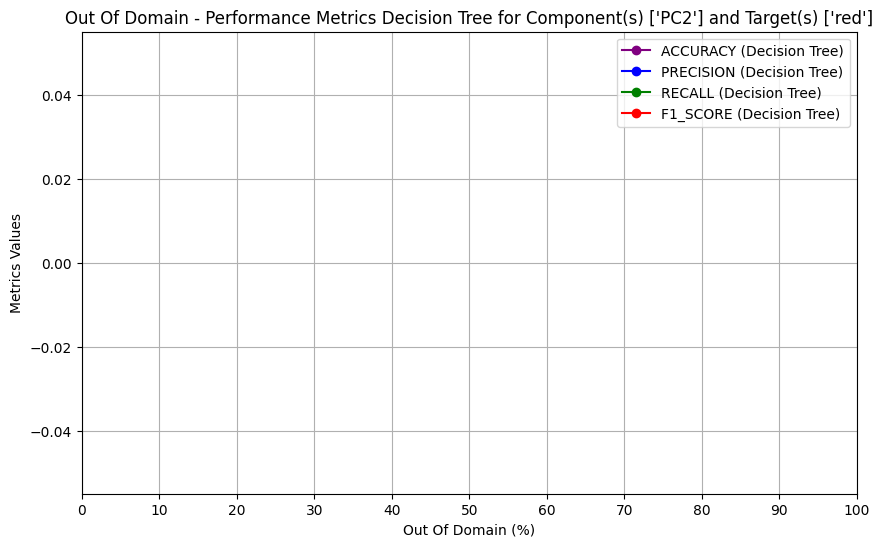

⚠️ Nessun risultato trovato per: features=PC2, wine_types=white


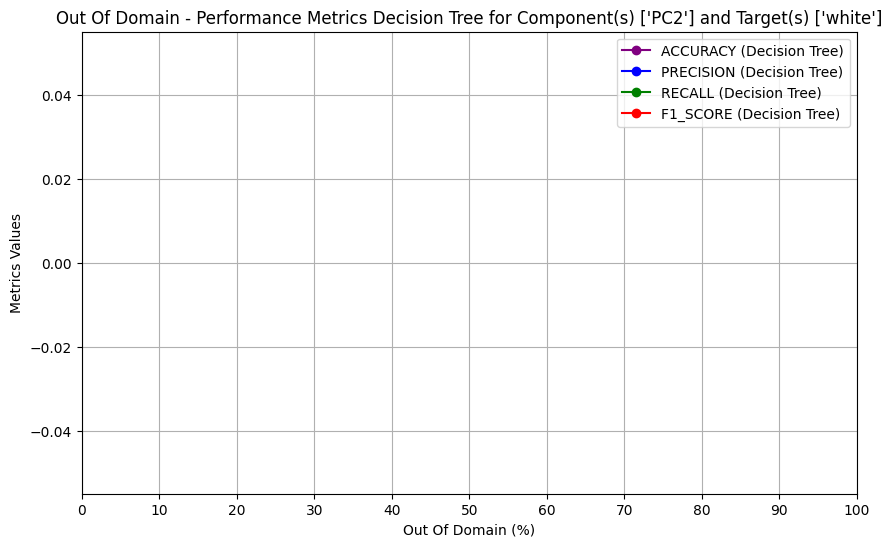

⚠️ Nessun risultato trovato per: features=PC2, wine_types=red


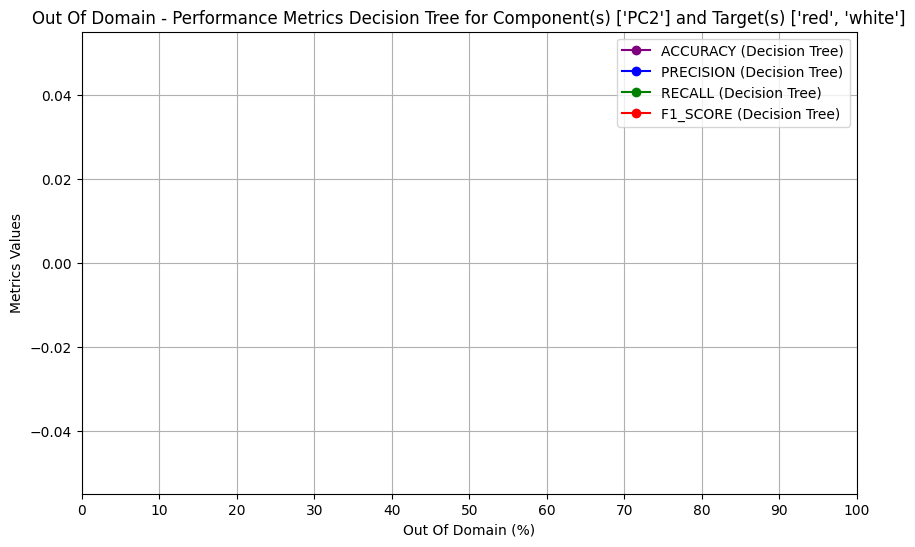

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red


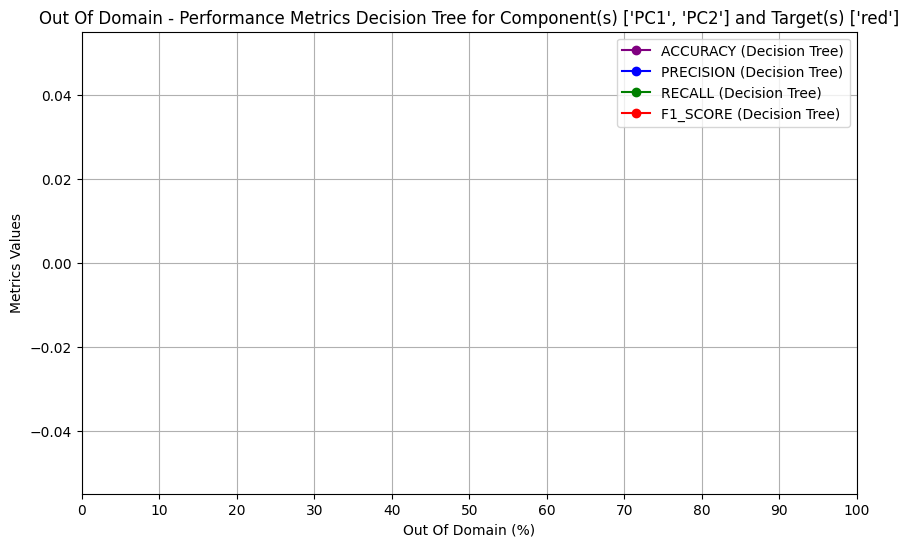

⚠️ Nessun risultato trovato per: features=PC1, wine_types=white


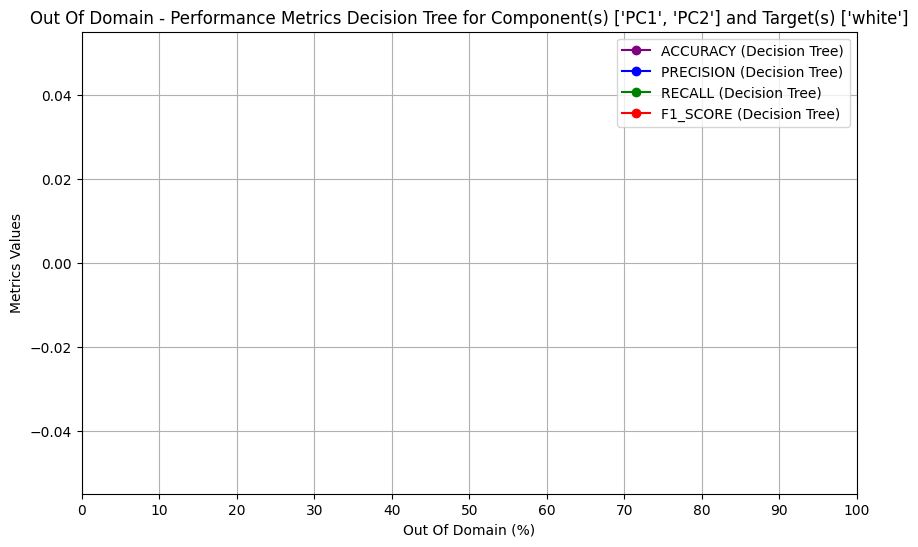

⚠️ Nessun risultato trovato per: features=PC1, wine_types=red


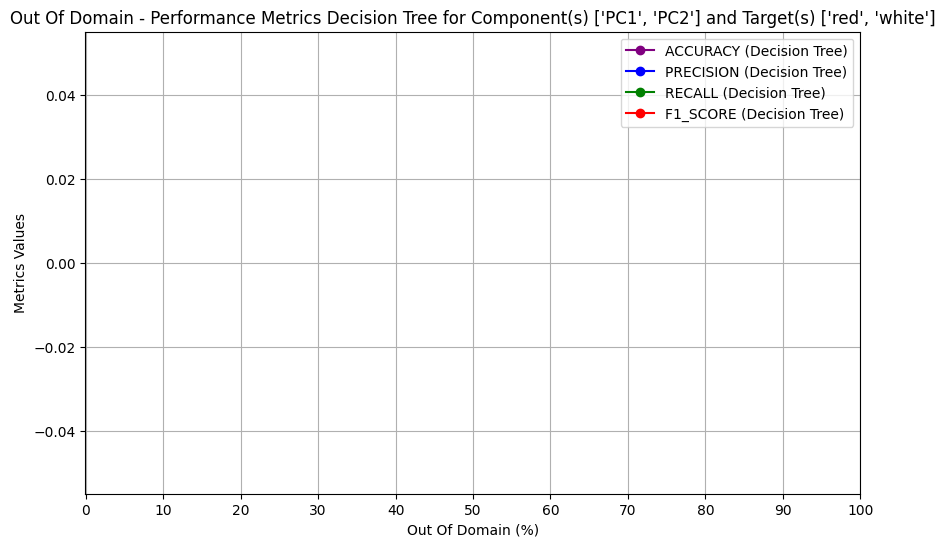

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red


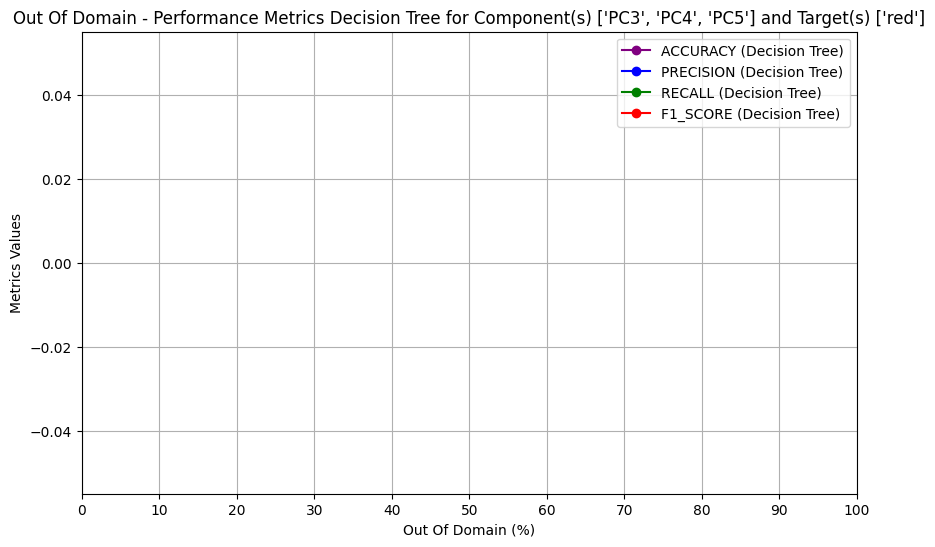

⚠️ Nessun risultato trovato per: features=PC3, wine_types=white


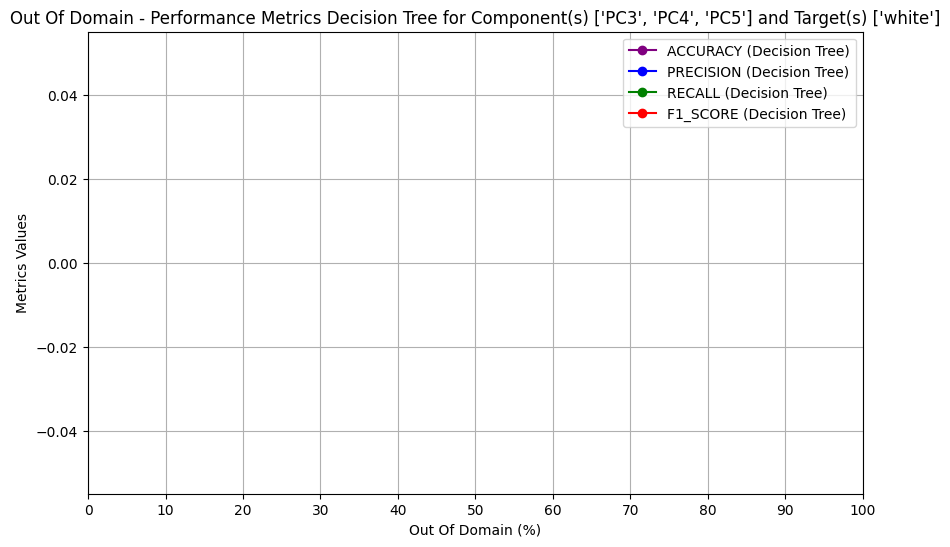

⚠️ Nessun risultato trovato per: features=PC3, wine_types=red


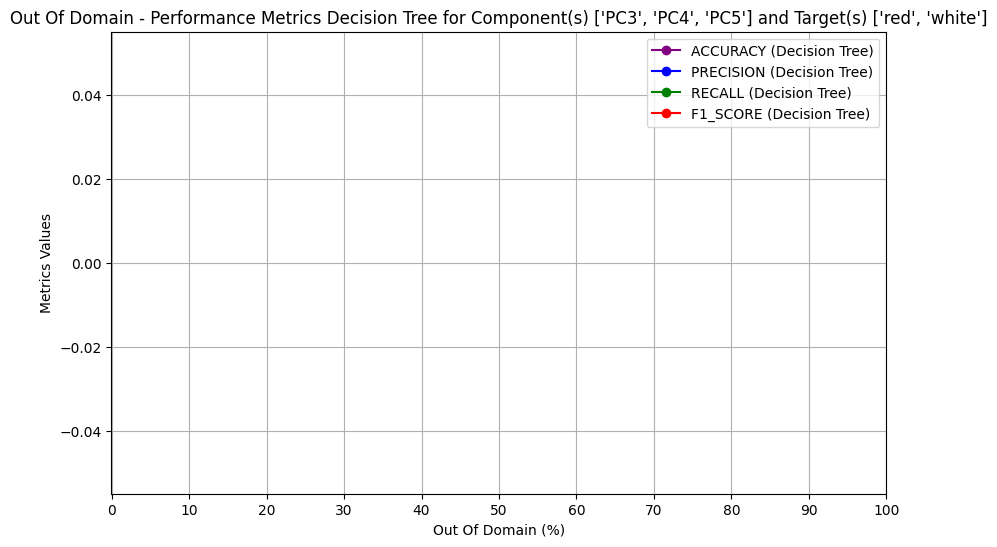

In [76]:
for feature in features_to_consider_list:
    for wine_types in wine_types_to_consider_list:
        plot_oodv_graph("Decision Tree", feature, wine_types)

### Flip Labels

In [77]:
# Range for Flip Labels Experiments
start_index = 474
end_index = 573   
flip_labels = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(flip_labels, indent=4))

[
    {
        "experiment-name": "experiment #474",
        "flip-percentage-red": 0.1,
        "flip-percentage-white": 0.1
    },
    {
        "experiment-name": "experiment #475",
        "flip-percentage-red": 0.1,
        "flip-percentage-white": 0.2
    },
    {
        "experiment-name": "experiment #476",
        "flip-percentage-red": 0.1,
        "flip-percentage-white": 0.3
    },
    {
        "experiment-name": "experiment #477",
        "flip-percentage-red": 0.1,
        "flip-percentage-white": 0.4
    },
    {
        "experiment-name": "experiment #478",
        "flip-percentage-red": 0.1,
        "flip-percentage-white": 0.5
    },
    {
        "experiment-name": "experiment #479",
        "flip-percentage-red": 0.1,
        "flip-percentage-white": 0.6
    },
    {
        "experiment-name": "experiment #480",
        "flip-percentage-red": 0.1,
        "flip-percentage-white": 0.7
    },
    {
        "experiment-name": "experiment #481",
        "flip-percenta

In [78]:
def get_results_flip_labels():
    # Get the filtered data, needed for the plots
    results = []
    for experiment in flip_labels: 
        results.append((int(experiment["experiment-name"][12:]), experiment["flip-percentage-red"], experiment["flip-percentage-white"]))
    # Insert in the first position the "fake" experiment, used for the ML pipeline metrics
    results.insert(0, (0, 0.0, 0.0))

    return results

In [79]:
def plot_flip_labels_graph(model_name_to_consider):
    # Get the results object
    results = get_results_flip_labels()

    # Make the graph
    plt.figure(figsize=(100, 60))

    for metric, color in metrics.items():
        # Initialize lists to collect x and y values
        x_values = []
        y_values = []
        x_labels = []

        for experiment_id, percentage_red, percentage_white in results:
            # Select the correct experiment in the df of metrics
            data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

            if data.empty:
                # Experiment 0
                assert experiment_id == 0, "Something went wrong, expected experiment 0"
            
                # Get the data properly
                data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]
                if data.empty:
                    assert False, "This was unexpected"

            # Get the metrics
            metric_value = data[metric].values[0]
            # Collect the data points, first type red, then white
            x_labels.append(f"{percentage_red * 100}% / {percentage_white * 100}%")
            y_values.append(metric_value)

        # Plot all collected points and lines for the current metric
        plt.plot(range(len(x_labels)), y_values, marker='o', linestyle='-', color=color, label=f"{metric.upper()} ({model_name_to_consider})")
    
    plt.xlabel('Flipped Labels (%) Red / White')
    plt.ylabel('Metrics Values')
    plt.title(f'Flip Labels - Performance Metrics {model_name_to_consider}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.xticks(range(len(x_labels)), x_labels, rotation=45, ha='right')
    plt.show()

#### SVM

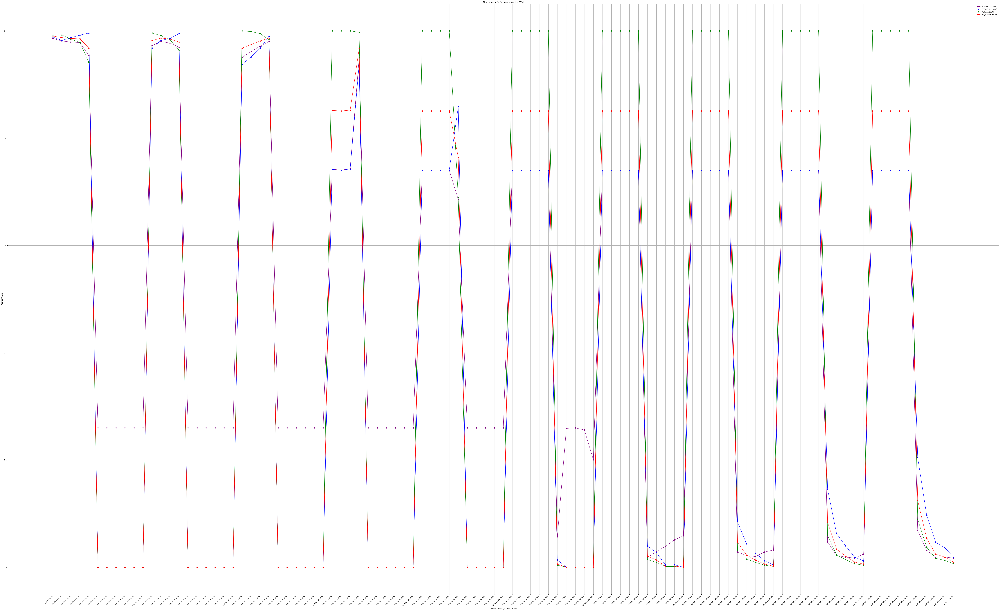

In [80]:
plot_flip_labels_graph("SVM") 

#### Decision Tree

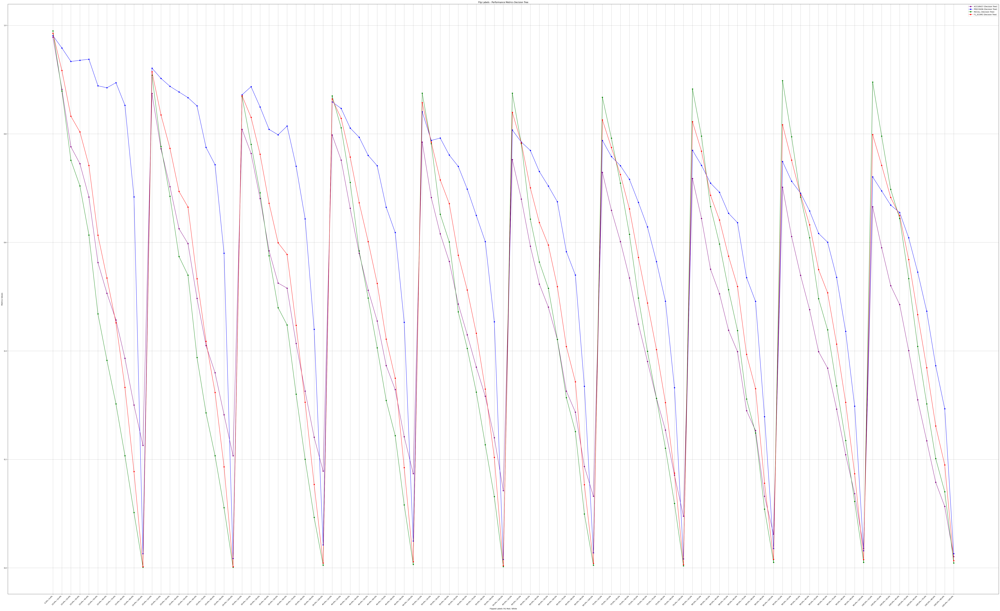

In [81]:
plot_flip_labels_graph("Decision Tree") 

### Duplicate Rows Same & Opposite Label

In [82]:
# Range for Duplicate Rows Same Label Experiments
start_index = 574
end_index = 603
duplicate_rows_same_label = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(duplicate_rows_same_label, indent=4))

# Range for Duplicate Rows Opposite Label Experiments
start_index = 604
end_index = 633
duplicate_rows_opposite_label = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(duplicate_rows_opposite_label, indent=4))

[
    {
        "experiment-name": "experiment #574",
        "wine-types-to-consider-same-label": [
            "red"
        ],
        "duplicate-rows-same-label-percentage": 0.1
    },
    {
        "experiment-name": "experiment #575",
        "wine-types-to-consider-same-label": [
            "white"
        ],
        "duplicate-rows-same-label-percentage": 0.1
    },
    {
        "experiment-name": "experiment #576",
        "wine-types-to-consider-same-label": [
            "red",
            "white"
        ],
        "duplicate-rows-same-label-percentage": 0.1
    },
    {
        "experiment-name": "experiment #577",
        "wine-types-to-consider-same-label": [
            "red"
        ],
        "duplicate-rows-same-label-percentage": 0.2
    },
    {
        "experiment-name": "experiment #578",
        "wine-types-to-consider-same-label": [
            "white"
        ],
        "duplicate-rows-same-label-percentage": 0.2
    },
    {
        "experiment-name": "expe

In [83]:
def get_results_duplicate_rows(wine_types_to_consider, flip='same'):
    # Get the filtered data, needed for the plots
    results = [(int(experiment["experiment-name"][12:]), experiment[f"duplicate-rows-{flip}-label-percentage"], experiment[f'wine-types-to-consider-{flip}-label']) 
    for experiment in (duplicate_rows_same_label if flip=='same' else duplicate_rows_opposite_label) 
    if experiment[f'wine-types-to-consider-{flip}-label'] == wine_types_to_consider]

    # Insert in the first position the "fake" experiment, used for the ML pipeline metrics
    results.insert(0, (0, 0.0, []))

    return results

In [84]:
# Function to plot
def plot_duplicate_rows_graph(model_name_to_consider, wine_types_to_consider, flip='same'):
    # Get the results object
    results = get_results_duplicate_rows(wine_types_to_consider, flip)

    # Make the graph
    plt.figure(figsize=(10, 6))

    for metric, color in metrics.items():
        # Initialize lists to collect x and y values
        x_values = []
        y_values = []

        for experiment_id, missing_values_percentage, _ in results:
            # Select the correct experiment in the df of metrics
            data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

            if data.empty:
                # Experiment 0 
                assert experiment_id == 0, "Something went wrong, expected experiment 0"
                # Get the data properly
                data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

                if data.empty:
                    assert False, "This was unexpected"

            # Get the metrics
            metric_value = data[metric].values[0]
            # Collect the data points
            x_values.append(missing_values_percentage * 100)
            y_values.append(metric_value)
        
        # Plot all collected points and lines for the current metric
        plt.plot(x_values, y_values, marker='o', linestyle='-', color=color, label=f"{metric.upper()} ({model_name_to_consider})")
        
    plt.xlabel(f'Duplicated Rows With {flip.capitalize()} Label (%)')
    plt.ylabel('Metrics Values')
    plt.title(f'Duplicate Rows {flip.capitalize()} Label - Performance Metrics {model_name_to_consider} for Target(s) {wine_types_to_consider}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.xticks([10 * i for i in range(1, 11)])
    plt.show()

#### SVM

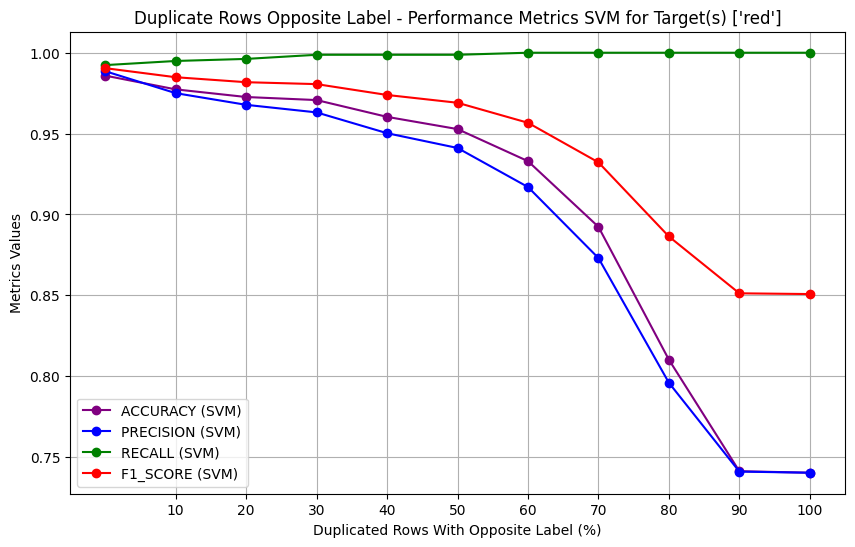

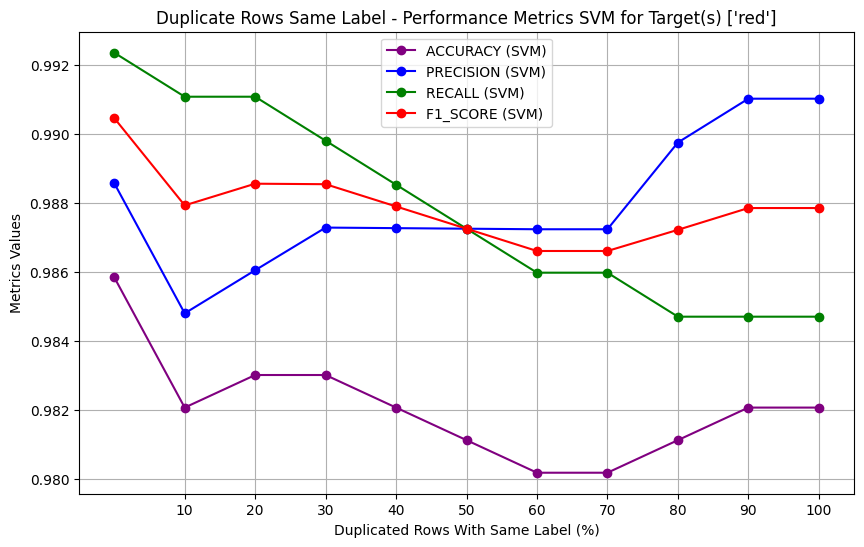

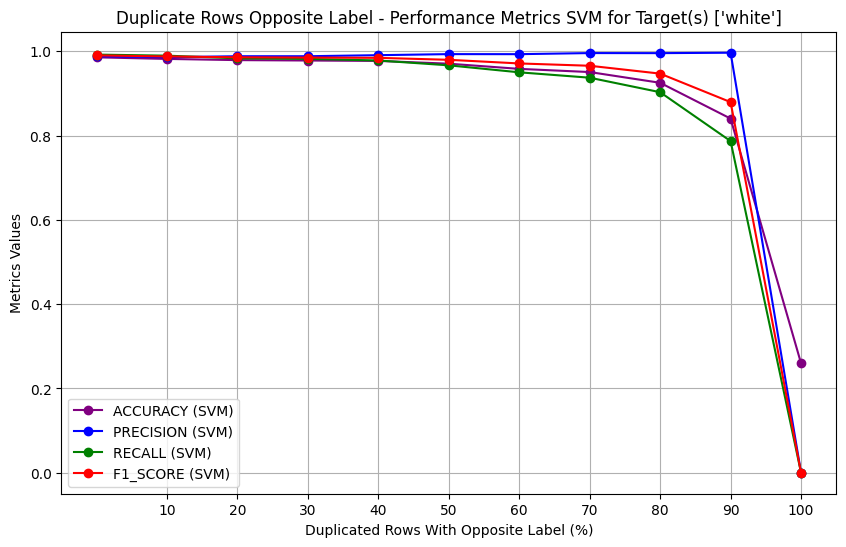

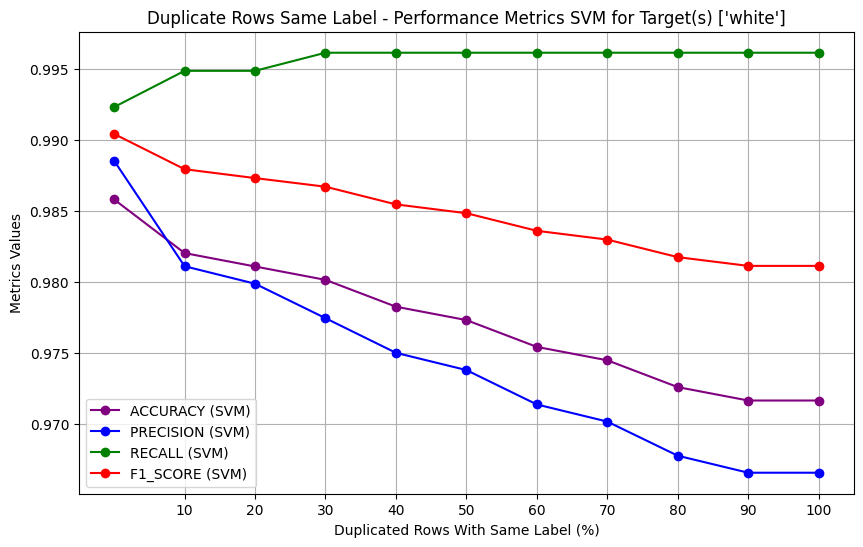

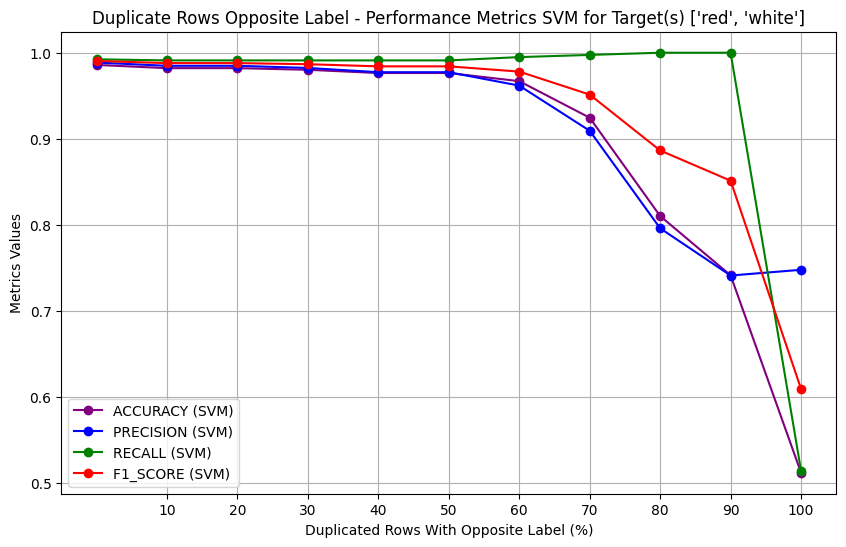

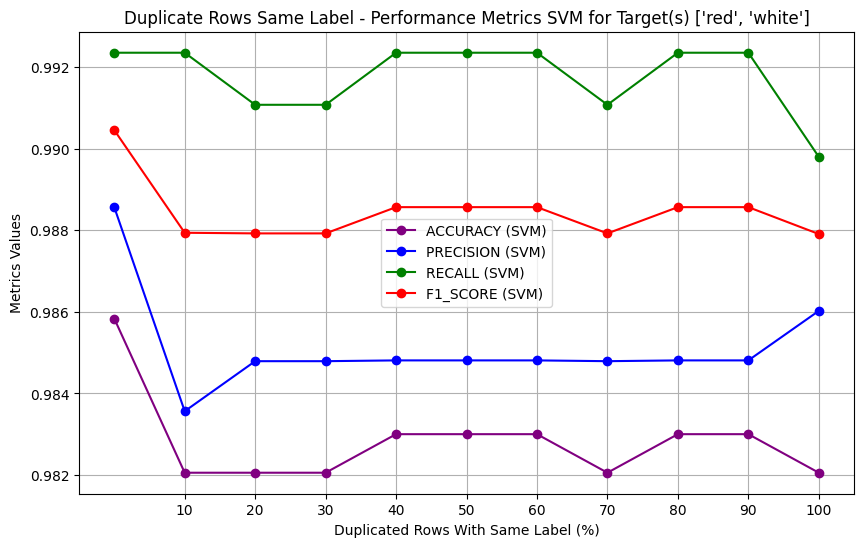

In [85]:
# Plot everything about SVM       
flips = ['opposite', 'same']
for wine_type in wine_types_to_consider_list:
    for flip in flips:
        plot_duplicate_rows_graph('SVM', wine_type, flip)

#### Decision Tree

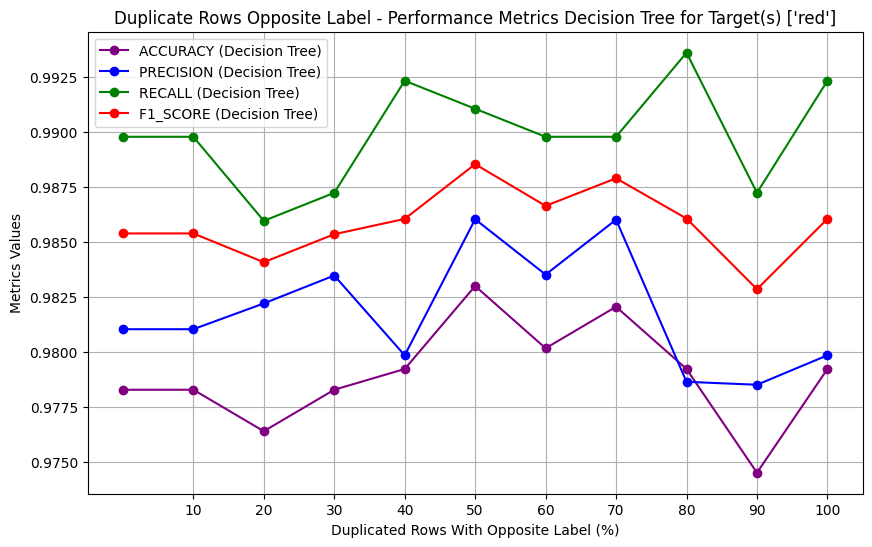

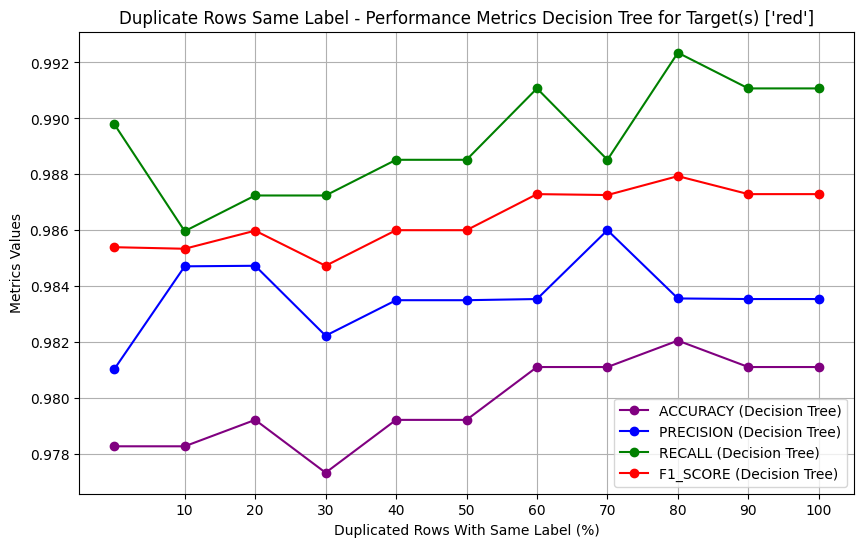

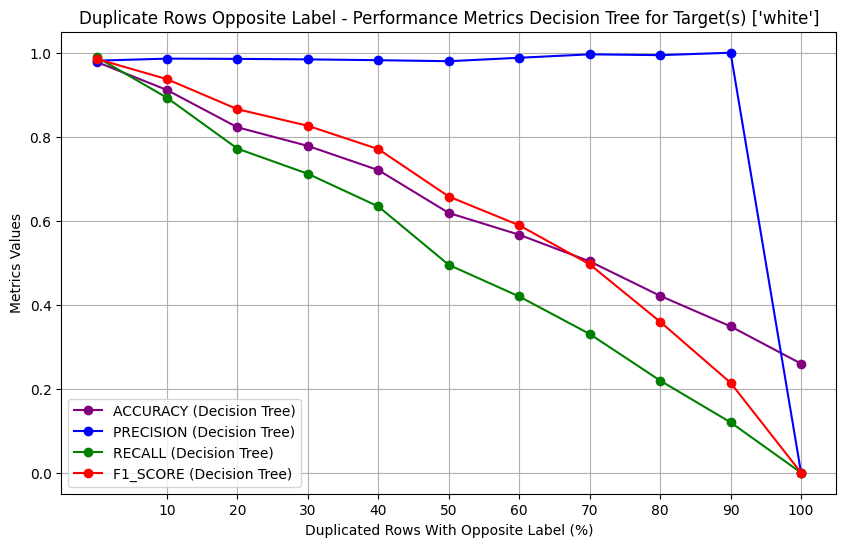

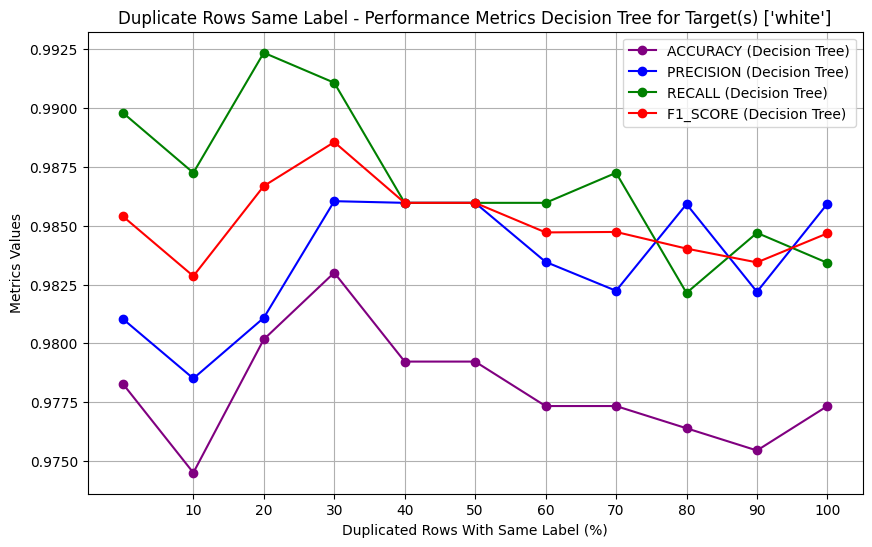

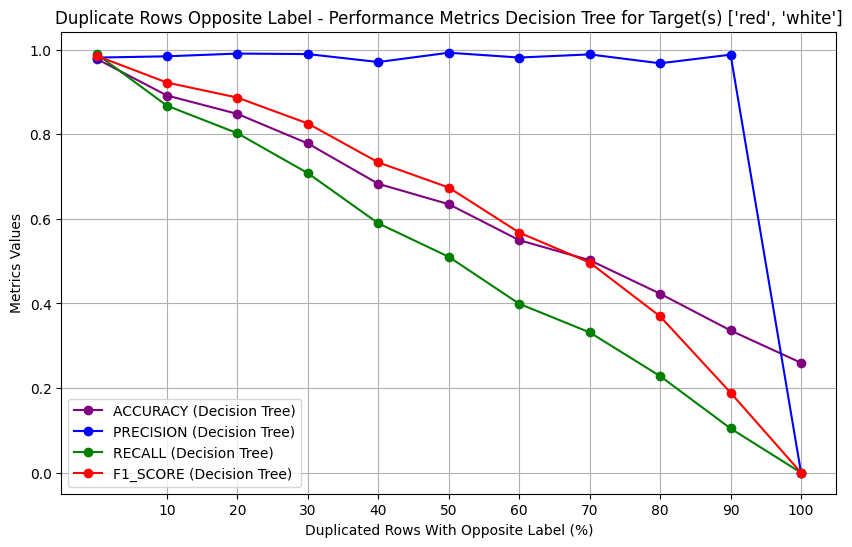

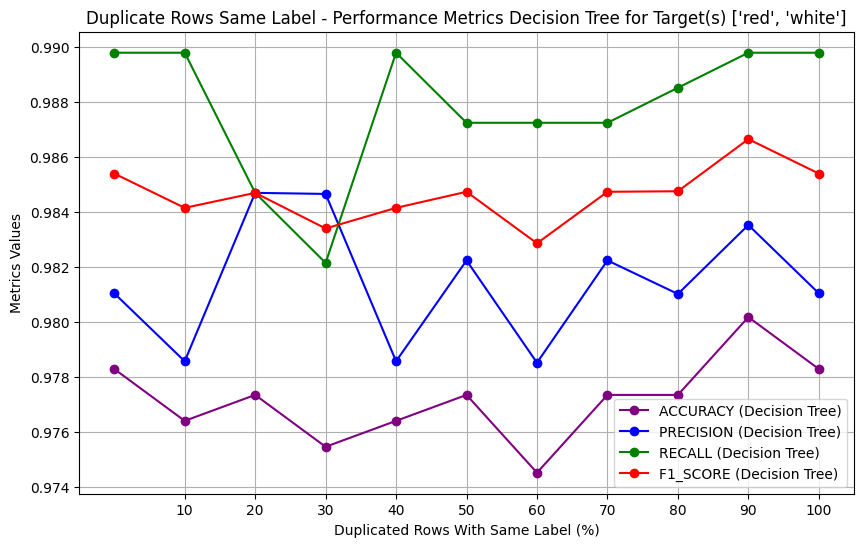

In [86]:
# Plot everything about DTC         
for wine_type in wine_types_to_consider_list:
    for flip in flips:
        plot_duplicate_rows_graph('Decision Tree', wine_type, flip)

### Add Rows Random

In [87]:
# Range for Add Rows Random Experiments
start_index = 634
end_index = 643 
add_rows_random = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(add_rows_random, indent=4))

[
    {
        "experiment-name": "experiment #634",
        "add-rows-random-percentage": 0.1
    },
    {
        "experiment-name": "experiment #635",
        "add-rows-random-percentage": 0.2
    },
    {
        "experiment-name": "experiment #636",
        "add-rows-random-percentage": 0.3
    },
    {
        "experiment-name": "experiment #637",
        "add-rows-random-percentage": 0.4
    },
    {
        "experiment-name": "experiment #638",
        "add-rows-random-percentage": 0.5
    },
    {
        "experiment-name": "experiment #639",
        "add-rows-random-percentage": 0.6
    },
    {
        "experiment-name": "experiment #640",
        "add-rows-random-percentage": 0.7
    },
    {
        "experiment-name": "experiment #641",
        "add-rows-random-percentage": 0.8
    },
    {
        "experiment-name": "experiment #642",
        "add-rows-random-percentage": 0.9
    },
    {
        "experiment-name": "experiment #643",
        "add-rows-random-percentage":

In [88]:
def get_results_rows_random():
    # Get the filtered data, needed for the plots
    results = [(int(experiment["experiment-name"][12:]), experiment["add-rows-random-percentage"]) 
    for experiment in add_rows_random]

    # Insert in the first position the "fake" experiment, used for the ML pipeline metrics
    results.insert(0, (0, 0.0))

    return results

In [89]:
# Function to plot
def plot_rows_random_graph(model_name_to_consider):
    # Get the results object
    results = get_results_rows_random()

    # Make the graph
    plt.figure(figsize=(10, 6))

    for metric, color in metrics.items():
        # Initialize lists to collect x and y values
        x_values = []
        y_values = []

        for experiment_id, percentage, in results:
            # Select the correct experiment in the df of metrics
            data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

            if data.empty:
                # Experiment 0
                assert experiment_id == 0, "Something went wrong, expected experiment 0"

                # Get the data properly
                data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

                if data.empty:
                    assert False, "This was unexpected"

            # Get the metrics
            metric_value = data[metric].values[0]
            # Collect the data points
            x_values.append(percentage * 100)
            y_values.append(metric_value)
        
        # Plot all collected points and lines for the current metric
        plt.plot(x_values, y_values, marker='o', linestyle='-', color=color, label=f"{metric.upper()} ({model_name_to_consider})")
        
    plt.xlabel('Added Rows Random (%)')
    plt.ylabel('Metrics Values')
    plt.title(f'Add Rows Random - Performance Metrics {model_name_to_consider}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.xticks([10 * i for i in range(0, 11)])
    plt.show()

#### SVM

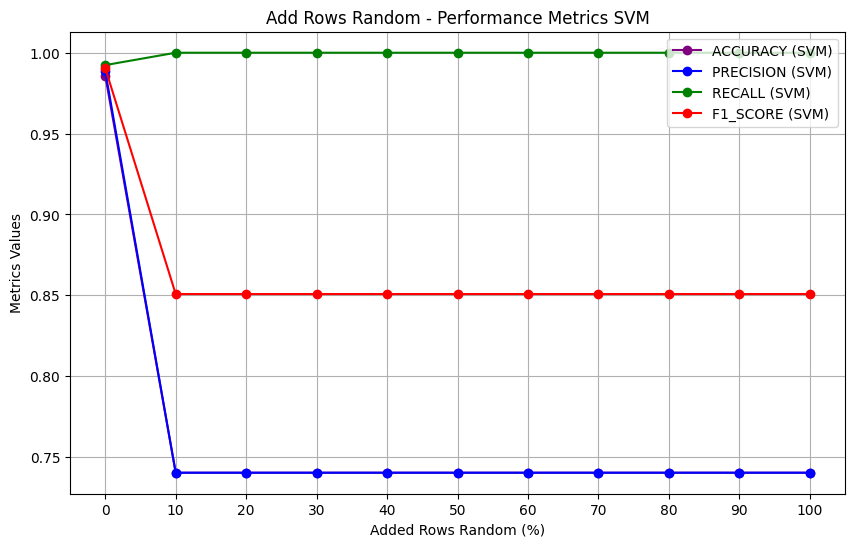

In [90]:
plot_rows_random_graph("SVM")

#### Decision Tree

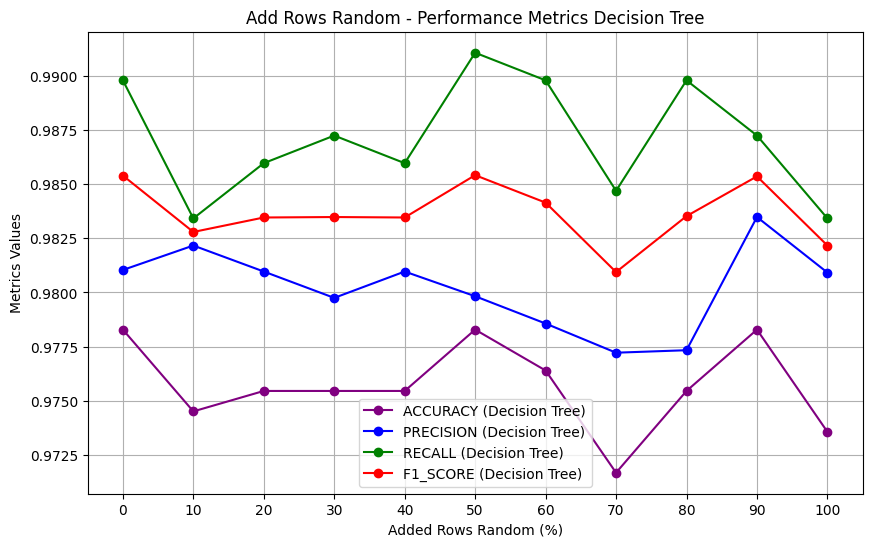

In [91]:
plot_rows_random_graph("Decision Tree")

### Add Rows Domain

In [92]:
# Range for Add Rows Domain Experiments
start_index = 644
end_index = 653   
add_rows_domain = get_experiment_parameters('../experiments_pipeline/experiments_config.json', start_index, end_index)
# Print the data to verify if it's correct
print(json.dumps(add_rows_domain, indent=4))

[
    {
        "experiment-name": "experiment #644",
        "add-rows-domain-percentage": 0.1
    },
    {
        "experiment-name": "experiment #645",
        "add-rows-domain-percentage": 0.2
    },
    {
        "experiment-name": "experiment #646",
        "add-rows-domain-percentage": 0.3
    },
    {
        "experiment-name": "experiment #647",
        "add-rows-domain-percentage": 0.4
    },
    {
        "experiment-name": "experiment #648",
        "add-rows-domain-percentage": 0.5
    },
    {
        "experiment-name": "experiment #649",
        "add-rows-domain-percentage": 0.6
    },
    {
        "experiment-name": "experiment #650",
        "add-rows-domain-percentage": 0.7
    },
    {
        "experiment-name": "experiment #651",
        "add-rows-domain-percentage": 0.8
    },
    {
        "experiment-name": "experiment #652",
        "add-rows-domain-percentage": 0.9
    },
    {
        "experiment-name": "experiment #653",
        "add-rows-domain-percentage":

In [93]:
def get_results_add_rows_domain():
     # Get the filtered data, needed for the plots
    results = []
    for experiment in add_rows_domain: 
        results.append((int(experiment["experiment-name"][12:]), experiment["add-rows-domain-percentage"]))
    # Insert in the first position the "fake" experiment, used for the ML pipeline metrics
    results.insert(0, (0, 0.0))

    return results

In [94]:
# Function to plot
def plot_add_rows_domain_graph(model_name_to_consider):
    # Get the results object
    results = get_results_add_rows_domain()

    # Make the graph
    plt.figure(figsize=(10, 6))

    for metric, color in metrics.items():
        # Initialize lists to collect x and y values
        x_values = []
        y_values = []

        for experiment_id, percentage in results:
            # Select the correct experiment in the df of metrics
            data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]

            if data.empty:
                # Experiment 0
                assert experiment_id == 0, "Something went wrong, expected experiment 0"
            
                # Get the data properly
                data = df[(df['experiment_id'] == experiment_id) & (df['model_name'] == model_name_to_consider)]
                if data.empty:
                    assert False, "This was unexpected"

            # Get the metrics
            metric_value = data[metric].values[0]
            # Collect the data points
            x_values.append(percentage * 100)
            y_values.append(metric_value)
        # Plot all collected points and lines for the current metric
        plt.plot(x_values, y_values, marker='o', linestyle='-', color=color, label=f"{metric.upper()} ({model_name_to_consider})")
    
    plt.xlabel('Added Rows Domain (%)')
    plt.ylabel('Metrics Values')
    plt.title(f'Add Rows Domain - Performance Metrics {model_name_to_consider}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.xticks([10 * i for i in range(0, 11)])
    plt.show()

#### SVM

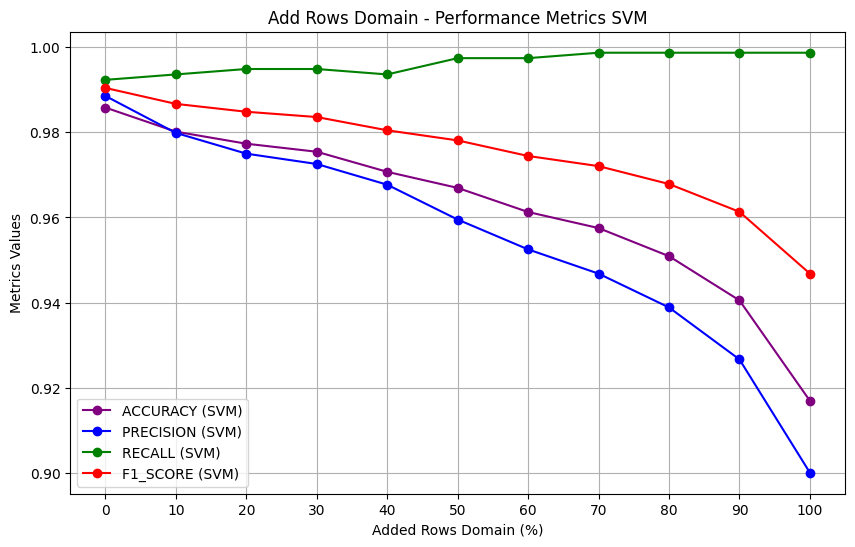

In [95]:
plot_add_rows_domain_graph("SVM")

#### Decision Tree

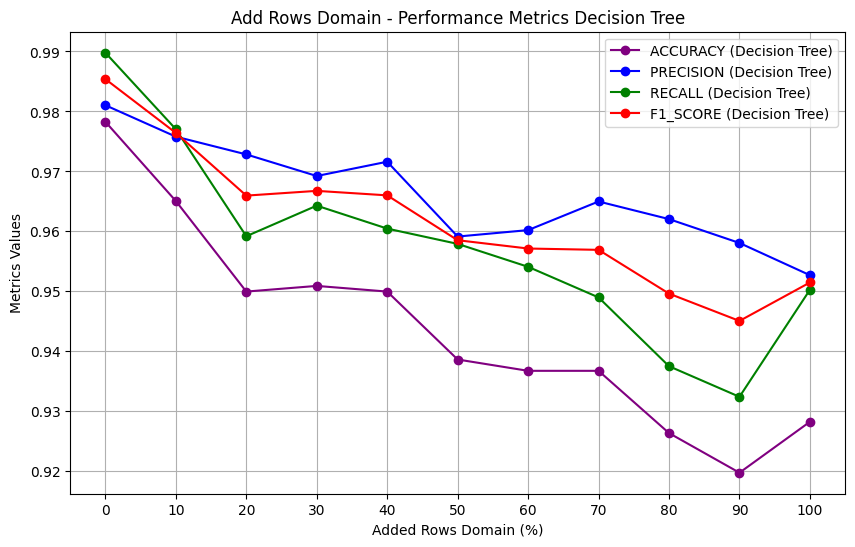

In [96]:
plot_add_rows_domain_graph("Decision Tree")

## Correlations

In [97]:
# Reason why we can't compare Decision Tree
df_original['model_name'].value_counts()

Decision Tree    659
SVM              547
SVM (mean)       112
SVM (EM)         112
Name: model_name, dtype: int64

### Correlations SVM (mean) vs SVM (EM)

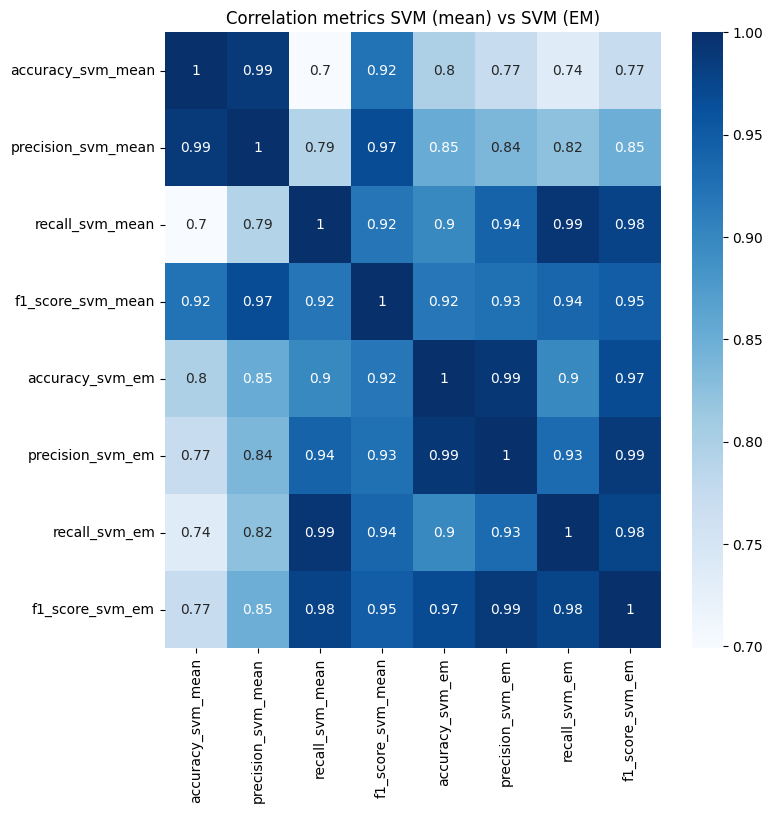

In [98]:
# Create dictionary containing the data
metrics_svm_svm = {}

for model in ['SVM (mean)', 'SVM (EM)']:
    model_name_short = 'svm_mean' if model == 'SVM (mean)' else 'svm_em'
    for metric in ['accuracy', 'precision', 'recall', 'f1_score']:
        metrics_svm_svm[f"{metric}_{model_name_short}"] = sub_df_dict[model][metric].reset_index(drop=True)

# Convert to DataFrame
metrics_svm_svm = pd.DataFrame(metrics_svm_svm)

# Plot the correlations
plt.figure(figsize=(8,8))
plt.title("Correlation metrics SVM (mean) vs SVM (EM)")
sns.heatmap(metrics_svm_svm.corr(), annot = True, cmap = 'Blues');